<a href="https://colab.research.google.com/github/ma850419/Fast_UNet/blob/main/Copy_of_oco3_oco2_processing_9jan2025.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [1]:
# first step
import geopandas as gpd
from shapely.geometry import Polygon

In [ ]:
"""
---------------------------------------------------------------------------------------------------
 How to Access the LP DAAC Data Pool with Python
 The following Python code example demonstrates how to configure a connection to download data from
 an Earthdata Login enabled server, specifically the LP DAAC's Data Pool.
---------------------------------------------------------------------------------------------------
 Author: Cole Krehbiel
 Last Updated: 05/14/2020
---------------------------------------------------------------------------------------------------
"""
# Load necessary packages into Python
from subprocess import Popen
from getpass import getpass
#from netrc import netrc
import argparse
import time
import os
import requests

# ----------------------------------USER-DEFINED VARIABLES--------------------------------------- #
# Set up command line arguments
'''parser = argparse.ArgumentParser(formatter_class=argparse.ArgumentDefaultsHelpFormatter)
parser.add_argument('-dir', '--directory', required=True, help='Specify directory to save files to')
parser.add_argument('-f', '--files', required=True, help='A single granule URL, or the location of csv or textfile containing granule URLs')
args = parser.parse_args()'''

#saveDir = args.directory  # Set local directory to download to
saveDir='C:/ncd_oco-3'
files='C:/ncd_oco-3/file_lists.txt'
#files = args.files        # Define file(s) to download from the LP DAAC Data Pool
prompts = ['Enter NASA Earthdata Login Username \n(or create an account at urs.earthdata.nasa.gov): ',
           'Enter NASA Earthdata Login Password: ']

# ---------------------------------SET UP WORKSPACE---------------------------------------------- #
# Create a list of files to download based on input type of files above
if files.endswith('.txt') or files.endswith('.csv'):
    fileList = open(files, 'r').readlines()  # If input is textfile w file URLs
elif isinstance(files, str):
    fileList = [files]                       # If input is a single file

# Generalize download directory
if saveDir[-1] != '/' and saveDir[-1] != '\\':
    saveDir = saveDir.strip("'").strip('"') + os.sep
urs = 'urs.earthdata.nasa.gov'    # Address to call for authentication

# --------------------------------AUTHENTICATION CONFIGURATION----------------------------------- #
# Determine if netrc file exists, and if so, if it includes NASA Earthdata Login Credentials
try:
    netrcDir = os.path.expanduser("~/.netrc")
    netrc(netrcDir).authenticators(urs)[0]

# Below, create a netrc file and prompt user for NASA Earthdata Login Username and Password
except FileNotFoundError:
    homeDir = os.path.expanduser("~")
    Popen('touch {0}.netrc | chmod og-rw {0}.netrc | echo machine {1} >> {0}.netrc'.format(homeDir + os.sep, urs), shell=True)
    Popen('echo login {} >> {}.netrc'.format(getpass(prompt=prompts[0]), homeDir + os.sep), shell=True)
    Popen('echo password {} >> {}.netrc'.format(getpass(prompt=prompts[1]), homeDir + os.sep), shell=True)

# Determine OS and edit netrc file if it exists but is not set up for NASA Earthdata Login
except TypeError:
    homeDir = os.path.expanduser("~")
    Popen('echo machine {1} >> {0}.netrc'.format(homeDir + os.sep, urs), shell=True)
    Popen('echo login {} >> {}.netrc'.format(getpass(prompt=prompts[0]), homeDir + os.sep), shell=True)
    Popen('echo password {} >> {}.netrc'.format(getpass(prompt=prompts[1]), homeDir + os.sep), shell=True)

# Delay for up to 1 minute to allow user to submit username and password before continuing
tries = 0
while tries < 30:
    try:
        netrc(netrcDir).authenticators(urs)[2]
    except:
        time.sleep(2.0)
    tries += 1

# -----------------------------------------DOWNLOAD FILE(S)-------------------------------------- #
# Loop through and download all files to the directory specified above, and keeping same filenames
for f in fileList:
    if not os.path.exists(saveDir):
        os.makedirs(saveDir)
    saveName = os.path.join(saveDir, f.split('/')[-1].strip())

    # Create and submit request and download file
    with requests.get(f.strip(), verify=False, stream=True, auth=(netrc(netrcDir).authenticators(urs)[0], netrc(netrcDir).authenticators(urs)[2])) as response:
        if response.status_code != 200:
            print("{} not downloaded. Verify that your username and password are correct in {}".format(f.split('/')[-1].strip(), netrcDir))
        else:
            response.raw.decode_content = True
            content = response.raw
            with open(saveName, 'wb') as d:
                while True:
                    chunk = content.read(16 * 1024)
                    if not chunk:
                        break
                    d.write(chunk)
            print('Downloaded file: {}'.format(saveName))

In [2]:
# Secoond step
## Preprocessing: retrieve data from netCDF and convert to pandas columns

import netCDF4 # packages to open 'netcdf' file
import numpy as np # numpy and pandas packages to pre-process the dataset
import pandas as pd

# Data access from OPENDAP source

from urllib import request, parse
import getpass
import netrc
import os
import requests
import os
import time
from netCDF4 import Dataset
# pydap library to open session
from pydap import client
from pydap.cas.urs import setup_session
from pydap.client import open_url
import json
# For visualization and plotting
import matplotlib.pyplot as plt # to create plots and graphs
from mpl_toolkits.basemap import Basemap # to create geo-spatial map, requires dependencies installation
import plotly.express as px
import matplotlib.patches as mpatches
import matplotlib as mpl
import matplotlib.animation as animation
from matplotlib.collections import PatchCollection
import time
import matplotlib
import lxml
import html5lib
# To load webcontent and retrieve data from link
from IPython.display import display, HTML
from IPython import display
from datetime import datetime
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

## Cleaning
import gc
import sys

# Web Scrap for the contents
import re

# To grab data from entire year, month
from bs4 import BeautifulSoup #

## GEOPY package to locate the region
from geopy.geocoders import Nominatim
import geopy

In [ ]:
import earthaccess
def get_session(url, file_name):
    """
    Creating a session with url and filename in openDap for data retrieval
    https://oco2.gesdisc.eosdis.nasa.gov/opendap/
    """
    print('inside get_session\n')
    print(file_name)
    auth = earthaccess.login()
    auth.refresh_tokens()
    try:
##        login_credentials= 'uat.urs.earthdata.nasa.gov'
        login_credentials= 'urs.earthdata.nasa.gov'
        username, _, password = netrc.netrc().authenticators(login_credentials)
    except (FileNotFoundError, TypeError):
        # FileNotFound = There's no .netrc file
        # TypeError = The endpoint isn't in the netrc file, causing the above to try unpacking None
        print('\n*******************************************\n')
        print('Please provide your Earthdata Login credentials to allow data access\n')
        print('Your credentials will only be passed to %s and will not be exposed in Jupyter' % (url))
        print('\n')
        username = input('Username: ')
        password = getpass.getpass()
        print('\n*******************************************\n')

    # pydap session
    print(url + file_name)
    session = setup_session(username, password, check_url= url + file_name)

    # using the session to get access the data
    return session

In [ ]:
# third step
%%time
print("OCO3 currently has -> 10 vr.\n")
## Input to select year and data version
## For year, enter 2021, for month, enter 06 (not just "6"). For version, enter 10
## After the files are retrieved, click on the next cell below to continue the run.

year= input("Enter the Year: ")
month= input("Enter the Month: ")
ver_= input("Enter the version: ")

## FORMAT the filenames by VERSION and YEAR
## RETRIEVE all filenames for the YEAR using webscraping
## OCO3
lite_file= '/OCO3_L2_Lite_FP.'+ str(ver_)+ '.4r' +'/'+ year

########################################################################
# GET THE files from OpenDap source. Open the netcdf file and store in dataframe
# Beautiful soup to retrieve all data for the input time period
########################################################################

main_url='https://oco2.gesdisc.eosdis.nasa.gov/opendap'
content= '/contents.html'

s= requests.get(main_url + lite_file + content)
## Scrap the content by specified URL
## Get the entire filenames of the searched YEAR
soup= BeautifulSoup(s.content, 'html.parser')
list_files=[]
#print(soup)
## regex expression to GET netCDF files
html_links= soup.select('a[href$=".nc4.html"]')
#print(html_links)
#print(href)
for link in html_links:
    list_files.append(link['href'])
    #print(link)
## pre-process the filenames; strings, CLEAN the files
# removing last strings '.html' to download the files from PYDAP library to match file names
files_oco2= [f[:-5] for f in list_files]

# total_files= ['opendap'+lite_file+'/'+ f for f in files_oco2[:3]]
total_files= [lite_file+'/'+ f for f in files_oco2]
#print(len(total_files))
## get alternate row files; duplicate ROWS on html LINKS
#total_files= total_files[::2]
#print(len(total_files[::2]))
## print(total_files)

OCO3 currently has -> 10 vr.

Enter the Year: 2023
Enter the Month: 03
Enter the version: 10
CPU times: total: 125 ms
Wall time: 10.7 s


In [ ]:
# 4th step
url=main_url
print(main_url)
print(total_files[3])

https://oco2.gesdisc.eosdis.nasa.gov/opendap
/OCO3_L2_Lite_FP.10.4r/2023/oco3_LtCO2_230102_B10400Br_230312234340s.nc4


In [ ]:
# 5th step
session= get_session(url, total_files[0])

inside get_session

/OCO3_L2_Lite_FP.10.4r/2023/oco3_LtCO2_230101_B10400Br_230312234340s.nc4
https://oco2.gesdisc.eosdis.nasa.gov/opendap/OCO3_L2_Lite_FP.10.4r/2023/oco3_LtCO2_230101_B10400Br_230312234340s.nc4


In [ ]:
#len([f for f in total_files if f.startswith(total_files[2][:41] + month) ])
len(total_files[0])

72

In [ ]:
# 6th step
total_= [f for f in total_files if f.startswith(total_files[0][:41] + month) ]

In [ ]:
len(total_)

62

In [ ]:
print(total_[0:2])

['/OCO3_L2_Lite_FP.10.4r/2023/oco3_LtCO2_230701_B10400Br_230911183548s.nc4', '/OCO3_L2_Lite_FP.10.4r/2023/oco3_LtCO2_230701_B10400Br_230911183548s.nc4']


In [ ]:
# 7th step
data_dir_check = os.path.isdir('./data_march_2020_2023')
print("Data directory exists: ",data_dir_check)

if data_dir_check != True:
    os.makedirs('./data_march_2020_2023')
    print("Created local data directory")

Data directory exists:  True


In [ ]:
# 8th step
%%time
from scipy.interpolate import griddata
# session.post
##Let all files get processed before proceeding, each one takes a few seconds to process.
## list of pydap variables
xco2=[]
long_vertices=[]
lat_vertices=[]
sounding_id=[]
qual_flag=[]
dates=[]
if session:
#     print("alive")
    for j in range(0, len(total_)):
        print('====================================')
        print(main_url + total_[j])
        print('====================================')
        pydap_df= open_url(main_url + total_[j], session=session)
        print("I am here", pydap_df.attributes.keys)
        #################################################
        # collect the data
        dates.append(pydap_df["date"][:])
        xco2.append(np.array(pydap_df["xco2"][:]))
        long_vertices.append(pydap_df["vertex_longitude"][:])
        lat_vertices.append(pydap_df["vertex_latitude"][:])
        qual_flag.append(pydap_df["xco2_quality_flag"][:])
        print('***********************/n')
else:
    print("request new session")

https://oco2.gesdisc.eosdis.nasa.gov/opendap/OCO3_L2_Lite_FP.10.4r/2023/oco3_LtCO2_230301_B10400Br_230521170705s.nc4
I am here <built-in method keys of dict object at 0x0000021D35614C00>
***********************/n
https://oco2.gesdisc.eosdis.nasa.gov/opendap/OCO3_L2_Lite_FP.10.4r/2023/oco3_LtCO2_230301_B10400Br_230521170705s.nc4
I am here <built-in method keys of dict object at 0x0000021D35632200>
***********************/n
https://oco2.gesdisc.eosdis.nasa.gov/opendap/OCO3_L2_Lite_FP.10.4r/2023/oco3_LtCO2_230302_B10400Br_230521170706s.nc4
I am here <built-in method keys of dict object at 0x0000021D3567E200>
***********************/n
https://oco2.gesdisc.eosdis.nasa.gov/opendap/OCO3_L2_Lite_FP.10.4r/2023/oco3_LtCO2_230302_B10400Br_230521170706s.nc4
I am here <built-in method keys of dict object at 0x0000021D35633140>
***********************/n
https://oco2.gesdisc.eosdis.nasa.gov/opendap/OCO3_L2_Lite_FP.10.4r/2023/oco3_LtCO2_230303_B10400Br_230521170707s.nc4
I am here <built-in method keys

In [ ]:
import pandas as pd
print(xco2[50][10000],dates[50][10000], long_vertices[50][10000])

In [ ]:
# 8th step
%%time
##################################################
# 1. Create pandas dataframe to filter the values

df_oco3= pd.DataFrame()
df_oco3["Dates"]=  list(np.array(np.concatenate(dates)))
df_oco3["Xco2"]= np.array(np.concatenate(xco2)).ravel()
df_oco3["Longitude_vertices"]= list(np.array(np.concatenate(long_vertices)))
df_oco3["Latitude_vertices"]= list(np.array(np.concatenate(lat_vertices)))
df_oco3["quality_flag"]= np.array(np.concatenate(qual_flag)).ravel()

del xco2
del long_vertices
del lat_vertices
del qual_flag
gc.collect()

##################################################
# Filter the DATA by quality flag-> 0
df_oco3= df_oco3[df_oco3["quality_flag"]== 0]
df_oco3=df_oco3.reset_index()
df_oco3= df_oco3.drop(columns=["index"])

#################################################
# 2. DSTACK the vertices of corner points together
flat_vertices=[]
for j in range(0, len(df_oco3)):
    flat_vertices.append(np.dstack([df_oco3["Longitude_vertices"].iloc[j], df_oco3["Latitude_vertices"].iloc[j] ]))

##################################################
# 3. GET patches from the vertices
## unpack the values from the list
unpack_vertices= [elem for sublist in flat_vertices for elem in sublist]
patches_total= [mpatches.Polygon(row) for row in unpack_vertices]

##################################################
## XCO2 values
xco2_total= df_oco3["Xco2"][:]

## Garbage Collect, release memory
#del df_oco3
gc.collect()

CPU times: total: 2min 6s
Wall time: 13min 45s


0

In [ ]:
#An **inverse flux model** is a method used to estimate the sources and sinks of greenhouse gases (like CO2) by using observed concentration data and atmospheric transport models. Essentially, it works by "inverting" the process: instead of predicting concentrations from known emissions, it infers emissions from observed concentrations.

#Here's a simple Python program to calculate fluxes from XCO2 data using an inverse model approach:

#python
import numpy as np

def calculate_fluxes(xco2_data, transport_matrix):
    """
    Calculate fluxes from XCO2 data using an inverse model approach.

    Parameters:
    xco2_data (numpy array): Array of XCO2 data.
    transport_matrix (numpy array): Transport matrix representing the atmospheric transport model.

    Returns:
    numpy array: Calculated fluxes.
    """
    # Perform the inverse calculation to estimate fluxes
    fluxes = np.linalg.inv(transport_matrix).dot(xco2_data)
    conversion_factor = 1.0  # Placeholder value, adjust based on your specific needs
    fluxes_gC_m2_day = fluxes * conversion_factor
    fluxes_gC_year = fluxes_gC_m2_day * 365  # gC/m²/year
    fluxes_tC_year = fluxes_gC_year / 1e6  # tC/year
    fluxes_GtC_year = fluxes_tC_year / 1e9  # GtC/year

    return fluxes_GtC_year
    #return fluxes_gC_m2_day


# Example XCO2 data (in ppm)
xco2_data = np.array([400.5, 401.0, 399.8, 400.2, 401.5])

# Example transport matrix (this should be derived from an atmospheric transport model)
transport_matrix = np.array([
    [0.8, 0.1, 0.05, 0.03, 0.02],
    [0.1, 0.7, 0.1, 0.05, 0.05],
    [0.05, 0.1, 0.75, 0.05, 0.05],
    [0.03, 0.05, 0.05, 0.8, 0.07],
    [0.02, 0.05, 0.05, 0.07, 0.81]
])

# Calculate the fluxes
fluxes = calculate_fluxes(xco2_data, transport_matrix)

print("Calculated fluxes:", fluxes)
'''

This code defines a function `calculate_fluxes` that takes XCO2 data and a transport matrix as inputs and returns the calculated fluxes. The transport matrix represents the atmospheric transport model, which should be derived from a more detailed atmospheric model.

Feel free to ask if you need further details or have any other questions!

Source: Conversation with Copilot, 9/20/2024
(1) LECTURES ON INVERSE MODELING - Harvard University. https://projects.iq.harvard.edu/files/acmg/files//jacob_lectures_inverse_modeling.pdf.
(2) Inverse modelling of greenhouse gas fluxes from atmosphere ... - ICOS. https://www.icos-cp.eu/sites/default/files/2018-08/AbstractsV6_0.pdf.
(3) Inverse-square law - Wikipedia. https://en.wikipedia.org/wiki/Inverse-square_law.
(4) Technical note: A high-resolution inverse modelling technique for .... https://acp.copernicus.org/articles/21/1245/2021/.'''

Calculated fluxes: [1.46164728e-10 1.46481319e-10 1.45783120e-10 1.46011271e-10
 1.46654561e-10]


'\n\nThis code defines a function `calculate_fluxes` that takes XCO2 data and a transport matrix as inputs and returns the calculated fluxes. The transport matrix represents the atmospheric transport model, which should be derived from a more detailed atmospheric model.\n\nFeel free to ask if you need further details or have any other questions!\n\nSource: Conversation with Copilot, 9/20/2024\n(1) LECTURES ON INVERSE MODELING - Harvard University. https://projects.iq.harvard.edu/files/acmg/files//jacob_lectures_inverse_modeling.pdf.\n(2) Inverse modelling of greenhouse gas fluxes from atmosphere ... - ICOS. https://www.icos-cp.eu/sites/default/files/2018-08/AbstractsV6_0.pdf.\n(3) Inverse-square law - Wikipedia. https://en.wikipedia.org/wiki/Inverse-square_law.\n(4) Technical note: A high-resolution inverse modelling technique for .... https://acp.copernicus.org/articles/21/1245/2021/.'

In [ ]:
print(df_oco3.loc[0].iat[2])

In [ ]:
# 9th step
# OCO-3 mean values of July month are written to CSV file
import pandas as pd
# save the dataframe as a csv file
df_oco3.to_csv("./data_march_2020_2023/Oco3_2023_march_withdate.csv")

In [ ]:
def conv(val):
  Lon= list( val.split())
  Lon= [float(i) for i in Lon]
  return Lon

In [ ]:
import shapely
print(shapely.__version__)
import geopandas as gpd
print(gpd.__version__)

2.0.1
0.14.2


In [ ]:
# 10th step
%%time
import datetime
import geopandas as gpd
from shapely.geometry import Polygon
import numpy as np
import pandas as pd
filename="./data_march_2020_2023/Oco3_2023_march_withdate.csv"
df = pd.read_csv(filename)
#arr= np.zeros((len(df),3)).astype(float)
#arr1= np.zeros((len(df),1), dtype='datetime64[ns]')#np.zeros((len(df),1)).astype(datetime)
dtype1 = np.dtype([('date', 'datetime64[D]'),('time', 'datetime64[ns]'), ('XCO2', np.float64), ('Long', np.float64),('Lat', np.float64),('qlt', np.int64)])
arr2 = np.zeros((len(df),)).astype(dtype1)
for i in range(len(df)):
    date_ =  datetime.datetime.strptime(df.loc[i].iat[1][1:-6], "%Y    %m    %d    %H    %M    %S")
    print(date_)
    milliseconds = int(df.loc[i].iat[1][-4:-1])
    print(milliseconds)
    date_ = date_.replace(microsecond=milliseconds * 1000)
    print(date_)
    lon_point_list = conv(df.loc[i].iat[3][1:-1])
    print(lon_point_list)
    lat_point_list = conv(df.loc[i].iat[4][1:-1])
    print(type(lat_point_list))
    polygon_geom = Polygon(list(zip(lon_point_list, lat_point_list)))
   #polygon = gpd.GeoDataFrame(index=[0], crs='epsg:4326', geometry=[polygon_geom])
    centroid=polygon_geom.centroid
    #print(centroid)
    #centroid = polygon.centroid  # Correct variable name
    #data = list(zip(lon_point_list, lat_point_list))
    #%timeit centeroidpython(data)
    arr2[i]['date'] = date_ # Assign values to fields of the structured array
    arr2[i]['time'] = date_
    arr2[i]['XCO2'] = df.loc[i].iat[2]
    arr2[i]['Long'] = centroid.x #.iloc[0].x  # Access centroid coordinates correctly
    arr2[i]['Lat'] = centroid.y #.iloc[0].y
    arr2[i]['qlt'] = df.loc[i].iat[5]
    #print(arr[i])
#print(arr1.shape)
#print(arr.shape)
#arr2 = np.hstack((arr1,arr))
DF = pd.DataFrame(arr2)
DF.to_csv("./data_march_2020_2023/OCO_3_formated_march2023.csv")
#polygon.to_file(filename='polygon.geojson', driver='GeoJSON')
#polygon.to_file(filename='polygon.gpkg', driver="GPKG")
#polygon.to_file(filename='polygon.shp', driver="ESRI Shapefile")

Streaming output truncated to the last 5000 lines.
2023-03-31 22:41:32
[173.39508, 173.40735, 173.40204, 173.38965]
<class 'list'>
2023-03-31 22:41:32
0
2023-03-31 22:41:32
[173.38953, 173.40192, 173.39697, 173.38446]
<class 'list'>
2023-03-31 22:41:32
0
2023-03-31 22:41:32
[173.38428, 173.39679, 173.39124, 173.37872]
<class 'list'>
2023-03-31 22:41:32
0
2023-03-31 22:41:32
[173.37854, 173.39111, 173.38599, 173.37335]
<class 'list'>
2023-03-31 22:41:32
0
2023-03-31 22:41:32
[173.37299, 173.38562, 173.38037, 173.36768]
<class 'list'>
2023-03-31 22:41:32
300
2023-03-31 22:41:32.300000
[173.4126, 173.42523, 173.41998, 173.40747]
<class 'list'>
2023-03-31 22:41:32
300
2023-03-31 22:41:32.300000
[173.40735, 173.41992, 173.41455, 173.40204]
<class 'list'>
2023-03-31 22:41:32
300
2023-03-31 22:41:32.300000
[173.40192, 173.41443, 173.40942, 173.39697]
<class 'list'>
2023-03-31 22:41:32
300
2023-03-31 22:41:32.300000
[173.39679, 173.40924, 173.40369, 173.3913]
<class 'list'>
2023-03-31 22:41:32

In [ ]:
# 11th step
%%time
from scipy.interpolate import griddata
time_series_a = []
version_str = 'B11100Ar'
file = ''
latitude_max = 40.0
latitude_min = -40.0
longitude_max = 180.0
longitude_min = -180.0
print(len(arr2))
alldates= np.unique(arr2[:]['date'])
print(alldates)
for j in range (len(alldates)):
  arr3=arr2[arr2[:]['date'] == np.datetime64( (alldates[j]))]
  # Read the data from your variables
  latitude = arr3[:]['Lat']
  longitude = arr3[:]['Long']
  x_meas = arr3[:]['XCO2']
  qf = arr3[:]['qlt']
  print(latitude)
  print(longitude)
  print(x_meas)
  print(qf)
  # Filter the data for latitude and longitude
  # Determine the subset selection by latitude and longitude bounding box and quality flag (0 = good)
  selection_only = np.where(
      (latitude > latitude_min) & (latitude < latitude_max) &
      (longitude > longitude_min) &(longitude < longitude_max) & (qf == 0)
  )[0]

  # Apply the subset selection to data variables
  latitude = latitude[selection_only]
  longitude = longitude[selection_only]
  x_meas = x_meas[selection_only]

  pixel_size_deg = 0.1 # 5x5 degree grid resolution

  # Get the grid for the interpolated values
  grid_lat, grid_lon = np.mgrid[latitude_min:latitude_max+pixel_size_deg:pixel_size_deg, longitude_min:longitude_max+pixel_size_deg:pixel_size_deg]

  # Bin the data on a consistent lat/lon grid using griddata using nearest neighbor binning; for bi-linear, use method='linear'
  grid_x = griddata((latitude, longitude), x_meas, (grid_lat, grid_lon), method='nearest', rescale=True)

  time_series_a.append(grid_x)

time_series_a = np.array(time_series_a)
print(time_series_a.shape)
x_meas_month_mean_a = np.mean(time_series_a, axis=0)
print(x_meas_month_mean_a.shape)

2700830
['2023-03-01' '2023-03-02' '2023-03-03' '2023-03-04' '2023-03-05'
 '2023-03-06' '2023-03-07' '2023-03-08' '2023-03-09' '2023-03-10'
 '2023-03-11' '2023-03-12' '2023-03-13' '2023-03-14' '2023-03-15'
 '2023-03-16' '2023-03-17' '2023-03-18' '2023-03-19' '2023-03-20'
 '2023-03-21' '2023-03-22' '2023-03-23' '2023-03-24' '2023-03-25'
 '2023-03-26' '2023-03-27' '2023-03-28' '2023-03-29' '2023-03-30'
 '2023-03-31']
[ 43.73983033  43.71760033  43.75435811 ... -39.05998375 -39.04154649
 -39.02291937]
[ 113.12261992  113.17079224  113.24663837 ... -158.25790532 -158.25420324
 -158.25055017]
[420.74738 419.56842 420.2202  ... 415.95737 415.95728 415.85767]
[0 0 0 ... 0 0 0]
[-43.45456101 -43.46527476 -43.49656533 ... -42.6144458  -42.62560217
 -44.24192586]
[-149.90647926 -149.88236137 -149.85583616 ...   -4.00527362   -3.98187183
   -0.40482398]
[415.57745 415.50525 415.93243 ... 414.02927 414.6974  415.3145 ]
[0 0 0 ... 0 0 0]
[ 38.25750302  38.26809604  38.27858037 ... -38.7712585  -38.

In [ ]:
# 12th step
"""
1. Pass the xco2 values and Patches values generated from POLYGON shape
2. Use either `Dark` or `ArcGis` Theme
3. Pass the bounding box information
4. Pass OFFSet points for map to visuzlize a bit extent outside the actual MAP
5. Pass the location string
6. Pass the YEAR and MONTH from previous search criteria to OPENDAP
"""
def plot_vertices(xco2_data, patches, bbx_list_info, location, year, month):
    # ## XCO2 values
    # xco2_total= xco2_list

    ## plot to graph using basemap
    fig= plt.figure(111)
    ax= fig.add_subplot(111)

    ## You can set the MIN and MAX boundaries for XCO2
    xco2_min_= 402
    xco2_max_= 430

    # world map:
    # set the boundaries
#     llcrnrlon, urcrnrlon, llcrnrlat, urcrnrlat= -180, 90, -90, 90


##   Pass OFFSet points for map to visuzlize a bit extent outside the actual MAP
    offset= 1
    llcrnrlon= bbx_list_info[2] - offset
    urcrnrlon= bbx_list_info[3] + offset
    llcrnrlat= bbx_list_info[0] - offset
    urcrnrlat= bbx_list_info[1] + offset

    # ###worldmap (FULL_OUTER_MAP)
    m= Basemap(projection= 'cyl',
            llcrnrlon= llcrnrlon,
            urcrnrlon= urcrnrlon,
            llcrnrlat= llcrnrlat,
            urcrnrlat= urcrnrlat,
            resolution='l',
            epsg= 4269
            )

    ## DARK theme map (you can choose any theme based on your preference from the library)
    #m.fillcontinents(color='#191919',lake_color='#000000') # dark grey land, black lakes
    #m.drawmapboundary(fill_color='#000000')

    ### ArcGIS map
    m.arcgisimage(server='http://server.arcgisonline.com/ArcGIS',
                  #service='World_Shaded_Relief',
                  service='World_Imagery',
                  xpixels=2000, ypixels=None, dpi= 2000, verbose=False)


    cmap= plt.get_cmap('viridis')
    colors= cmap(xco2_total)

    ## normalize
    norm= matplotlib.colors.Normalize(vmin= xco2_min_,
                                     vmax= xco2_max_)

    ## PATCHES object passed to this function
    ## patch collection and plt show
    p= PatchCollection(patches_total,
                       cmap= matplotlib.cm.viridis,
                       #alpha= 0.95,
                      # linewidths= 4
                       edgecolor='none',
                       norm= norm
                      )

    # set color range from XCO2
    #p.set_color(colors)
    p.set_array(xco2_total)
    #p.set_clim(np.min(xco2), np.max(xco2))

    plt.gcf().set_size_inches(10, 10)
    ax.add_collection(p)

    ## COLOR bar
    cmap = mpl.cm.viridis
    norm = mpl.colors.Normalize(vmin=xco2_min_, vmax=xco2_max_)
    cbar= plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),ax=plt.gca(),
                       orientation='horizontal', label='OCO3, XCO2 ppm\n'+'Year: '+
                       str(year)+ ' Months: '+ str(month)+'\n'+
                      str(location).upper())
    #                   + str(months_sel))
    #    plt.savefig('dark'+str(year)+'_'+str(months_sel)+"_oco2_oco3_comb.jpg", dpi= 3500, bbox_inches='tight', pad_inches= 2)
    plt.show();

Enter the location: Beirut

************************************

Bbox information of :
Beirut


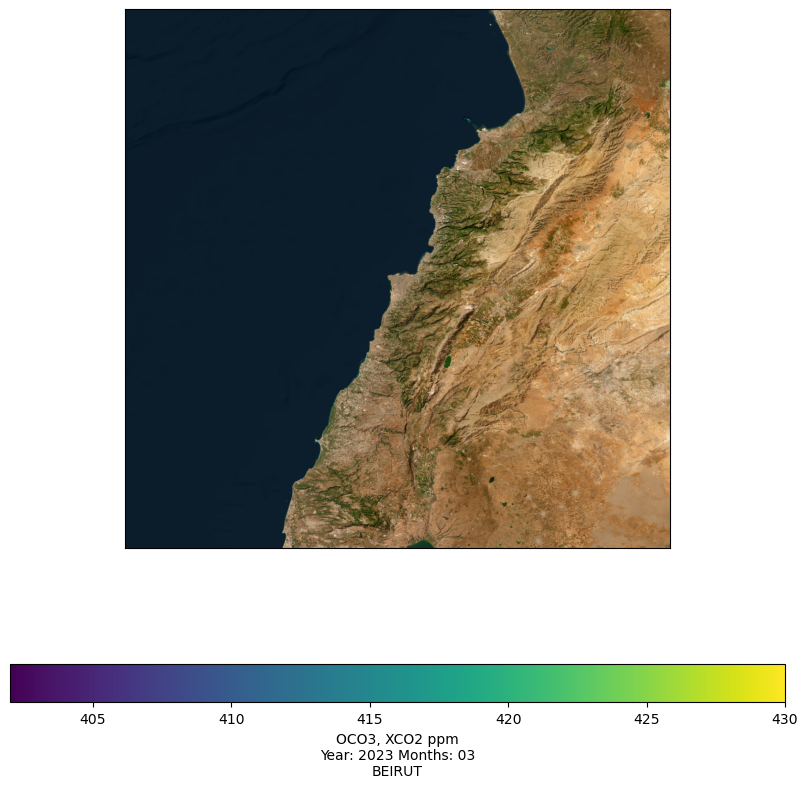

CPU times: total: 6.16 s
Wall time: 8min 18s


In [ ]:
%%time
## For an urban location, enter a city, i.e., "san francisco" (without quotes) then hit RETURN
location= input("Enter the location: ")
geo_loc= Nominatim(user_agent="locate", timeout=4)
info= geo_loc.geocode(str(location)).raw
## get the Bounding box information
loc_bbx= info["boundingbox"]
bbx_list= [float(i) for i in loc_bbx]
print('\n************************************\n')
print("Bbox information of :\n"+f'{location}')
bbx_list
#year= input("Enter the Year: ")
#month= input("Enter the Month: ")
# plot the location
plot_vertices(xco2_total, patches_total, bbx_list, location, year, month)

The Begining of the OCO-2 processing

In [3]:
# 1st step in OCO2
import os
import requests
import earthaccess
from earthaccess import Auth, Store, DataCollections, DataGranules
auth = Auth()
#import datetime
import contextlib

from pathlib import Path

import pandas as pd
import glob

import numpy as np
import netCDF4
from netCDF4 import Dataset

import matplotlib.pyplot as plt

from mpl_toolkits.basemap import Basemap

from scipy.interpolate import griddata

In [ ]:
!pip install earthaccess
!pip install Basemap
!pip install xesmf

In [ ]:
!pip install netCDF4

In [ ]:
# 2nd step in OCO2
%%time
auth = earthaccess.login(strategy="interactive", persist=True)

auth.login(strategy="netrc")
authvalid = auth.authenticated
print('Authenication Valid =',authvalid)

# The Store() class enables download or access to data and is instantiated with the user's auth instance.
store = Store(auth)

Authenication Valid = True
CPU times: total: 0 ns
Wall time: 762 ms


In [ ]:
# 3rdstep in OCO2
%%time
auth = earthaccess.login(strategy="interactive", persist=True)

auth.login(strategy="netrc")
authvalid = auth.authenticated
print('Authenication Valid =',authvalid)

# The Store() class enables download or access to data and is instantiated with the user's auth instance.
store = Store(auth)

Authenication Valid = True
CPU times: total: 0 ns
Wall time: 643 ms


In [ ]:
# 4th step make sure to change folder or keep it
%%time
data_dir_check = os.path.isdir('./data_march_2020_2023')
print("Data directory exists: ",data_dir_check)

if data_dir_check != True:
    os.makedirs('./data_march_2020_2023')
    print("Created local data directory")

Data directory exists:  True
CPU times: total: 0 ns
Wall time: 0 ns


In [ ]:
# 5th step
def cmr_request(params):
    response = requests.get(url,
                        params=params,
                        headers={
                            'Accept': 'application/json',
                        }
                       )
    return response

In [ ]:
# 6th step
%%time
url = 'https://cmr.earthdata.nasa.gov/search/collections'

# Create our request to check that we can access CMR
response = cmr_request(url)

if response.status_code == 200:
    print(str(response.status_code) + ", CMR is accessible")
else:
    print(str(response.status_code) + ", CMR is not accessible, check for outages")

200, CMR is accessible
CPU times: total: 0 ns
Wall time: 776 ms


In [ ]:
# 7th step
%%time
# CMR API base url
cmrurl='https://cmr.earthdata.nasa.gov/search/' # define the base url of NASA's CMR API as the variable `cmrurl`
doi = '10.5067/8E4VLCK16O6Q'                   # OCO-2 dataset DOI

doisearch = cmrurl + 'collections.json?doi=' + doi
print(doisearch)

shortname = requests.get(doisearch).json()['feed']['entry'][0]['short_name']
longname = requests.get(doisearch).json()['feed']['entry'][0]['dataset_id']
version_id = requests.get(doisearch).json()['feed']['entry'][0]['version_id']
print('Short Name = '+shortname)
print('Long Name = '+longname)
print('Version Identifier = '+version_id)

https://cmr.earthdata.nasa.gov/search/collections.json?doi=10.5067/8E4VLCK16O6Q
Short Name = OCO2_L2_Lite_FP
Long Name = OCO-2 Level 2 bias-corrected XCO2 and other select fields from the full-physics retrieval aggregated as daily files, Retrospective processing V11.1r (OCO2_L2_Lite_FP) at GES DISC
Version Identifier = 11.1r
CPU times: total: 31.2 ms
Wall time: 2.71 s


In [ ]:
# 8th step
# Define the quality flag variabe to utilize; in this case, we select 'xco2_quality_flag'.
qfvar = 'xco2_quality_flag'

# Define Measurement Variable Type; in this test case, we select 'xco2'.
measurement = 'xco2'


In [ ]:
# 9th step of OCO2
%%time
# Define the start and end date/time (YYYY-MM-DD).
start_time = '2023-03-01'
end_time = '2023-03-31'

# CMR Query for Data Granules
query = DataGranules().short_name(shortname).version(version_id).temporal(start_time, end_time)

# How many granules are located in the query?
print(f"Granule hits: {query.hits()}")

# Extract all available granule metadata from the query; invoking "-1" for all avaialble granules.
granules = query.get()

# Print sample list of granule metadata
granules[0:1]

Granule hits: 32
CPU times: total: 0 ns
Wall time: 607 ms


[Collection: {'ShortName': 'OCO2_L2_Lite_FP', 'Version': '11.1r'}
 Spatial coverage: {'HorizontalSpatialDomain': {'Geometry': {'BoundingRectangles': [{'WestBoundingCoordinate': -180.0, 'EastBoundingCoordinate': 180.0, 'NorthBoundingCoordinate': 90.0, 'SouthBoundingCoordinate': -90.0}]}}}
 Temporal coverage: {'RangeDateTime': {'BeginningDateTime': '2023-02-28T00:00:00.000Z', 'EndingDateTime': '2023-03-01T00:00:00.000Z'}}
 Size(MB): 66.01602458953857
 Data: ['https://data.gesdisc.earthdata.nasa.gov/data/OCO2_DATA/OCO2_L2_Lite_FP.11.1r/2023/oco2_LtCO2_230228_B11100Ar_230609200232s.nc4']]

In [ ]:
the correct one

In [ ]:
# 9th step of OCO2
try:
    files = store.get(granules[:], local_path="./data_march_2020_2023")
except Exception as e:
    print(f"Error: {e}, we are probably not using this code in the Amazon cloud. Trying external links...")
    # There is hope, even if we are not in the Amazon cloud we can still get the data
    files = store.get(granules[:], access="external", local_path="./data_march_2020_2023")

 Getting 32 granules, approx download size: 1.73 GB


QUEUEING TASKS | :   0%|          | 0/32 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/32 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/32 [00:00<?, ?it/s]

In [ ]:
# do not use this
%%time
time_series_a = []
version_str = 'B11100Ar'
file = ''

# Loop through the date range and plot Carbon Dioxide for each day
for current_date in pd.date_range(start_time, end_time):
    # Open the netCDF file
    file_date = current_date.strftime("%y%m%d")
    file_path_prefix = './data_march_2020_2023/oco2_LtCO2_'+file_date+'_'+version_str+'_'
    file_path = glob.glob(file_path_prefix+'*.nc4')
    print(file_path)
    if file_path != []:
        print('File date = ',file_date)
        #print('File path prefix = ',file_path_prefix)
        print('File path = ',file_path)

        file = file.join(file_path)

        # Open the netCDF file
        dataset = Dataset(f'{file}', 'r')
        print("reading data from =", file_date)

        # Read the data from your variables
        latitude = dataset.variables['latitude'][:]
        longitude = dataset.variables['longitude'][:]
        x_meas = dataset.variables[measurement][:]
        qf = dataset.variables[qfvar][:]

        dataset.close()

        # Filter the data for latitude and longitude
        latitude_max = 30.0
        latitude_min = -30.0
        longitude_max = 180.0
        longitude_min = -180.0

        # Determine the subset selection by latitude and longitude bounding box and quality flag (0 = good)
        selection_only = np.where(
            (latitude > latitude_min) & (latitude < latitude_max) &
            (longitude > longitude_min) &(longitude < longitude_max) & (qf == 0)
        )[0]

        # Apply the subset selection to data variables
        latitude = latitude[selection_only]
        longitude = longitude[selection_only]
        x_meas = x_meas[selection_only]

        pixel_size_deg = 5.0 # 5x5 degree grid resolution

        # Get the grid for the interpolated values
        grid_lat, grid_lon = np.mgrid[latitude_min:latitude_max+pixel_size_deg:pixel_size_deg, longitude_min:longitude_max+pixel_size_deg:pixel_size_deg]

        # Bin the data on a consistent lat/lon grid using griddata using nearest neighbor binning; for bi-linear, use method='linear'
        grid_x = griddata((latitude, longitude), x_meas, (grid_lat, grid_lon), method='nearest', rescale=True)

        time_series_a.append(grid_x)

time_series_a = np.array(time_series_a)
print(time_series_a.shape)
x_meas_month_mean_a = np.mean(time_series_a, axis=0)
print(x_meas_month_mean_a.shape)

This is the modified one

In [ ]:
# 10th step of OCO2
%%time
time_series_b = []
version_str = 'B11100Ar'
file = ''
xco2=[]
longitude_=[]
latitude_=[]
dates_=[]
df_oco2= pd.DataFrame()
# Loop through the date range and plot Carbon Dioxide for each day
#print(pd.date_range(start_time, end_time))
# Loop through the date range and plot Carbon Dioxide for each day
data = {'date': [], 'xco2': [], 'longitude': [], 'latitude': [], 'qf': []}
print(start_time, end_time)
for current_date in pd.date_range(start_time, end_time):
    # Open the netCDF file
    file_date = current_date.strftime("%y%m%d")
    file_path_prefix = './data_march_2020_2023/oco2_LtCO2_'+file_date+'_'+version_str+'_'
    file_path = glob.glob(file_path_prefix+'*.nc4')

    if file_path != []:
        print('File date = ',file_date)
        #print('File path prefix = ',file_path_prefix)
        print('File path = ',file_path)
        file = file.join(file_path)
        # Open the netCDF file
        dataset = Dataset(f'{file}', 'r')
        print("reading data from =", file_date)
        # Read the data from your variables
        dates__ = dataset.variables['date'][:]
        print(dates__.shape)
        latitude = dataset.variables['latitude'][:]
        print(latitude.shape)
        longitude = dataset.variables['longitude'][:]
        print(longitude.shape)
        x_meas = dataset.variables['xco2'][:]
        print(x_meas.shape)
        qf = dataset.variables['xco2_quality_flag'][:]
        print(qf.shape)
        dataset.close()
        # Filter the data for latitude and longitude
        latitude_max = 50.0
        latitude_min = -50.0
        longitude_max = 180.0
        longitude_min = -180.0
        '''latitude_max = 40.0
        latitude_min = -20.0
        longitude_max = 90.0
        longitude_min = -90.0'''

        # Determine the subset selection by latitude and longitude bounding box and quality flag (0 = good)
        selection_only = np.where(
            (latitude > latitude_min) & (latitude < latitude_max) &
            (longitude > longitude_min) &(longitude < longitude_max) & (qf == 0)
        )[0]
        if selection_only.size == 0:
            print(f"Warning: No data points found for {current_date}. Check your filtering criteria.")
            continue # Skip to the next iteration if no data is found
        # Apply the subset selection to data variables
        latitude = latitude[selection_only]
        print(latitude.shape)
        longitude = longitude[selection_only]
        print(longitude.shape)
        x_meas = x_meas[selection_only]
        print(x_meas.shape)
        dates__ = dates__[selection_only]
        print(dates__.shape)
        qf = qf[selection_only]
        print(qf.shape)
        '''xco2.append(x_meas)
        longitude_.append(longitude)
        latitude_.append(latitude)
        dates_.append(dates__)'''
        data['date'].extend(dates__)
        data['xco2'].extend(x_meas)
        data['longitude'].extend(longitude)
        data['latitude'].extend(latitude)
        data['qf'].extend(qf)
        pixel_size_deg =0.25 # 5x5 degree grid resolution
        # Get the grid for the interpolated values
        grid_lat, grid_lon = np.mgrid[latitude_min:latitude_max+pixel_size_deg:pixel_size_deg, longitude_min:longitude_max+pixel_size_deg:pixel_size_deg]

        # Bin the data on a consistent lat/lon grid using griddata using nearest neighbor binning; for bi-linear, use method='linear'
        grid_x = griddata((latitude, longitude), x_meas, (grid_lat, grid_lon), method='nearest', rescale=True)

        time_series_b.append(grid_x)

time_series_b = np.array(time_series_b)
print(time_series_b.shape)
'''df_oco2['date']=  list(np.array(np.concatenate(dates__)))
df_oco2['xco2']= np.array(np.concatenate(xco2)).ravel()
df_oco2['longitude']= list(np.array(np.concatenate(longitude_)))
df_oco2['latitude']= list(np.array(np.concatenate(latitude_)))
print('I am here')
df_oco2['date']= dates__'''
df_oco2= pd.DataFrame()
df_oco2['date']= data['date']
df_oco2['xco2']= data['xco2']
df_oco2['longitude']= data['longitude']
df_oco2['latitude']= data['latitude']
df_oco2['qf']= data['qf']
print('I am here')
'''df_oco2['xco2'] =xco2
df_oco2['longitude']= longitude_
df_oco2['latitude']= latitude_'''
x_meas_month_mean_a = np.mean(time_series_b, axis=0)
df_oco2.to_csv("./data_march_2020_2023/oco2_2023_march.csv")

In [ ]:
print(time_series_a.shape)

In [ ]:
#the above is modified to include per day series two parts the one below and below it

In [ ]:
# 11th step of OCO2
import datetime
import geopandas as gpd
from shapely.geometry import Polygon
import numpy as np
import pandas as pd
filename='./data_march_2020_2023/oco2_2023_march.csv'
df = pd.read_csv(filename)
#arr= np.zeros((len(df),3)).astype(float)
#arr1= np.zeros((len(df),1), dtype='datetime64[ns]')#np.zeros((len(df),1)).astype(datetime)
dtype1 = np.dtype([('date', 'datetime64[D]'),('time', 'datetime64[ns]'), ('XCO2', np.float64), ('Long', np.float64),('Lat', np.float64),('qlt', np.int64)])
arr2 = np.zeros((len(df),)).astype(dtype1)
for i in range(len(df)):
    date_ =  datetime.datetime.strptime(df.loc[i].iat[1][1:-6], "%Y    %m    %d    %H    %M    %S")
    print(date_)
    milliseconds = int(df.loc[i].iat[1][-4:-1])
    print(milliseconds)
    date_ = date_.replace(microsecond=milliseconds * 1000)
    print(date_)
    lon_point = df.loc[i].iat[3]
    print(lon_point)
    lat_point = df.loc[i].iat[4]
    print(type(lat_point))
    arr2[i]['date'] = date_ # Assign values to fields of the structured array
    arr2[i]['time'] = date_
    arr2[i]['XCO2'] = df.loc[i].iat[2]
    arr2[i]['Long'] =     lon_point # Access centroid coordinates correctly
    arr2[i]['Lat'] = lat_point #.iloc[0].y
    arr2[i]['qlt'] = df.loc[i].iat[5]
    #print(arr[i])
#print(arr1.shape)
#print(arr.shape)
#arr2 = np.hstack((arr1,arr))
DF = pd.DataFrame(arr2)
DF.to_csv("./data_july_2020_2023/oco_2_formated_march2023.csv")
#polygon.to_file(filename='polygon.geojson', driver='GeoJSON')
#polygon.to_file(filename='polygon.gpkg', driver="GPKG")
#polygon.to_file(filename='polygon.shp', driver="ESRI Shapefile")

In [ ]:
#creating the grid based on the date

In [ ]:
#step 12
import csv
with open("./data_march_2020_2023/OCO_2_formated_march2023.csv", 'r') as f:
    reader = csv.reader(f, delimiter=",")
    next(reader, None)
    data = np.array(list(reader))  # Keep data as a list of lists

with open("./data_march_2020_2023/OCO_3_formated_march2023.csv", 'r') as f1:
    reader = csv.reader(f1, delimiter=",")
    next(reader, None)
    data1 = np.array(list(reader))  # Keep data1 as a list of lists
data3 = np.concatenate((data, data1))
df = pd.DataFrame(data3) # Create a Pandas DataFrame from data3
df.to_csv("./data_march_2020_2023/OCO_2_OCO_3_joind_and_formated_march2023_.csv", index=False)
data=None
data1=None

In [ ]:
os.chdir('../../')

In [30]:
# if file exists you can use it
# @title
import csv
import numpy as np
with open("./data_March_2020_2023/OCO_2_OCO_3_joind_and_formated_March2021_.csv", 'r') as infile:
    reader = csv.reader(infile, delimiter=",")
    next(reader, None)
    data3 =np.array(list(reader))

In [31]:
# step 13
dtype1 = np.dtype([('Id', np.int32),('date', 'datetime64[D]'),('time', 'datetime64[ns]'), ('XCO2', np.float32), ('Long', np.float32),('Lat', np.float32),('Qual', np.int32) ])
arr2 = np.zeros((len(data3),)).astype(dtype1)

In [32]:
# step 14
arr2['Id'] = data3[:, 0].astype(np.int32)
arr2['date'] = data3[:, 1]
arr2['time'] = data3[:, 2]
arr2['XCO2'] = data3[:, 3].astype(np.float32)
arr2['Long'] = data3[:, 4]
arr2['Lat'] = data3[:, 5]
arr2['Qual'] = data3[:, 6].astype(np.int32)

In [ ]:
#reading station TCCO

In [22]:
# reading many stations
import netCDF4 as nc
import pandas as pd
from datetime import datetime
from datetime import timedelta
import os

def readstations():
  directory = 'C:/Users/Dr. Mohamad Awad/Downloads/'

# Load the station information from the text file into a DataFrame
  station_info = pd.read_csv('C:/Users/Dr. Mohamad Awad/Downloads/stations.txt', delim_whitespace=False,
                           header=None, names=['Code', 'Station',  'Latitude','Longitude',])
  print("stationinfo",station_info)
# Initialize an empty DataFrame to store the combined data
  combined_df = pd.DataFrame()
# Iterate over all the files in the directory
  for filename in os.listdir(directory):
      if filename.endswith('.nc'):
          file_path = os.path.join(directory, filename)

          # Extract the first two letters of the file name
          station_code = filename[:2]

          # Get the station details from the DataFrame
          station_details = station_info[station_info['Code'] == station_code]
          if station_details.empty:
              continue  # If the station code is not found, skip this file

          station_name = station_details['Station'].values[0]
          station_longitude = station_details['Longitude'].values[0]
          station_latitude = station_details['Latitude'].values[0]

          # Open the NetCDF file
          dataset = nc.Dataset(file_path)

          # Extract the time and XCO2 data
          time = dataset.variables['time'][:]
          xco2 = dataset.variables['xco2'][:]

          # Get the units of the time variable
          time_units = dataset.variables['time'].units
          print('Time Units:', time_units)
          # Parse the base time from the time units string
          if 'since' in time_units:
              base_time_str = time_units.split('since')[1].strip()
              try:
                  base_time = datetime.strptime(base_time_str, '%Y-%m-%d %H:%M:%S')
              except ValueError:
                  base_time = datetime.strptime(base_time_str, '%Y-%m-%d')
          else:
              raise ValueError('Unexpected time units format:', time_units)

          # Determine the time unit multiplier
          if 'days' in time_units:
              time_multiplier = 1
          elif 'seconds' in time_units:
              time_multiplier = 1 / (24 * 60 * 60)
          else:
              raise ValueError('Unsupported time units:', time_units)

          # Convert the time to datetime objects
          time_dates = [base_time + timedelta(days=t * time_multiplier) for t in time]

          # Create a DataFrame for the current file
          df = pd.DataFrame({'Time': time_dates, 'XCO2': xco2})

          # Add station details to the DataFrame
          df['Station'] = station_name
          df['Longitude'] = station_longitude
          df['Latitude'] = station_latitude

          # Filter the DataFrame for the month of July (month 7)
          df_july = df[df['Time'].dt.month == 3]

          # Append the filtered data to the combined DataFrame
          combined_df = pd.concat([combined_df, df_july], ignore_index=True)

  # Print the combined DataFrame for the month of July
  print(combined_df)
  return combined_df



In [ ]:
#verification of the created XCO2 with respect to the stations

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from matplotlib.ticker import FuncFormatter, MaxNLocator
# Function to average XCO2 data by day and station
def average_xco2_by_day_station(df):
    df['Day'] = df['Time'].dt.floor('d')  # Extract day from the Time column
    avg_xco2 = df.groupby(['Station', 'Day'], as_index=False)['XCO2'].mean()
    return avg_xco2
# Function to format y-axis labels
def format_func(value, tick_number):
  return f'{value:.3f}'

# Function to calculate RMSE and MAE for each predicted member of the list against the data in the unique stations
def verify(predicted_list, observed_df,save_directory):
    print('I am inside the verify')
    unique_stations = observed_df['Station'].unique()
    num_stations = len(unique_stations)
    days = list(range(1, len(predicted_list) + 1))  # Adjusted to match the number of days in predicted_list

    # Average observed XCO2 data by day and station
    avg_observed_df = average_xco2_by_day_station(observed_df)

    # Ensure that 'Day' in avg_observed_df is of type datetime.date
    avg_observed_df['Day'] = pd.to_datetime(avg_observed_df['Day']).dt.date

    # Initialize dictionaries to store RMSE and MAE for each station
    all_rmse = {station: [] for station in unique_stations}
    all_mae = {station: [] for station in unique_stations}

    # Extract station details from the observed DataFrame
    station_details = observed_df[['Station', 'Latitude', 'Longitude']].drop_duplicates().set_index('Station')

    # Assign unique colors to each station
    colors = plt.cm.get_cmap('tab20', num_stations)

    # Open a file to write the error metrics
    with open("error_metrics.txt", "w") as file:
        file.write("Day\tStation\tRMSE\tMAE\n")

        # Iterate over each predicted DataFrame
        for idx, df in enumerate(predicted_list):
            plt.figure(figsize=(14, 10))

            # Extract flattened grid data from predicted DataFrame
            flat_grid_lat = df['latitude'].values
            flat_grid_lon = df['longitude'].values
            flat_xco2 = df['xco2'].values
            shape1 = int(df['shape1'].values[0])  # Accessing the first value in 'shape1' and cast to an int
            shape2 = int(df['shape2'].values[0])  # Accessing the first value in 'shape2' and cast to an int

            # Plot XCO2 grid
            plt.pcolormesh(flat_grid_lon.reshape((shape1, shape2)), flat_grid_lat.reshape((shape1, shape2)),
                           flat_xco2.reshape((shape1, shape2)), shading='auto', cmap='viridis')
            plt.colorbar(label='XCO2')

            # Create the day_timestamp with only the date part
            day_timestamp = (pd.Timestamp('2021-03-01') + pd.Timedelta(days=idx)).date()

            # Interpolate XCO2 values at the station locations
            grid_points = np.column_stack((flat_grid_lon, flat_grid_lat))
            station_xco2_pred = griddata(grid_points, flat_xco2, (station_details['Longitude'], station_details['Latitude']), method='linear')

            # Calculate RMSE and MAE for each station
            for station_idx, station in enumerate(unique_stations):
                condition = (avg_observed_df['Station'] == station) & (avg_observed_df['Day'] == day_timestamp)
                if condition.any():
                    observed_xco2_value = avg_observed_df.loc[condition, 'XCO2'].values[0]
                    predicted_xco2_value = station_xco2_pred[station_idx]

                    rmse = np.sqrt((predicted_xco2_value - observed_xco2_value)**2)
                    mae = np.abs(predicted_xco2_value - observed_xco2_value)

                    all_rmse[station].append(rmse)
                    all_mae[station].append(mae)

                    # Write the error metrics to the file
                    file.write(f"{idx + 1}\t{station}\t{rmse:.4f}\t{mae:.4f}\n")

                    # Highlight the position of the station point with a unique color
                    plt.scatter(station_details.loc[station, 'Longitude'], station_details.loc[station, 'Latitude'], color=colors(station_idx), s=200, edgecolor='k', label=station, zorder=5)
                else:
                    all_rmse[station].append("N/A")
                    all_mae[station].append("N/A")
                    file.write(f"{idx + 1}\t{station}\tN/A\tN/A\n")

            # Add labels and legend
            plt.xlabel('Longitude')
            plt.ylabel('Latitude')
            plt.title(f'Prediction {idx+1} - XCO2 with Latitude and Longitude')
            plt.legend()
            plt.grid(True)

            # Show plot for each prediction
            plt.show()

        # Print the RMSE and MAE for each station for each day
        print(f"RMSE and MAE for each station for each day:")
        for station in unique_stations:
            print(f"Station {station}: RMSE = {all_rmse[station]}, MAE = {all_mae[station]}")
        print("\n")

    # Print the RMSE and MAE for every station with every predicted DataFrame
    print("Overall RMSE for each station with every predicted DataFrame:")
    rmse_df = pd.DataFrame(all_rmse, index=[f'Predicted {i+1}' for i in range(len(predicted_list))])
    print(rmse_df)

    print("\nOverall MAE for each station with every predicted DataFrame:")
    mae_df = pd.DataFrame(all_mae, index=[f'Predicted {i+1}' for i in range(len(predicted_list))])
    print(mae_df)

    # Plot overall RMSE and MAE for all DataFrames over day
    # Plot RMSE

    # Prepare RMSE data by replacing "N/A" with np.nan
    for station, rmses in all_rmse.items():
        all_rmse[station] = [np.nan if val == "N/A" else val for val in rmses]

    # Plot RMSE
    plt.figure(figsize=(16, 9))  # Increase figure size
    for station, rmses in all_rmse.items():
        plt.plot(days, rmses, label=f'{station} RMSE', marker='o', linestyle='-', color=colors(unique_stations.tolist().index(station)))

    plt.xlabel('Day')
    plt.ylabel('Error (ppm)')  # Add the unit to the y-axis label
    plt.title('RMSE over Time')
    plt.legend()
    plt.grid(True)

    # Set y-axis formatter and reduce the number of y-ticks
    ax = plt.gca()
    ax.yaxis.set_major_formatter(FuncFormatter(format_func))
    ax.yaxis.set_major_locator(MaxNLocator(nbins=10))  # Set a maximum of 10 y-ticks

    # Save the figure to the specified directory
    plt.savefig(f'{save_directory}/rmse_over_time.png')

    plt.show()

    # Prepare MAE data by replacing "N/A" with np.nan
    for station, maes in all_mae.items():
        all_mae[station] = [np.nan if val == "N/A" else val for val in maes]

    # Plot MAE
    plt.figure(figsize=(16, 9))  # Increase figure size
    for station, maes in all_mae.items():
        plt.plot(days, maes, label=f'{station} MAE', marker='s', linestyle='-', color=colors(unique_stations.tolist().index(station)))

    plt.xlabel('Day')
    plt.ylabel('Error (ppm)')  # Add the unit to the y-axis label
    plt.title('MAE over Time')
    plt.legend()
    plt.grid(True)

    # Set y-axis formatter and reduce the number of y-ticks
    ax = plt.gca()
    ax.yaxis.set_major_formatter(FuncFormatter(format_func))
    ax.yaxis.set_major_locator(MaxNLocator(nbins=10))  # Set a maximum of 10 y-ticks

    # Save the figure to the specified directory
    plt.savefig(f'{save_directory}/mae_over_time.png')

    plt.show()



In [ ]:
df = pd.DataFrame(arr2['time'], columns=['datetime_column'])

# Extract the time
df['date_only'] = df['datetime_column'].dt.date
df['time_only'] = df['datetime_column'].dt.time

print(df['date_only'])

df['seconds'] = pd.to_timedelta(df['time_only'].astype(str)).dt.total_seconds()

print(df['seconds'])


0          2022-03-01
1          2022-03-01
2          2022-03-01
3          2022-03-01
4          2022-03-01
              ...    
5495145    2022-03-31
5495146    2022-03-31
5495147    2022-03-31
5495148    2022-03-31
5495149    2022-03-31
Name: date_only, Length: 5495150, dtype: object
0           4019.3
1           4019.3
2           4019.3
3           4019.7
4           4024.0
            ...   
5495145    86250.0
5495146    86252.0
5495147    86252.3
5495148    86252.7
5495149    86253.0
Name: seconds, Length: 5495150, dtype: float64


In [ ]:
dtype2 = np.dtype([('seconds', np.int32), ('XCO2', np.float32), ('Long', np.float32),('Lat', np.float32) ])
arr4 = np.zeros((len(data3),)).astype(dtype2)
arr4['seconds'] = df['seconds']
arr4['Lat'] = arr2['Lat']
arr4['Long'] = arr2['Long']
arr4['XCO2'] = arr2['XCO2']
print(arr4['seconds'])
print(arr4['Lat'])
print(arr4['Long'])
print(arr4['XCO2']  )

[ 4159  4159  4159 ... 85575 85575 85575]
[-36.593464 -36.587082 -36.580547 ...  51.561413  51.576572  51.581047]
[-169.74332 -169.76723 -169.79103 ...  -97.53934  -97.54131  -97.4754 ]
[412.6462  412.79633 412.96835 ... 410.42722 406.71906 406.7846 ]


In [ ]:
import numpy as np
from netCDF4 import Dataset

# Sample data

def create_netcdf2(time,lat,lon,xco2,filename):
  # Create a new NetCDF file
  try:
    # Create a new NetCDF file
    ncfile = Dataset(filename, 'w', format='NETCDF4')

    # Create dimensions
    ncfile.createDimension('time', len(time))
    ncfile.createDimension('lat', len(lat))
    ncfile.createDimension('lon', len(lon))

    # Create variables
    times = ncfile.createVariable('time', np.float64, ('time',))
    latitudes = ncfile.createVariable('lat', np.float32, ('lat',))
    longitudes = ncfile.createVariable('lon', np.float32, ('lon',))
    xco2_var = ncfile.createVariable('xco2', np.float32, ('time', 'lat', 'lon',))

    # Add attributes
    times.units = 'days since 2000-01-01'
    times.long_name = 'Time'
    latitudes.units = 'degrees north'
    latitudes.long_name = 'Latitude'
    longitudes.units = 'degrees east'
    longitudes.long_name = 'Longitude'
    xco2_var.units = 'ppm'
    xco2_var.long_name = 'xco2'

    # Write data to variables
    times[:] = time
    latitudes[:] = lat
    longitudes[:] = lon
    xco2_var[:, :, :] = xco2

    # Close the file
    #ncfile.close()
  except Exception as e:
    print(f"An error occurred: {e}")
  finally:
    ncfile.close()
    print("Dataset closed.")

In [ ]:
time_series_d = []
version_str = 'B11100Ar'
file = ''
df_list= []
latitude_max = 68
latitude_min = -22
longitude_max = 68
longitude_min =-22
'''latitude_max = 50.0
latitude_min = 0.0
longitude_max = 60.0
longitude_min = -10.0'''
alldates= np.unique(arr2[:]['date'])
print(len(alldates))
print(alldates)
for j in range(len(alldates)):
  arr3=arr2[arr2[:]['date'] == np.datetime64( (alldates[j]))]
 #print(len(arr3))
  if len(arr3) > 0:
    X= np.zeros((len(arr3),4)).astype(np.float32)
    # Read the data from your variables
    # Slice X based on the current indices of arr3 in arr2
    #indices = np.where(arr2[:]['date'] == np.datetime64((alldates[j])))[0]
    print(arr3[:])
    X[:,0] = arr3[:]['Lat']
    X[:,1] =arr3[:]['Long']
    X[:,2] =arr3[:]['XCO2']

    df1 = pd.DataFrame(arr3['time'], columns=['datetime_column'])

    # Extract the time
    df1['date_only'] = df1['datetime_column'].dt.date
    df1['time_only'] = df1['datetime_column'].dt.time

    df1['seconds'] = pd.to_timedelta(df1['time_only'].astype(str)).dt.total_seconds()
    X[:,3] = df1['seconds']
    print(X.size)
  # Filter the data for latitude and longitude
  # Determine the subset selection by latitude and longitude bounding box and quality flag (0 = good)
    selection_only = np.where(
      (X[:,0] > latitude_min) & (X[:,0] < latitude_max) &
      (X[:,1] > longitude_min) &(X[:,1] < longitude_max))[0]
    print('this is the selection',len(selection_only))
    # Apply the subset selection to data variables
    X1= np.zeros((len(selection_only),4)).astype(np.float32)
    #Y1= np.zeros((len(selection_only))).astype(np.float32)
    X1[:,:] = X[selection_only,:]

  # Apply the subset selection to data variables
    pixel_size_deg =0.5 # 5x5 degree grid resolution
  # Get the grid for the interpolated values
    grid_lat, grid_lon = np.mgrid[latitude_min:latitude_max+pixel_size_deg:pixel_size_deg, longitude_min:longitude_max+pixel_size_deg:pixel_size_deg]

  # Bin the data on a consistent lat/lon grid using griddata using nearest neighbor binning; for bi-linear, use method='linear'
    grid_x = griddata((X1[:,0], X1[:,1]), X1[:,2], (grid_lat, grid_lon), method='linear', rescale=True)#, fill_value=0, rescale=True)
    time_series_d.append(grid_x)
    dimen = grid_lat.shape
    print("dimension",dimen)
    # Bin the data on a consistent lat/lon grid using griddata using nearest neighbor binning; for bi-linear, use method='linear'
    df1 = pd.DataFrame({
        #'date': df1['date_only'],
        #'time': df1['time_only'],
        'latitude':  grid_lat.flatten(),
        'longitude': grid_lon.flatten(),
        'xco2': grid_x.flatten(),
        'date': j,
        'shape1':dimen[0],
        'shape2':dimen[1]
    })
    df_list.append(df1)
lat1 = np.linspace(-22, 68, grid_x.shape[0])  # 2D latitude array
lon1 = np.linspace(-22, 68, grid_x.shape[1])  # 2D longitude array
time = np.arange(0, 31)  # 1D time array (e.g., periods of the july month)
filename="co2july2020A.nc"
time_series_d= np.array(time_series_d)
create_netcdf2(time,lat1,lon1, time_series_d, filename)
print(time_series_d.shape)
obs_stat=readstations()
verify(df_list,obs_stat)
x_meas_month_mean_aa = np.mean(time_series_d, axis=0)
print(x_meas_month_mean_aa.shape)

31
['2020-07-01' '2020-07-02' '2020-07-03' '2020-07-04' '2020-07-05'
 '2020-07-06' '2020-07-07' '2020-07-08' '2020-07-09' '2020-07-10'
 '2020-07-11' '2020-07-12' '2020-07-13' '2020-07-14' '2020-07-15'
 '2020-07-16' '2020-07-17' '2020-07-18' '2020-07-19' '2020-07-20'
 '2020-07-21' '2020-07-22' '2020-07-23' '2020-07-24' '2020-07-25'
 '2020-07-26' '2020-07-27' '2020-07-28' '2020-07-29' '2020-07-30'
 '2020-07-31']
[(     0, '2020-07-01', '2020-07-01T01:09:19.300000000', 412.6462 , -169.74332, -36.593464, 0)
 (     1, '2020-07-01', '2020-07-01T01:09:19.300000000', 412.79633, -169.76723, -36.587082, 0)
 (     2, '2020-07-01', '2020-07-01T01:09:19.300000000', 412.96835, -169.79103, -36.580547, 0)
 ...
 (128165, '2020-07-01', '2020-07-01T22:35:56.700000000', 413.80542,  159.69531,  38.042496, 0)
 (128166, '2020-07-01', '2020-07-01T22:35:56.700000000', 413.77023,  159.71622,  38.05014 , 0)
 (128167, '2020-07-01', '2020-07-01T22:35:57.000000000', 413.9061 ,  159.736  ,  38.036495, 0)]
795196
thi

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn.metrics import mean_absolute_error, mean_squared_error
from mpl_toolkits.basemap import Basemap
import os
import netCDF4 as nc
import pandas as pd

# Load the data
df_list = []
file_path = "C:/shared/dineof_OCO_2_3_july_2020a.nc"
dataset = nc.Dataset(file_path, 'r')
data = dataset.variables['xco2'][:]
x_interpolated = data
assert time_series_d.shape == x_interpolated.shape, "Shape mismatch between original and interpolated data"
save_dir = "C:/Users/Dr. Mohamad Awad/interp_orig_xco2_2020_2023/july2020a/"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# Calculate error metrics for each day, excluding NaN values
mae_list = []
rmse_list = []
original_data = time_series_d
interpolated_data = x_interpolated

# Write RMSE and MAE values to a text file
with open(os.path.join(save_dir, "error_metrics.txt"), "w") as file:
    file.write("Day\tMAE\tRMSE\n")
    for day in range(31):
        mask = ~np.isnan(original_data[day])
        mae = mean_absolute_error(original_data[day][mask], interpolated_data[day][mask])
        rmse = np.sqrt(mean_squared_error(original_data[day][mask], interpolated_data[day][mask]))
        mae_list.append(mae)
        rmse_list.append(rmse)
        file.write(f"{day+1}\t{mae:.4f}\t{rmse:.4f}\n")

# Save error metrics plot
plt.figure(figsize=(10, 5))
plt.plot(range(1, 32), mae_list, label='MAE', marker='o')
plt.plot(range(1, 32), rmse_list, label='RMSE', marker='x')
plt.xlabel('Day')
plt.ylabel('Error')
plt.title('Error Metrics Over 31 Days')
plt.legend(bbox_to_anchor=(0.5, -0.25), loc='upper center', ncol=2)
plt.grid(False)
plt.savefig(os.path.join(save_dir, 'error_metrics_plot.png'), dpi=300, bbox_inches='tight')
plt.show()

# Define your latitude and longitude limits
latitude_min, latitude_max = -22, 68
longitude_min, longitude_max = -22, 68

# Plotting data
for day in range(31):
    pixel_size_deg = 0.5  # Ensure you define pixel_size_deg somewhere before this loop
    grid_lat, grid_lon = np.mgrid[latitude_min:latitude_max+pixel_size_deg:pixel_size_deg, longitude_min:longitude_max+pixel_size_deg:pixel_size_deg]
    dimen = grid_lat.shape
    print("dimension", dimen)

    df1 = pd.DataFrame({
        'latitude': grid_lat.flatten(),
        'longitude': grid_lon.flatten(),
        'xco2': x_interpolated[day].flatten(),
        'date': day,
        'shape1': dimen[0],
        'shape2': dimen[1]
    })
    df_list.append(df1)

    # Create map plot for original data
    plt.figure(figsize=(14, 10))
    m = Basemap(projection='cyl', resolution='l', llcrnrlat=latitude_min, urcrnrlat=latitude_max, llcrnrlon=longitude_min, urcrnrlon=longitude_max)
    m.drawmapboundary(fill_color='black')
    m.drawcoastlines(linewidth=0.3, color='white')
    m.drawcountries(linewidth=0.2, color='white')
    parallels = np.arange(latitude_min, latitude_max + 1, 20.)
    m.drawparallels(parallels, labels=[True, False, False, False], linewidth=0.3)
    meridians = np.arange(longitude_min, longitude_max + 1, 30.)
    m.drawmeridians(meridians, labels=[False, False, False, True], linewidth=0.3)
    m.drawlsmask(land_color='white', ocean_color='black', lakes=True)
    sc = m.pcolormesh(grid_lon, grid_lat, original_data[day], latlon=True, cmap='jet', alpha=0.9, shading='auto')
    cbar = m.colorbar(sc, location='bottom', pad="20%")
    cbar.set_label('OCO-2 OCO-3 Column-averaged CO2 from the surface to Top of Atmosphere (TOA), ppmv')
    plt.title(f'OCO-2 OCO-3 Column-averaged CO2 daily Average for Original XCO2 Data July 2020 - Day {day+1}')
    plt.savefig(os.path.join(save_dir, f'original_day_{day+1}.png'), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

    # Create map plot for interpolated data
    plt.figure(figsize=(14, 10))
    m = Basemap(projection='cyl', resolution='l', llcrnrlat=latitude_min, urcrnrlat=latitude_max, llcrnrlon=longitude_min, urcrnrlon=longitude_max)
    m.drawmapboundary(fill_color='black')
    m.drawcoastlines(linewidth=0.3, color='white')
    m.drawcountries(linewidth=0.2, color='white')
    parallels = np.arange(latitude_min, latitude_max + 1, 20.)
    m.drawparallels(parallels, labels=[True, False, False, False], linewidth=0.3)
    meridians = np.arange(longitude_min, longitude_max + 1, 30.)
    m.drawmeridians(meridians, labels=[False, False, False, True], linewidth=0.3)
    m.drawlsmask(land_color='white', ocean_color='black', lakes=True)
    sc = m.pcolormesh(grid_lon, grid_lat, x_interpolated[day], latlon=True, cmap='jet', alpha=0.9, shading='auto')
    cbar = m.colorbar(sc, location='bottom', pad="20%")
    cbar.set_label('OCO-2 OCO-3 Column-averaged CO2 from the surface to Top of Atmosphere (TOA), ppmv')
    plt.title(f'OCO-2 OCO-3 Column-averaged CO2 daily Average for Interpolated XCO2 Data July 2020 - Day {day+1}')
    plt.savefig(os.path.join(save_dir, f'interpolation_day_{day+1}.png'), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

    # Scatter plot for each day
    vmin, vmax = np.nanmin(original_data[day]), np.nanmax(interpolated_data[day])
    plt.figure(figsize=(8, 8))
    plt.scatter(original_data[day][mask], interpolated_data[day][mask], alpha=0.3, c='blue', s=10)
    plt.plot([vmin, vmax], [vmin, vmax], 'r--')
    plt.xlabel('Original XCO2 Data')
    plt.ylabel('Interpolated XCO2 Data')
    plt.title(f'Comparison of Original and Interpolated XCO2 Data - July 2020 Day {day+1}')
    plt.grid(False)
    plt.savefig(os.path.join(save_dir, f'scatter_plot_day_{day+1}.png'), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# Assuming you have functions readstations() and verify() defined elsewhere
obs_stat = readstations()
verify(df_list, obs_stat)


In [ ]:
print(len(lat), len(lon))

451 901


In [ ]:
arr2['Id'] = data1[:, 0].astype(np.int32)
arr2['date'] = data1[:, 1]
arr2['time'] = data1[:, 2]
arr2['XCO2'] = data1[:, 3]
arr2['Long'] = data1[:, 4]
arr2['Lat'] = data1[:, 5]
arr2['Qual'] = data1[:, 6].astype(np.int32)

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

def pointIntgrid(points,grid_values, grid_size):
  lat_min = np.min(points[:,0])
  lat_max = np.max(points[:,0])
  lon_min = np.min(points[:,1])
  lon_max = np.max(points[:,1])
  newpoints= np.zeros((len(points),3)).astype(np.float32)
  for i in range (len(points)):
    point = points[i,:]
    lat_idx = int((point[0] - lat_min) // grid_size)
    lon_idx = int((point[1] - lon_min) // grid_size)
    cell_value = grid_values[lat_idx, lon_idx]
    newpoints[i,0] = point[0]
    newpoints[i,1] = point[1]
    newpoints[i,2] = cell_value
    #print(f"Point {point} is in grid cell ({lat_idx}, {lon_idx}) with value {cell_value}")

  # Plot the second array of points
  '''plt.scatter(points[:, 1], points[:, 0], c=points[:,2], cmap='Reds', label='original', edgecolor='black')
  plt.scatter(newpoints[:, 1], newpoints[:, 0], c=newpoints[:,2], cmap='Blues', label='Griddata interp', edgecolor='black')

  # Add colorbars
  plt.colorbar(label='Values of original data', orientation='vertical', pad=0.01, aspect=10)
  plt.colorbar(label='Values of interpolation by grid data', orientation='vertical', pad=0.01, aspect=10)

  # Add labels and legend
  plt.xlabel('Longitude')
  plt.ylabel('Latitude')
  plt.title('Plotting Values of original plus interpolated')
  plt.legend()

  # Show the plot
  plt.show()'''
  print(len(points))
  print(np.count_nonzero(np.isnan(points[:, 2])))
  original_values = points[:, 2]
  print(np.count_nonzero(np.isnan(newpoints[:, 2])))
  predicted_values = newpoints[:, 2]
  mask = ~np.isnan(predicted_values)
  filtered_original = original_values[mask]
  filtered_predicted = predicted_values[mask]

  # Calculate R-squared value
  r2 = r2_score(filtered_original, filtered_predicted)
  print(f"R-squared value: {r2}")
  # Plot the original data points
  ''' plt.scatter(points[:, 1], points[:, 0], c=points[:,2], cmap='Blues', label='Original', edgecolor='black')

  # Plot the predicted data points
  plt.scatter(newpoints[:, 1], newpoints[:, 0], c=newpoints[:,2], cmap='Reds', label='Predicted', edgecolor='black')

  # Add colorbars
  plt.colorbar(label='Values (Original)', orientation='vertical', pad=0.01, aspect=10)
  plt.colorbar(label='Values (Interpolated by DINEOF)', orientation='vertical', pad=0.01, aspect=10)

  # Add labels and legend
  plt.xlabel('Longitude')
  plt.ylabel('Latitude')
  plt.title('Original vs Predicted Data with R-squared')
  plt.legend()

  # Show the plot
  plt.show()'''
  plt.scatter(original_values, predicted_values, color='blue', s=10,label='Original vs RBF interpolation')

  # Plot a line y=x for reference
  plt.plot([min(original_values), max(original_values)], [min(original_values), max(original_values)], color='red', linestyle='--', label='y=x')

  # Add labels and legend
  plt.xlabel('Original Values')
  plt.ylabel('RBF interpolated Values')
  plt.title('Original vs RBF interpolated Values with R-squared')
  plt.legend()

  # Show the plot
  plt.show()


In [ ]:
import torch
print(torch.cuda.is_available())

True


In [ ]:
# This is the correct RBFinterpolator - Use here please

In [ ]:
%%time

from scipy.interpolate import RBFInterpolator, Rbf, CloughTocher2DInterpolator,LinearNDInterpolator,RegularGridInterpolator,NearestNDInterpolator,make_interp_spline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from mpl_toolkits.basemap import Basemap
#import datetime
from timeit import default_timer as timer
start = timer()
latitude_max = 68
latitude_min = -22
longitude_max = 68
longitude_min =-22
a = 0.1
# Get the colormap colors, multiply them with the factor "a", and create new colormap
my_cmap = plt.cm.jet(np.arange(plt.cm.jet.N))
my_cmap[:,0:3] *= a
my_cmap = ListedColormap(my_cmap)
alldates= np.unique(arr2[:]['date'])
#print(len(alldates))
df_list=[]
for j in range(len(alldates)):
  aspect_ratio = (longitude_max - longitude_min) / (latitude_max - latitude_min)
  w = 3600; h = w / aspect_ratio
  dpi = 300;
  plt.figure(figsize=(w / dpi, h / dpi))
  arr3=arr2[arr2[:]['date'] == np.datetime64( (alldates[j]))]
 #print(len(arr3))
  if len(arr3) > 0:
      X= np.zeros((len(arr3),3)).astype(np.float32)
      Y= np.zeros((len(arr3))).astype(np.float32)
      qf= np.zeros((len(arr3))).astype(np.int32)
      X[:,0] = arr3[:]['Lat']
      X[:,1] =arr3[:]['Long']
      X[:,2] =arr3[:]['XCO2']
      qf[:] = arr3[:]['Qual']
      print(X.shape)
      #print(Y.shape)
      selection_only = np.where((X[:,0] > latitude_min) & (X[:,0] < latitude_max) & (X[:,1] > longitude_min) &(X[:,1] < longitude_max) )[0]
      print("length of selection", len(selection_only))
      # Apply the subset selection to data variables
      X1= np.zeros((len(selection_only),3)).astype(np.float32)
      #Y1= np.zeros((len(selection_only))).astype(np.float32)
      X1[:,:] = X[selection_only,:]
      points= np.zeros((len(selection_only),3)).astype(np.float32)
      points[:,0] = X[selection_only,0]
      points[:,1] = X[selection_only,1]
      points[:,2] = X[selection_only,2]
  pixel_size_deg =0.5 # 5x5 degree grid resolution
  num_lat_points = int(np.round((latitude_max - latitude_min) / pixel_size_deg,0)) + 1
  num_lon_points = int(np.round((longitude_max - longitude_min) / pixel_size_deg))+ 1
  print(num_lat_points)
  print(num_lon_points)
  grid_lat, grid_lon = np.mgrid[latitude_min:latitude_max+pixel_size_deg:pixel_size_deg,
                   longitude_min:longitude_max+pixel_size_deg:pixel_size_deg]
  grid_x = griddata((X1[:,0], X1[:,1]), X1[:,2], (grid_lat, grid_lon), method='linear', rescale=True)
  nan_mask = np.isnan(grid_x)
  nan_coords = np.array([grid_lon[nan_mask], grid_lat[nan_mask]]).T
  #xflat = xgrid.reshape(2, -1).T
  print("grid_x size:", grid_x.shape)
  lat_1d =X1[:,0].ravel()
  lon_1d =X1[:,1].ravel()
  #lat_1d =grid_lat.ravel()
  #lon_1d =grid_lon.ravel()
  # Stack them to create the input for RBFInterpolator
  #y = np.stack([grid_lat_1d, grid_lon_1d], axis=-1)
  y = np.stack([lat_1d, lon_1d], axis=-1)
  print("y shape:",y.shape)
  #grid_x = np.nan_to_num(grid_x).astype(np.float32)
  #print("grid values:",grid_x.ravel())
  vmax1=np.max(X1[:,2])
  vmin1= np.min(X1[:,2])
  print("grid max",vmax1)
  print("grid min",vmin1)
  #vmax1=np.max(grid_x)
  #vmin1= np.min(grid_x)
  #print(vmax1)
  #print(vmin1)
  #yflat = RBFInterpolator(y,grid_x.ravel(), kernel='linear')
  rbf = RBFInterpolator(y,X1[:,2].ravel(), kernel='linear',neighbors=2, smoothing=0.1)
  #interpolated_values = yflat(np.stack([grid_lat.ravel(), grid_lon.ravel()], axis=-1))
  #interpolated_values = interpolated_values.reshape(grid_lat.shape)  # Reshape to match grid
  #interpolated_values = yflat(np.stack([lat.ravel(), lon.ravel()], axis=-1))
  #interpolated_values = interpolated_values.reshape(lat.shape)  # Reshape to match grid
  print("I finished running RBFInterpolator")
  interpolated_values = rbf(nan_coords)
  # Replace NaN values with interpolated values from RBFInterpolator
  grid_x[nan_mask] = interpolated_values
  #ax.pcolormesh(*xgrid, ygrid, vmin=-380, vmax=430, shading='gouraud')
  m = Basemap(projection='cyl', resolution='l',
              llcrnrlat=latitude_min, urcrnrlat=latitude_max,  # set latitude limits as previously defined
              llcrnrlon=longitude_min, urcrnrlon=longitude_max)  # set longitude limits as previously defined

  m.drawmapboundary(fill_color='black')
  m.drawcoastlines(linewidth=0.3, color='white')
  m.drawcountries(linewidth=0.2, color='white')

  # Draw parallels (latitude lines) and meridians (longitude lines)
  parallels = np.arange(latitude_min, latitude_max+1, 20.)
  m.drawparallels(parallels, labels=[True,False,False,False], linewidth=0.3)

  meridians = np.arange(longitude_min, longitude_max+1, 30.)
  m.drawmeridians(meridians, labels=[False,False,False,True], linewidth=0.3)
  # Perform RBF interpolation
  #yflat = RBFInterpolator(y,grid_x.ravel(), kernel='linear')

  #p = ax.scatter(*X.T, c=Y, s=50, ec='k', vmin=-380, vmax=430)
  #fig.colorbar(p)
  #plt.show()
  vmax1=np.max(grid_x)
  vmin1= np.min(grid_x)
  print("interpolated max: ", vmax1)
  print("interpolated min: ", vmin1)
  #sc = m.pcolormesh(grid_lat, grid_lon,interpolated_values[:-1,:-1], latlon=True,cmap= my_cmap,vmin=vmin1, vmax=vmax1,shading='flat')#shading='gouraud')#grid_lon, grid_lat, time_series_d[i,:-1,:-1], latlon=True, cmap='jet', alpha=0.9,vmin=vmin1, vmax=vmax1, shading='flat')
  cmap = plt.get_cmap('viridis') #cmap = plt.get_cmap('coolwarm')
  # Use pcolormesh to plot the data
  sc = m.pcolormesh(grid_lon, grid_lat, grid_x[:-1, :-1], latlon=True, cmap=cmap, vmin=vmin1, vmax=vmax1, shading='flat',alpha=0.7)
  # Add a colorbar
  cbar = m.colorbar(sc, location='bottom', pad="5%")
  #cbar.set_ticks([-1, -0.5, 0, 0.5, 1])
  #cbar.set_label('OCO-2-3 Column-averaged CO2 from the surface to Top of Atmosphere (TOA), ppm')
  current_date= alldates[j]
  title_day = "OCO-2-3 Column-averaged CO2 from the surface to Top of Atmosphere (TOA), ppm " + str(current_date)
  plt.title(title_day)
  # Show the plot
  savedir='./data_image_rbfmarch2021/'
  plt.savefig(f"./data_image_rbfmarch2021/"+"RBF_"+ str(current_date)+'.png', dpi=dpi, bbox_inches='tight')
  plt.show()
  plt.close()
  dimen = grid_lat.shape
  df1 = pd.DataFrame({
        'latitude':  grid_lat.flatten(),
        'longitude': grid_lon.flatten(),
        'xco2': grid_x.flatten(),#yflatd[:,:].flatten(),
        'date': j,
        'shape1':dimen[0],
        'shape2':dimen[1]
    })
  df_list.append(df1)
  print("passed DF")
  #current_date= alldates[j]

  X=None
  Y=None
  xgrid=None
  yflat=None
obs_stat=readstations()
print('finished reading stations')
verify(df_list,obs_stat,savedir)
print("without GPU:", timer()-start)

In [ ]:
#testing multiple days

In [ ]:
%%time
import netCDF4 as nc
time_series_d = []
version_str = 'B11100Ar'
file = ''
latitude_max = 50.0
latitude_min = 10.0
longitude_max = 90.0
longitude_min = 0.0
P=3
o=0
file_path = "G:/My Drive/OCO2-OCO3/output/co2july2023_3days_out.nc"  # created by
dataset = nc.Dataset(file_path, 'r')
data = dataset.variables['xco2'][:]  # Replace 'data_variable' with the actual variable name
alldates= np.unique(arr2[:]['date'])
print(len(alldates))
for j in range(0,len(alldates)-1,P):
  arr3=[]
  for i in range(j,j+P,1):
   arr3.extend(arr2[arr2[:]['date'] == np.datetime64( (alldates[i]))])
  print(len(arr3))
  # Read the data from your variables
  latitude = np.array([row['Lat'] for row in arr3]) # Extract 'Lat' values into a numpy array
  longitude = np.array([row['Long'] for row in arr3]) # Extract 'Long' values into a numpy array
  x_meas = np.array([row['XCO2'] for row in arr3]) # Extract 'XCO2' values into a numpy array
  qf = np.array([row['Qual'] for row in arr3]) # Extract 'Qual' values into a numpy array
  # Filter the data for latitude and longitude
  # Determine the subset selection by latitude and longitude bounding box and quality flag (0 = good)
  selection_only = np.where(
      (latitude > latitude_min) & (latitude < latitude_max) &
      (longitude > longitude_min) &(longitude < longitude_max) & (qf == 0)
  )[0]

  # Apply the subset selection to data variables
  latitude = latitude[selection_only]
  longitude = longitude[selection_only]
  x_meas = x_meas[selection_only]
  pixel_size_deg =0.1 # 5x5 degree grid resolution
  points= np.zeros((len(selection_only),3)).astype(np.float32)
  print("length of points", len(points))
  points[:,0] = latitude

  points[:,1] = longitude
  points[:,2] = x_meas

  # Get the grid for the interpolated values
  grid_lat, grid_lon = np.mgrid[latitude_min:latitude_max+pixel_size_deg:pixel_size_deg, longitude_min:longitude_max+pixel_size_deg:pixel_size_deg]

  # Bin the data on a consistent lat/lon grid using griddata using nearest neighbor binning; for bi-linear, use method='linear'
  grid_x = griddata((latitude, longitude), x_meas, (grid_lat, grid_lon), method='linear', rescale=True)#, fill_value=0, rescale=True)
  #pointIntgrid(points,grid_x,pixel_size_deg)
  pointIntgrid(points,data[o,:,:],pixel_size_deg)
  o=o+1
  time_series_d.append(grid_x)
lat = np.linspace(10, 50, grid_x.shape[0])  # 2D latitude array
lon = np.linspace(0, 90, grid_x.shape[1])  # 2D longitude array
time = np.arange(0, 10)  # 1D time array (e.g., periods of the july month)
print(time.shape)
filename="co2july2023_3days.nc"
time_series_d= np.array(time_series_d)
print(time_series_d.shape)
create_netcdf1(time,lat,lon, time_series_d, filename)
x_meas_month_mean_aa = np.mean(time_series_d, axis=0)
print(x_meas_month_mean_aa.shape)

FileNotFoundError: [Errno 2] No such file or directory: b'G:/My Drive/OCO2-OCO3/output/co2july2023_3days_out.nc'

In [ ]:
%%time
import pandas as pd
time_series_b = []
version_str = 'B11100Ar'
file = ''
x_meas1 = []
latitude_max = 40
latitude_min = 20.0
longitude_max = 45
longitude_min =15.0
alldates= np.unique(arr2[:]['date'])
#file_path = "G:/My Drive/OCO2-OCO3/output/co2july2023all3.nc"  # created by
#dataset = nc.Dataset(file_path, 'r')
#data = dataset.variables['xco2'][:]  # Replace 'data_variable' with the actual variable name
#dataset.close()
for j in range(len(alldates)):
  arr3=arr2[arr2[:]['date'] == np.datetime64( (alldates[j]))]
  # Read the data from your variables
  time = arr3[:]['time']
  latitude = arr3[:]['Lat']
  longitude =arr3[:]['Long']
  x_meas = arr3[:]['XCO2']
  qf = arr3[:]['Qual']
  #print(latitude)
  #print(longitude)
  #print(x_meas)
  #print(qf)
  # Filter the data for latitude and longitude
  # Determine the subset selection by latitude and longitude bounding box and quality flag (0 = good)
  selection_only = np.where(
      (latitude > latitude_min) & (latitude < latitude_max) &
      (longitude > longitude_min) &(longitude < longitude_max) & (qf == 0)
  )[0]

  # Apply the subset selection to data variables
  points= np.zeros((len(selection_only),3)).astype(np.float32)
  points[:,0] = latitude[selection_only]
  points[:,1] = longitude[selection_only]
  points[:,2] = x_meas[selection_only]
  latitude = latitude[selection_only]
  longitude = longitude[selection_only]
  time = time[selection_only]
  x_meas = x_meas[selection_only]
  #filename="co2__"+str(alldates[j])+".nc"
  #create_netcdf(array1,filename)
  pixel_size_deg =0.1 # 5x5 degree grid resolution
  # Get the grid for the interpolated values
  grid_lat, grid_lon = np.mgrid[latitude_min:latitude_max+pixel_size_deg:pixel_size_deg, longitude_min:longitude_max+pixel_size_deg:pixel_size_deg]
  # Bin the data on a consistent lat/lon grid using griddata using nearest neighbor binning; for bi-linear, use method='linear'
  grid_x = griddata((latitude, longitude), x_meas, (grid_lat, grid_lon), method='nearest')#, fill_value=0, rescale=True)
  #print(len(data[j,:,:]))
  '''mask = data[j,:,:] > 200
  vmax1=np.max(data[j,:,:][mask] )  # Apply the mask to the slice
  vmin1= np.min(data[j,:,:][mask])
  avrg = (vmax1+vmin1)/2
  print("vmax, vmin, average", vmax1, vmin1, avrg)
  data[j, data[j]< 200] = avrg'''
  #pointIntgrid(points,data[j,:,:],pixel_size_deg)#data[j,:,:],pixel_size_deg)
  #print(grid_x.shape)
  #print(np.count_nonzero(np.isnan(grid_x)))
  '''if np.count_nonzero(np.isnan(grid_x)) >0:
    #print("iam her")
    #print(grid_x)
    #df = pd.DataFrame(grid_x)
    if df.dropna().size >= 3:  # At least 3 points needed for order=2
      df.interpolate(method='polynomial', order=2, inplace=True) # Interpolate if enough data
    else:
      df.interpolate(method='linear', inplace=True) # Fallback to linear interpolation
    #df.interpolate(method='polynomial', order=2, inplace=True)
    #df.interpolate(method='linear', inplace=True)
    #grid_x1 = df.to_numpy()
   #print("after interpolate")
    #if(np.count_nonzero(np.isnan(grid_x1))< np.count_nonzero(np.isnan(grid_x))):
     #print("iam here")
    #print(np.count_nonzero(np.isnan(grid_x1)))
    #time_series_b.append(grid_x1)
  else:'''
  #print(grid_x)
  time_series_b.append(grid_x)
time_series_b = np.array(time_series_b)
print(time_series_b.shape)
'''lat = np.linspace(50, 50, grid_x.shape[0])  # 2D latitude array
lon = np.linspace(-180, 180, grid_x.shape[1])  # 2D longitude array
time = np.arange(0, 31)  # 1D time array (e.g., days of the july month)
print(time.shape)
filename="co2july2023_31.nc"
create_netcdf1(time,lat,lon, time_series_b[0,:,:], filename)
# Create a mask: 1 for valid data, 0 for missing data
mask = ~np.isnan(time_series_b[0,:,:])
filename2 = "maskfile_0.nc"
create_netcdf(time,lat,lon,mask, filename2)
print(mask.shape)'''
x_meas_month_mean_a = np.mean(time_series_b, axis=0)
#print(x_meas_month_mean_a.shape)

In [ ]:
DINEOF results display

In [ ]:
import netCDF4 as nc
import numpy as np
import matplotlib.pyplot as plt
'''latitude_max = 45
latitude_min = 0.0
longitude_max = 90
longitude_min =-0.0'''
latitude_max = 68
latitude_min = -22
longitude_max = 68
longitude_min =-22
# Open the NetCDF file
time_series_e = []
file_path = "C:/shared/dineof_march2020_45_90.nc"  # created by
dataset = nc.Dataset(file_path, 'r')
data = dataset.variables['xco2'][:]  # Replace 'data_variable' with the actual variable name
print(data.shape)
dataset.close()
# Replace 'data_variable' with the actual variable name
alldates= np.unique(arr2[1:]['date'])
print(len(alldates))
P=3
o=0
for j in range(0,len(alldates)):
  aspect_ratio = (longitude_max - longitude_min) / (latitude_max - latitude_min)
  w = 3600; h = w / aspect_ratio
  # Specify figure size (in inches)
  dpi = 300;
  plt.figure(figsize=(w / dpi, h / dpi))
  # Extract variables
  m = Basemap(projection='cyl', resolution='l',
              llcrnrlat=latitude_min, urcrnrlat=latitude_max,  # set latitude limits as previously defined
              llcrnrlon=longitude_min, urcrnrlon=longitude_max)  # set longitude limits as previously defined

  m.drawmapboundary(fill_color='black')
  m.drawcoastlines(linewidth=0.3, color='white')
  m.drawcountries(linewidth=0.2, color='white')

  # Draw parallels (latitude lines) and meridians (longitude lines)
  parallels = np.arange(latitude_min, latitude_max+1, 20.)
  m.drawparallels(parallels, labels=[True,False,False,False], linewidth=0.3)

  meridians = np.arange(longitude_min, longitude_max+1, 30.)
  m.drawmeridians(meridians, labels=[False,False,False,True], linewidth=0.3)

  pixel_size_deg =0.1 # 5 degree resolution

  # Get the grid for the interpolated values
  grid_lat, grid_lon = np.mgrid[latitude_min:latitude_max+pixel_size_deg:pixel_size_deg, longitude_min:longitude_max+pixel_size_deg:pixel_size_deg]
  """mask = data[o,:,:] > 200
  print("this is mask", mask.shape)
  vmax1=np.max(data[o,:,:][mask] )  # Apply the mask to the slice
  vmin1= np.min(data[o,:,:][mask])  # Apply the mask to the slice
  print(vmax1)
  print(vmin1)"""
  vmax1=np.max(data[o,:,:] )  # Apply the mask to the slice
  vmin1= np.min(data[o,:,:])  # Apply the mask to the slice
  print(vmax1)
  print(vmin1)
  #sc = m.pcolormesh(grid_lon, grid_lat, data[o,:-1,:-1], latlon=True, cmap='jet', alpha=0.9, vmin=vmin1, vmax=vmax1, shading='auto')
  sc = m.pcolormesh(grid_lon, grid_lat, data[o,:,:], latlon=True, cmap='jet', alpha=0.9, vmin=vmin1, vmax=vmax1, shading='auto')
  '''mask = time_series_b[j,:,:] > 0
  vmax1=np.max(time_series_b[j,:,:][mask] )  # Apply the mask to the slice
  vmin1= np.min(time_series_b[j,:,:][mask])  # Apply the mask to the slice
  print(vmax1)
  print(vmin1)
  sc = m.pcolormesh(grid_lon, grid_lat, time_series_b[j,:-1,:-1], latlon=True, cmap='jet', alpha=0.9, vmin=vmin1, vmax=vmax1, shading='auto')'''
  #m.scatter(longitude,latitude,c =x_meas,s = 5,cmap = 'Greys')
  # Add a colorbar
  cbar = m.colorbar(sc, location='bottom', pad="20%")
  cbar.set_label('OCO-2 OCO-3 Column-averaged CO2 from the surface to Top of Atmosphere (TOA), ppmv')

  # set plot title
  """n= j
  from_date = alldates[n]
  to_date = alldates[n+2]"""
  #current_date= alldates[i]
  #title_date = current_date.strftime("%b-%Y")
  #plt.title(f'CO-2 Column-averaged CO2 daily Average'+' for '+ str(current_date))
 # plt.title(f'CO-2 Column-averaged CO2 3 days interpolated by DINEOF'+' from '+ str(from_date) + " to " + str(to_date))
  plt.title(f'CO-2 Column-averaged CO2 interpolated by DINEOF'+ str(alldates[j]))
  #plt.title(f'CO-2 Column-averaged CO2 5 days Average
  #\nMin: {title_min:.01f}, Max: {title_max:.01f} ppmv')

  # Save figure to PNG file
  #plt.savefig(f"./data_image_simulation13/"+ str(current_date)+'.png', dpi=dpi, bbox_inches='tight')
  #plt.savefig(f"./data_image_DINEOF/"+  str(from_date) + "_to_" + str(to_date)+'.png', dpi=dpi, bbox_inches='tight')
  plt.savefig(f"./DINEOF_2020_2023_45_90/"+  str(alldates[j])+'.png', dpi=dpi, bbox_inches='tight')
  plt.show()
  plt.close()
  o=o+1

x_meas_month_mean_e = np.mean(data, axis=0)


(451, 901)
422.98221007363406   412.10561339557916


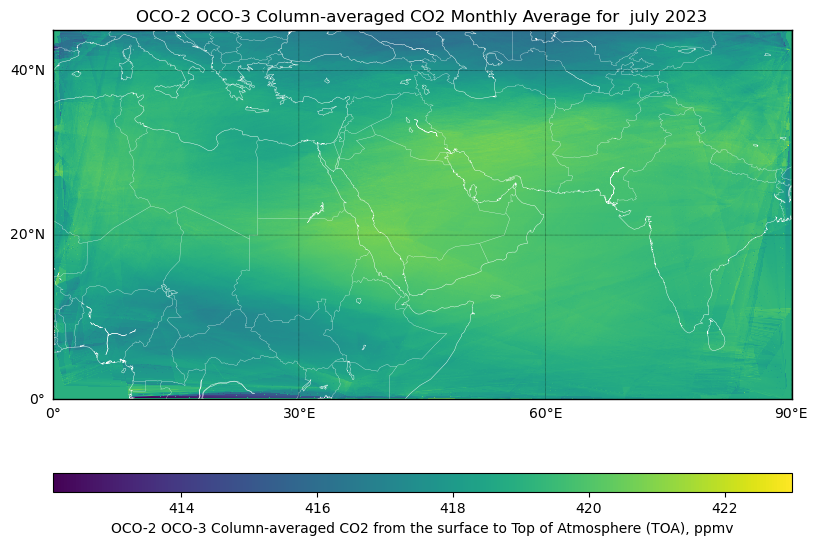

In [ ]:
# Calculate width and height
x_meas_month_mean_e = np.mean(data, axis=0)
save_dir = "C:/Users/Dr. Mohamad Awad/interp_orig_xco2_2020_2023/july2023/"
'''latitude_max = 45
latitude_min = 0.0
longitude_max = 90
longitude_min =0.0'''
latitude_max = 68
latitude_min = -22
longitude_max = 68
longitude_min =-22
from datetime import datetime
aspect_ratio = (longitude_max - longitude_min) / (latitude_max - latitude_min)
w = 3600; h = w / aspect_ratio
current_date = datetime.strptime("july-2023", "%B-%Y")
# Specify figure size (in inches)
dpi = 300;
plt.figure(figsize=(w / dpi, h / dpi))
print(x_meas_month_mean_e.shape)
# Create a basemap instance
m = Basemap(projection='cyl', resolution='l',
            llcrnrlat=latitude_min, urcrnrlat=latitude_max,  # set latitude limits as previously defined
            llcrnrlon=longitude_min, urcrnrlon=longitude_max)  # set longitude limits as previously defined

m.drawmapboundary(fill_color='black')
m.drawcoastlines(linewidth=0.3, color='white')
m.drawcountries(linewidth=0.2, color='white')

# Draw parallels (latitude lines) and meridians (longitude lines)
parallels = np.arange(latitude_min, latitude_max+1, 20.)
m.drawparallels(parallels, labels=[True,False,False,False], linewidth=0.3)

meridians = np.arange(longitude_min, longitude_max+1, 30.)
m.drawmeridians(meridians, labels=[False,False,False,True], linewidth=0.3)

pixel_size_deg =0.1 # 5 degree resolution

# Get the grid for the interpolated values
grid_lat, grid_lon = np.mgrid[latitude_min:latitude_max+pixel_size_deg:pixel_size_deg, longitude_min:longitude_max+pixel_size_deg:pixel_size_deg]
vmax1=np.max(x_meas_month_mean_e )  # Apply the mask to the slice
vmin1= np.min(x_meas_month_mean_e)  # Apply the mask to the slice
'''vmax1=np.max(x_meas_month_mean_a)
vmin1= np.min(x_meas_month_mean_a)'''
print(vmax1," ",vmin1)
# Plot the interpolated data using pcolormesh instead of scatter
m.drawlsmask(land_color='white', ocean_color='black', lakes=True)
sc = m.pcolormesh(grid_lon, grid_lat, x_meas_month_mean_e, latlon=True)#, cmap='jet', alpha=0.9, vmin=vmin1, vmax=vmax1, shading='auto')
#m.scatter(longitude,latitude,c =x_meas,s = 5,cmap = 'Greys')
# Add a colorbar
cbar = m.colorbar(sc, location='bottom', pad="20%")
cbar.set_label('OCO-2 OCO-3 Column-averaged CO2 from the surface to Top of Atmosphere (TOA), ppmv')

# set plot title
title_date = current_date #.strftime("%b-%Y")
plt.title(f'OCO-2 OCO-3 Column-averaged CO2 Monthly Average for  july 2023')
#\nMin: {title_min:.01f}, Max: {title_max:.01f} ppmv')

# Save figure to PNG file
os.chdir(save_dir)
plt.savefig(f'oco2_oco3_co2_month_average_july_2022_qf.png', dpi=dpi, bbox_inches='tight')

plt.show()
plt.close()
os.chdir('../../')

In [ ]:
threshold= 300
count_below_threshold = np.sum(data[0,:,:] < threshold)
print(f'Number of elements below {threshold}:', count_below_threshold)
mask = data[0,:,:] > 1
vmax1=np.max(data[0,:,:][mask] )  # Apply the mask to the slice
vmin1= np.min(data[0,:,:][mask])  # Apply the mask to the slice
print(vmax1)
print(vmin1)
'''# Exclude elements below the threshold
filtered_data = data[data >= threshold]
print('Filtered data:', filtered_data)'''

Number of elements below 300: 1
426.14173559012033
412.75455122166056


"# Exclude elements below the threshold\nfiltered_data = data[data >= threshold]\nprint('Filtered data:', filtered_data)"

In [ ]:
import numpy as np
from netCDF4 import Dataset

# Sample data

def create_netcdf1(time,lat,lon,xco2,filename):
  # Create a new NetCDF file
  try:
    # Create a new NetCDF file
    ncfile = Dataset(filename, 'w', format='NETCDF4')

    # Create dimensions
    ncfile.createDimension('time', len(time))
    ncfile.createDimension('lat', len(lat))
    ncfile.createDimension('lon', len(lon))

    # Create variables
    times = ncfile.createVariable('time', np.float64, ('time',))
    latitudes = ncfile.createVariable('lat', np.float32, ('lat',))
    longitudes = ncfile.createVariable('lon', np.float32, ('lon',))
    xco2_var = ncfile.createVariable('xco2', np.float32, ('time', 'lat', 'lon',))

    # Add attributes
    times.units = 'days since 2000-01-01'
    times.long_name = 'Time'
    latitudes.units = 'degrees north'
    latitudes.long_name = 'Latitude'
    longitudes.units = 'degrees east'
    longitudes.long_name = 'Longitude'
    xco2_var.units = 'ppm'
    xco2_var.long_name = 'xco2'

    # Write data to variables
    times[:] = time
    latitudes[:] = lat
    longitudes[:] = lon
    xco2_var[:, :, :] = xco2

    # Close the file
    #ncfile.close()
  except Exception as e:
    print(f"An error occurred: {e}")
  finally:
    ncfile.close()
    print("Dataset closed.")

In [ ]:
import struct
with open('seacoos2005.avhrr.mask', 'rb') as file:
    data = file.read()
    format_string = 'i' * (len(data) // 4)  # 'i' for int, 4 bytes each
    unpacked_data = struct.unpack(format_string, data)
    print(unpacked_data)

(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 402653184, 1761673216, 2097217536, 16777216, 67108864, 1159266816, 3939398, 402653184, 342165504, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 32831, 3

In [ ]:
!ncdump "./co2july2023L.nc"

In [ ]:
from netCDF4 import Dataset

def create_netcdf(time,lat,lon,mask,filename):
  # Create a new NetCDF file
  try:

    # Create a new NetCDF file
    ncfile = Dataset(filename, 'w', format='NETCDF4')

    # Create dimensions
    ncfile.createDimension('time', len(time))
    ncfile.createDimension('lat', len(lat))
    ncfile.createDimension('lon', len(lon))

    # Create the mask variable
    # Create variables
    times = ncfile.createVariable('time', np.float64, ('time',))
    latitudes = ncfile.createVariable('lat', np.float32, ('lat',))
    longitudes = ncfile.createVariable('lon', np.float32, ('lon',))
    mask_var = ncfile.createVariable('mask',np.int32, ('time', 'lat', 'lon',))

    # Assign the mask data to the variable




    # Add attributes
    times.units = 'days since 2023-01-01'
    times.long_name = 'Time'
    latitudes.units = 'degrees north'
    latitudes.long_name = 'Latitude'
    longitudes.units = 'degrees east'
    longitudes.long_name = 'Longitude'
    mask_var.units = '1'
    mask_var.long_name = 'Data mask (1=valid, 0=missing)'

    # Write data to variables
    times[:] = time
    latitudes[:] = lat
    longitudes[:] = lon
    mask_var[:, :, :] = mask
    # Close the file
    #ncfile.close()
  except Exception as e:
    print(f"An error occurred: {e}")
  finally:
    ncfile.close()
    print("Dataset closed.")


31
0
4928696
[42.544163 42.534615 42.562492 ... 50.696587 50.710808 50.72484 ]
[-165.45332  -165.44719  -165.46017  ...  -82.506744  -82.497826
  -82.48895 ]
[419.5  421.   421.25 ... 413.75 414.25 415.  ]
[0 0 0 ... 0 0 0]
[23.946907 23.995432 24.007439 ... 39.987206 39.9949   39.999172]
(1, 801, 801)
(801, 801)
CPU times: total: 2.34 s
Wall time: 10.9 s


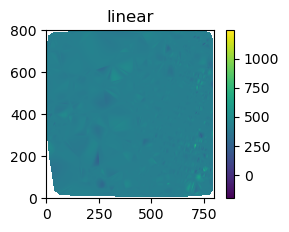

In [ ]:
%%time
time_series_d = []
version_str = 'B11100Ar'
file = ''
latitude_max = 40.0
latitude_min = 0.0
longitude_max = 60.0
longitude_min = 20.0
alldates= np.unique(arr2[:]['date'])
print(len(alldates))
def func(x, y):
    return x*(1-x)*np.cos(4*np.pi*x) * np.sin(4*np.pi*y**2)**2
for j in range(0,len(alldates)-1,30):
  print(j)
  arr3=[]
  for i in range(j,j+30,1):
   arr3.extend(arr2[arr2[:]['date'] == np.datetime64( (alldates[i]))])
  print(len(arr3))
  # Read the data from your variables
  latitude = np.array([row['Lat'] for row in arr3]) # Extract 'Lat' values into a numpy array
  longitude = np.array([row['Long'] for row in arr3]) # Extract 'Long' values into a numpy array
  x_meas = np.array([row['XCO2'] for row in arr3]) # Extract 'XCO2' values into a numpy array
  qf = np.array([row['Qual'] for row in arr3]) # Extract 'Qual' values into a numpy array
  print(latitude)
  print(longitude)
  print(x_meas)
  print(qf)
  # Filter the data for latitude and longitude
  # Determine the subset selection by latitude and longitude bounding box and quality flag (0 = good)
  selection_only = np.where(
      (latitude > latitude_min) & (latitude < latitude_max) &
      (longitude > longitude_min) &(longitude < longitude_max) & (qf == 0)
  )[0]

  # Apply the subset selection to data variables
  latitude = latitude[selection_only]
  longitude = longitude[selection_only]
  x_meas = x_meas[selection_only]
  pixel_size_deg =0.05 # 5x5 degree grid resolution

  # Get the grid for the interpolated values
  grid_lat, grid_lon = np.mgrid[latitude_min:latitude_max+pixel_size_deg:pixel_size_deg, longitude_min:longitude_max+pixel_size_deg:pixel_size_deg]

  # Bin the data on a consistent lat/lon grid using griddata using nearest neighbor binning; for bi-linear, use method='linear'
  grid_x = griddata((latitude, longitude), x_meas, (grid_lat, grid_lon), method='cubic', rescale=True)#, fill_value=0, rescale=True)
  print(latitude)
  plt.subplot(221)
  plt.imshow(grid_x.T, origin='lower')
  plt.colorbar()
  plt.title('linear')
  time_series_d.append(grid_x)
time_series_d= np.array(time_series_d)
print(time_series_d.shape)
x_meas_month_mean_aa = np.mean(time_series_d, axis=0)
print(x_meas_month_mean_aa.shape)

In [ ]:
creating shape files

In [ ]:
# convert to shape file of points
import pandas as pd
import glob,os
import geopandas as gpd
import matplotlib.pyplot as plt
from functools import partial
from geocube.api.core import make_geocube
from geocube.rasterize import rasterize_points_griddata
newpath = './shapefiles'
alldates= np.unique(arr2[:]['date'])
ESRI_WKT = 'GEOGCS["GCS_WGS_1984",DATUM["D_WGS_1984",SPHEROID["WGS_1984",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["Degree",0.017453292519943295]]'
if not os.path.exists(newpath):
    os.makedirs(newpath)
for i in range(2):#len(alldates)):
    filename = 'shapefile_'+ str(dateme[i]) + ".shp"
    arr3=arr2[arr2[:]['date'] == np.datetime64( (alldates[i]))]
    arr4 = pd.DataFrame() # Create arr4 as an empty DataFrame
    arr4['XCO2']=arr3[:]['XCO2']
    arr4['Long']=arr3[:]['Long']
    arr4['Lat']=arr3[:]['Lat']
    print(arr4)
    prt2= newpath + "/" + filename
    data_gdf = gpd.GeoDataFrame(arr4, geometry = gpd.points_from_xy(arr4['Long'], arr4['Lat']),crs=ESRI_WKT)
    geo_grid_cubic = make_geocube(
        data_gdf,
        measurements=['XCO2'],
        resolution=(-1, 1),
        rasterize_function=partial(rasterize_points_griddata, method="cubic"),
        interpolate_na_method="nearest",
    )
    geo_grid_cubic.XCO2.plot.imshow()
    #data_gdf.crs = {'epsg:4326'}
    #data_gdf.to_file(filename= prt2, driver = 'ESRI Shapefile')
    #data_gdf.plot()

In [ ]:
#Reeading oco2 files

In [ ]:
grid on basemap creator

In [ ]:
print(longitude.shape)
print(latitude.shape)

(318947,)
(318947,)


(451, 901)
417.33963818906136   414.9549214950835


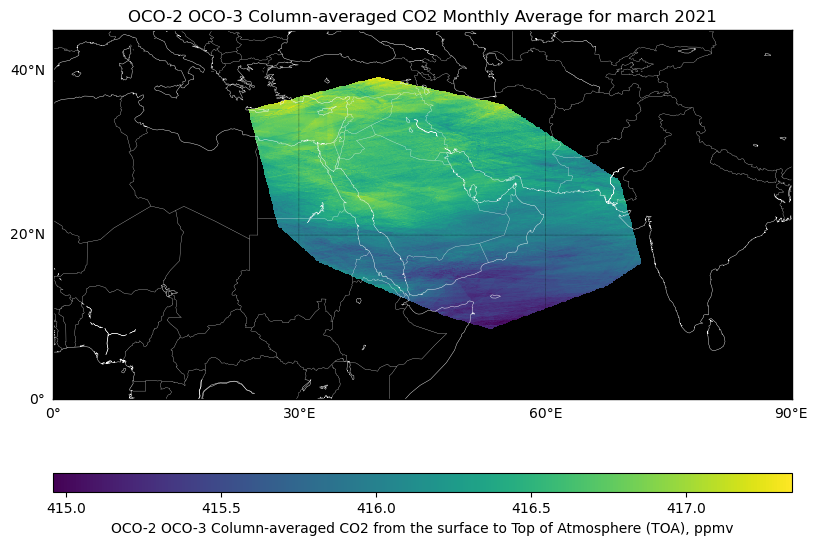

In [ ]:
# Calculate width and height
'''latitude_max = 45
latitude_min = 0.0
longitude_max = 90
longitude_min =0.0'''
latitude_max = 68
latitude_min = -22
longitude_max = 68
longitude_min =-22
from datetime import datetime
aspect_ratio = (longitude_max - longitude_min) / (latitude_max - latitude_min)
w = 3600; h = w / aspect_ratio
current_date = datetime.strptime("March-2021", "%B-%Y")
# Specify figure size (in inches)
dpi = 300;
plt.figure(figsize=(w / dpi, h / dpi))
print(x_meas_month_mean_aa.shape)
# Create a basemap instance
m = Basemap(projection='cyl', resolution='l',
            llcrnrlat=latitude_min, urcrnrlat=latitude_max,  # set latitude limits as previously defined
            llcrnrlon=longitude_min, urcrnrlon=longitude_max)  # set longitude limits as previously defined

m.drawmapboundary(fill_color='black')
m.drawcoastlines(linewidth=0.3, color='white')
m.drawcountries(linewidth=0.2, color='white')

# Draw parallels (latitude lines) and meridians (longitude lines)
parallels = np.arange(latitude_min, latitude_max+1, 20.)
m.drawparallels(parallels, labels=[True,False,False,False], linewidth=0.3)

meridians = np.arange(longitude_min, longitude_max+1, 30.)
m.drawmeridians(meridians, labels=[False,False,False,True], linewidth=0.3)

pixel_size_deg =0.1 # 5 degree resolution

# Get the grid for the interpolated values
grid_lat, grid_lon = np.mgrid[latitude_min:latitude_max+pixel_size_deg:pixel_size_deg, longitude_min:longitude_max+pixel_size_deg:pixel_size_deg]
mask =x_meas_month_mean_aa > 0
vmax1=np.max(x_meas_month_mean_aa[mask] )  # Apply the mask to the slice
vmin1= np.min(x_meas_month_mean_aa[mask])  # Apply the mask to the slice
'''vmax1=np.max(x_meas_month_mean_a)
vmin1= np.min(x_meas_month_mean_a)'''
print(vmax1," ",vmin1)
# Plot the interpolated data using pcolormesh instead of scatter
m.drawlsmask(land_color='white', ocean_color='black', lakes=True)
sc = m.pcolormesh(grid_lon, grid_lat, x_meas_month_mean_aa[:-1,:-1], latlon=True)#, cmap='jet', alpha=0.9, vmin=vmin1, vmax=vmax1, shading='auto')
#m.scatter(longitude,latitude,c =x_meas,s = 5,cmap = 'Greys')
# Add a colorbar
cbar = m.colorbar(sc, location='bottom', pad="20%")
cbar.set_label('OCO-2 OCO-3 Column-averaged CO2 from the surface to Top of Atmosphere (TOA), ppmv')

# set plot title
title_date = current_date #.strftime("%b-%Y")
plt.title(f'OCO-2 OCO-3 Column-averaged CO2 Monthly Average for march 2021')
#\nMin: {title_min:.01f}, Max: {title_max:.01f} ppmv')

# Save figure to PNG file
plt.savefig(f'./DINEOF_2020_2023_45_90/oco2_oco3_co2_month_average_march_2021_gridinterpolated.png', dpi=dpi, bbox_inches='tight')

plt.show()
plt.close()

In [ ]:
Modified grid on basemap creator

In [ ]:
print(len(time_series_b))

In [ ]:
# Calculate width and height
#print(time_series_a.shape[0],time_series_b.shape[0])
#time_series_c= np.zeros((time_series_a.shape[0],2*time_series_a.shape[1],time_series_a.shape[2]))
print(time_series_b.shape)
#time_series_c= np.concatenate((time_series_a, time_series_b),axis=0
for i in range (len(time_series_b)):
  aspect_ratio = (longitude_max - longitude_min) / (latitude_max - latitude_min)
  w = 3600; h = w / aspect_ratio
  dpi = 300;
  plt.figure(figsize=(w / dpi, h / dpi))
#  time_series_c[i]= np.concatenate((time_series_a[i], time_series_b[i]),axis=0)
#print(time_series_b.shape)
# Specify figure size (in inches)

# Create a basemap instance
  m = Basemap(projection='cyl', resolution='l',
              llcrnrlat=latitude_min, urcrnrlat=latitude_max,  # set latitude limits as previously defined
              llcrnrlon=longitude_min, urcrnrlon=longitude_max)  # set longitude limits as previously defined

  m.drawmapboundary(fill_color='black')
  m.drawcoastlines(linewidth=0.3, color='white')
  m.drawcountries(linewidth=0.2, color='white')

  # Draw parallels (latitude lines) and meridians (longitude lines)
  parallels = np.arange(latitude_min, latitude_max+1, 20.)
  m.drawparallels(parallels, labels=[True,False,False,False], linewidth=0.3)

  meridians = np.arange(longitude_min, longitude_max+1, 30.)
  m.drawmeridians(meridians, labels=[False,False,False,True], linewidth=0.3)
  mask = time_series_b[i,:,:] > 0
  vmax1=np.max(time_series_b[i,:,:][mask] )  # Apply the mask to the slice
  vmin1= np.min(time_series_b[i,:,:][mask])  # Apply the mask to the slice
  print(vmax1)
  print(vmin1)
  pixel_size_deg = 0.1 # 5 degree resolution
  # Get the grid for the interpolated values
  grid_lat, grid_lon = np.mgrid[latitude_min:latitude_max+pixel_size_deg:pixel_size_deg, longitude_min:longitude_max+pixel_size_deg:pixel_size_deg]
  #grid_lat, grid_lon = np.mgrid[latmin1:latmax1+pixel_size_deg:pixel_size_deg, lonmin1:lonmax1+pixel_size_deg:pixel_size_deg]
  # Plot the interpolated data using pcolormesh
  #vmin=vmin1, vmax=vmax1
  print(grid_lat.shape)
  print(grid_lon.shape)
  sc = m.pcolormesh(grid_lon, grid_lat, time_series_b[i,:-1,:-1], latlon=True, cmap='jet', alpha=0.9,vmin=vmin1, vmax=vmax1, shading='flat')
  # Plot the interpolated data using pcolormesh instead of scatte
  # Plot the interpolated data using pcolormesh instead of scatter
  #sc = m.pcolormesh(array5[:10000,0], array5[:10000,1], xco2_data, latlon=True, cmap='jet', alpha=0.9, vmin=372.83417, vmax=432.0988, shading='flat') # Use 'flat' shading
  #sc = m.pcolormesh(grid_lat, grid_lon, arr2['XCO2'][:-1].reshape(18,278011), latlon=True, cmap='jet', alpha=0.9, vmin=372.83417, vmax=432.0988, shading='auto')

  # Add a colorbar
  cbar = m.colorbar(sc, location='bottom', pad="20%")
  cbar.set_label('OCO-2-3 Column-averaged CO2 from the surface to Top of Atmosphere (TOA), ppm')

  # set plot title
  '''n= i*3
  from_date = alldates[n]
  to_date = alldates[n+2]'''
  current_date= alldates[i]
  #title_date = current_date.strftime("%b-%Y")
  plt.title(f'CO-2 Column-averaged CO2 daily Average'+' for '+ str(current_date))
  #plt.title(f'CO-2 Column-averaged CO2 3 days '+' from '+ str(from_date) + " to " + str(to_date))
  #plt.title(f'CO-2 Column-averaged CO2 5 days Average
  #\nMin: {title_min:.01f}, Max: {title_max:.01f} ppmv')

  # Save figure to PNG file
  plt.savefig(f"./data_image_simulation13/"+ str(current_date)+'.png', dpi=dpi, bbox_inches='tight')
  #plt.savefig(f"./data_image_simulation13/"+  str(from_date) + "_to_" + str(to_date)+'.png', dpi=dpi, bbox_inches='tight')
  plt.show()
  plt.close()

In [ ]:
#%pip install moviepy
import os
import glob
from natsort import natsorted
from moviepy.editor import *

base_dir = os.path.realpath("./data_image_rbfjuly2023")
print(base_dir)

gif_name = 'pic'
fps = 1

file_list = glob.glob('./data_image_rbfjuly2023/*.png')  # Get all the pngs in the current directory
file_list_sorted = natsorted(file_list,reverse=False)  # Sort the images

clips = [ImageClip(m).set_duration(1)
         for m in file_list_sorted]
concat_clip = concatenate_videoclips(clips, method="compose")
concat_clip.write_videofile("july2023.mp4", fps=fps)

In [ ]:
#reading mask data
import rasterio
import numpy as np

# Function to read raster data
def read_raster(file_path):
    with rasterio.open(file_path) as src:
        data = src.read(1)
        profile = src.profile
    return data, profile

# Read the ESRI grid data (mask)
mask_data, mask_profile = read_raster("C:/Users/Dr. Mohamad Awad/Documents/OCO-2/worldmask")

# Create a binary mask (example: keeping values greater than a threshold)


# Apply the mask to the target raster
masked_target_data = np.where(mask_data, x_meas_month_mean_a, np.nan)

In [ ]:
import geopandas as gpd
import rasterio
from rasterio.features import rasterize
import numpy as np

# Load the shapefile
shapefile = gpd.read_file('C:/Users/Dr. Mohamad Awad/Documents/OCO-2/worldcountriesGC.shp')

# Define the resolution and create a raster template
resolution = 0.1  # Define your resolution
bounds = shapefile.total_bounds
transform = rasterio.transform.from_bounds(bounds[0], bounds[1], bounds[2], bounds[3],
                                           int((bounds[2] - bounds[0]) / resolution),
                                           int((bounds[3] - bounds[1]) / resolution))

# Rasterize the shapefile based on a specific field
field_name = 'flag'  # Replace with your field name
shapes = ((geom, value) for geom, value in zip(shapefile.geometry, shapefile[field_name]))
out_shape = (int((bounds[3] - bounds[1]) / resolution), int((bounds[2] - bounds[0]) / resolution))
raster = rasterize(
    shapes,
    out_shape=out_shape,
    transform=transform,
    fill=0,
    dtype='uint8'
)

# Create the mask
mask = np.where(raster > 0, 1, np.nan)
#masked_target_data = np.where(mask, x_meas_month_mean_a, np.nan)
# Save the mask to a new file
'''with rasterio.open('C:/Users/Dr. Mohamad Awad/Documents/OCO-2/worldcountriesasmask.tif', 'w', driver='GTiff',
                   height=out_shape[0], width=out_shape[1], count=1, dtype='uint8',
                   crs=shapefile.crs, transform=transform) as dst:
    dst.write(mask.astype('uint8'), 1)'''

"with rasterio.open('C:/Users/Dr. Mohamad Awad/Documents/OCO-2/worldcountriesasmask.tif', 'w', driver='GTiff',\n                   height=out_shape[0], width=out_shape[1], count=1, dtype='uint8',\n                   crs=shapefile.crs, transform=transform) as dst:\n    dst.write(mask.astype('uint8'), 1)"

In [ ]:
# to transform mask to target raster both have the same size

In [ ]:
import numpy as np
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import cartopy.crs as ccrs
# Check dimensions
mask_shape = mask.shape
x_meas_month_mean_a=x_meas_month_mean_e
target_shape = x_meas_month_mean_a.shape #x_meas_month_mean_a.shape

# Crop or resize the mask array to match the target array dimensions
if mask_shape != target_shape:
    # Crop the mask array to match the target array dimensions
    mask_cropped = mask[:target_shape[0], :target_shape[1]]
else:
    print("no change")
    mask_cropped = mask
print("Mask shape:", mask_cropped.shape)
print("Target shape:", target_shape)
# Apply the mask to the target array
masked_x_meas_month_mean_a = np.where(mask_cropped == 1, x_meas_month_mean_a[:mask.shape[0],:mask.shape[1]], np.nan)

# Print the shapes to verify

print("Masked target shape:", masked_x_meas_month_mean_a.shape)
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the data
cax = ax.imshow(masked_x_meas_month_mean_a, extent=[-180, 180, -90, 90], transform=ccrs.PlateCarree(), cmap='viridis')

# Add latitude and longitude gridlines
gl = ax.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False

# Add coastlines for reference
#ax.coastlines()
axins = inset_axes(ax,
                   width="2%",  # width of the colorbar as a percentage of the parent axes width
                   height="150%",  # height of the colorbar as a percentage of the parent axes height
                   loc='lower left',  # location of the inset axes
                   bbox_to_anchor=(1.05, 0., 1, 1),  # position relative to the parent axes
                   bbox_transform=ax.transAxes,
                   borderpad=0)

# Add the colorbar to the inset axes
fig.colorbar(cax, cax=axins, orientation='vertical')

plt.show()

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


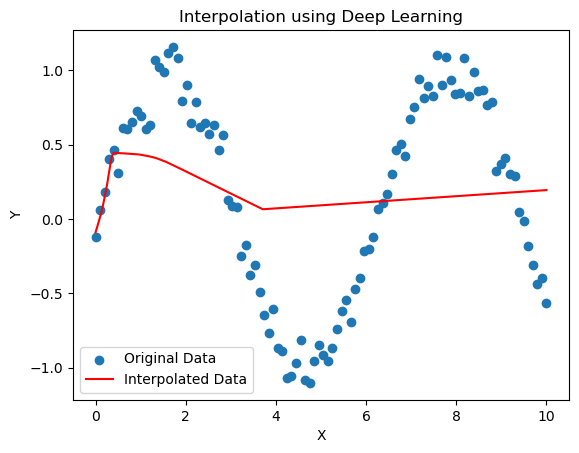

In [ ]:
# to predict using deep learning
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Generate some sample data
x = np.linspace(0, 10, 100)
y = np.sin(x) + np.random.normal(0, 0.1, 100)  # Adding some noise

# Define the model
model = Sequential([
    Dense(64, input_dim=1, activation='relu'),
    Dense(64, activation='relu'),
    Dense(1)
])

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Train the model
model.fit(x, y, epochs=100, verbose=0)

# Generate new data points for interpolation
x_new = np.linspace(0, 10, 1000)
y_new = model.predict(x_new)

# Plot the results
import matplotlib.pyplot as plt

plt.scatter(x, y, label='Original Data')
plt.plot(x_new, y_new, color='red', label='Interpolated Data')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Interpolation using Deep Learning')
plt.legend()
plt.show()

(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[ 15.5 -21.5]]

 [[ 16.  -21.5]]

 [[ 16.5 -21.5]]

 ...

 [[ 63.   51.5]]

 [[ 63.5  51.5]]

 [[ 64.   51.5]]]


C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
298/298 - 1s - 4ms/step - loss: 0.6759 - val_loss: 0.3190
Epoch 2/20
298/298 - 0s - 2ms/step - loss: 0.0107 - val_loss: 0.2809
Epoch 3/20
298/298 - 0s - 2ms/step - loss: 0.0071 - val_loss: 0.2107
Epoch 4/20
298/298 - 1s - 2ms/step - loss: 0.0057 - val_loss: 0.2253
Epoch 5/20
298/298 - 0s - 2ms/step - loss: 0.0052 - val_loss: 0.1997
Epoch 6/20
298/298 - 0s - 2ms/step - loss: 0.0048 - val_loss: 0.2107
Epoch 6: early stopping
430/430 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[397.47970581 397.918396   398.33642578 ... 411.13644409 411.12072754
  411.10662842]
 [397.45547485 397.90509033 398.33728027 ... 411.11730957 411.10494995
  411.0925293 ]
 [397.45956421 397.88589478 398.32919312 ... 411.1043396  411.09210205
  411.07983398]
 ...
 [410.01864624 409.9828186  409.94555664 ... 406.57266235 406.58181763
  406.59353638]
 [409.98339844 409.94494629 409.9052124  ... 406.49902344 406.5072937
  406.516

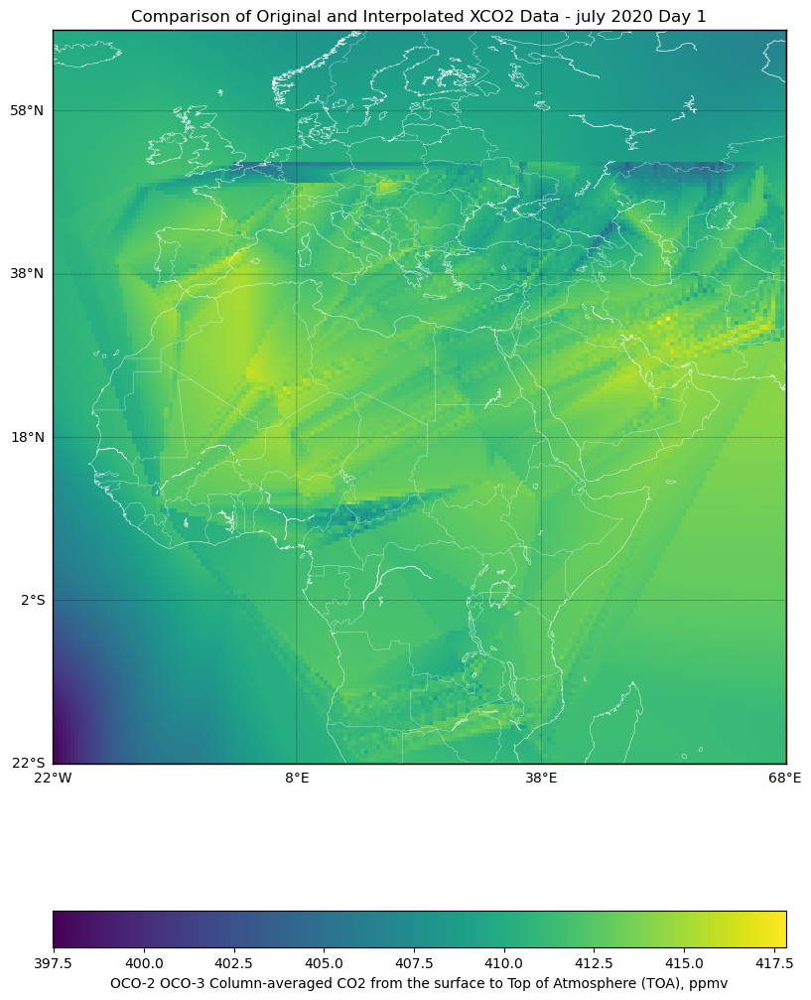

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  397.479706     0     181     181
1         -21.5      -22.0  397.918396     0     181     181
2         -21.0      -22.0  398.336426     0     181     181
3         -20.5      -22.0  398.754120     0     181     181
4         -20.0      -22.0  399.167725     0     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  406.505768     0     181     181
32757      66.5       68.0  406.479401     0     181     181
32758      67.0       68.0  406.453857     0     181     181
32759      67.5       68.0  406.434113     0     181     181
32760      68.0       68.0  406.442200     0     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[-21

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


377/377 - 1s - 3ms/step - loss: 0.1529 - val_loss: 0.3365
Epoch 2/20
377/377 - 1s - 1ms/step - loss: 0.0042 - val_loss: 0.3269
Epoch 3/20
377/377 - 1s - 1ms/step - loss: 0.0031 - val_loss: 0.3039
Epoch 4/20
377/377 - 0s - 1ms/step - loss: 0.0028 - val_loss: 0.2656
Epoch 5/20
377/377 - 0s - 1ms/step - loss: 0.0026 - val_loss: 0.2767
Epoch 5: early stopping
271/271 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[410.99179077 411.09909058 411.20355225 ... 411.25860596 411.27679443
  411.29504395]
 [411.02636719 412.58025096 412.52923567 ... 411.3380127  411.35662842
  411.37527466]
 [411.11065674 412.5918534  412.54083811 ... 411.41860962 411.44085693
  411.4631958 ]
 ...
 [409.66986084 409.78652954 409.90139771 ... 404.45544434 404.38275146
  404.31039429]
 [409.68981934 409.80529785 409.91903687 ... 404.421875   404.34838867
  404.27520752]
 [409.70944214 409.82373047 409.93637085 ... 404.38989258 404.31564331
  4

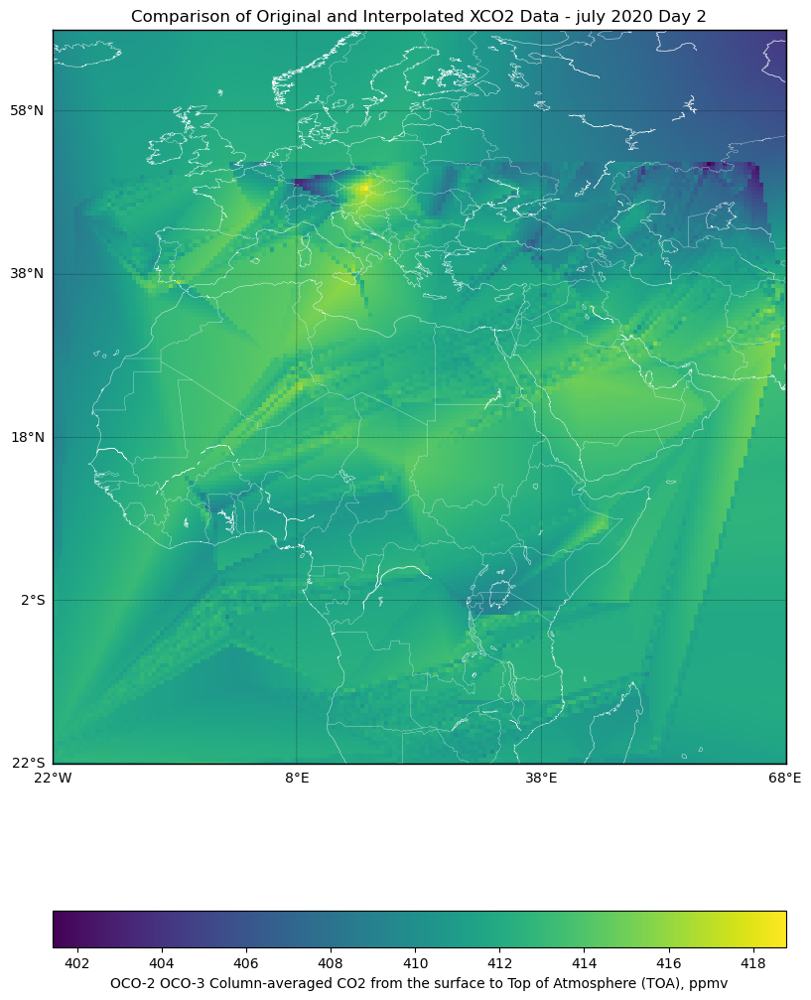

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  410.991791     1     181     181
1         -21.5      -22.0  411.099091     1     181     181
2         -21.0      -22.0  411.203552     1     181     181
3         -20.5      -22.0  411.304993     1     181     181
4         -20.0      -22.0  411.403046     1     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  404.539246     1     181     181
32757      66.5       68.0  404.464417     1     181     181
32758      67.0       68.0  404.389893     1     181     181
32759      67.5       68.0  404.315643     1     181     181
32760      68.0       68.0  404.241638     1     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[ 17

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


310/310 - 1s - 4ms/step - loss: 0.0478 - val_loss: 0.2223
Epoch 2/20
310/310 - 0s - 1ms/step - loss: 0.0071 - val_loss: 0.2084
Epoch 3/20
310/310 - 0s - 1ms/step - loss: 0.0067 - val_loss: 0.2100
Epoch 4/20
310/310 - 0s - 1ms/step - loss: 0.0065 - val_loss: 0.2171
Epoch 5/20
310/310 - 0s - 1ms/step - loss: 0.0064 - val_loss: 0.2381
Epoch 5: early stopping
405/405 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[402.17126465 402.38574219 402.56570435 ... 410.76126099 410.75811768
  410.75543213]
 [402.37512207 402.53674316 402.73898315 ... 410.80871582 410.80511475
  410.8006897 ]
 [402.58804321 402.73965454 402.89068604 ... 410.84820557 410.84106445
  410.83428955]
 ...
 [407.45327759 407.26049805 407.06866455 ... 407.68447876 407.67272949
  407.66094971]
 [407.28463745 407.09024048 406.89691162 ... 407.66143799 407.65179443
  407.64028931]
 [407.11459351 406.91870117 406.72381592 ... 407.64126587 407.62930298
 

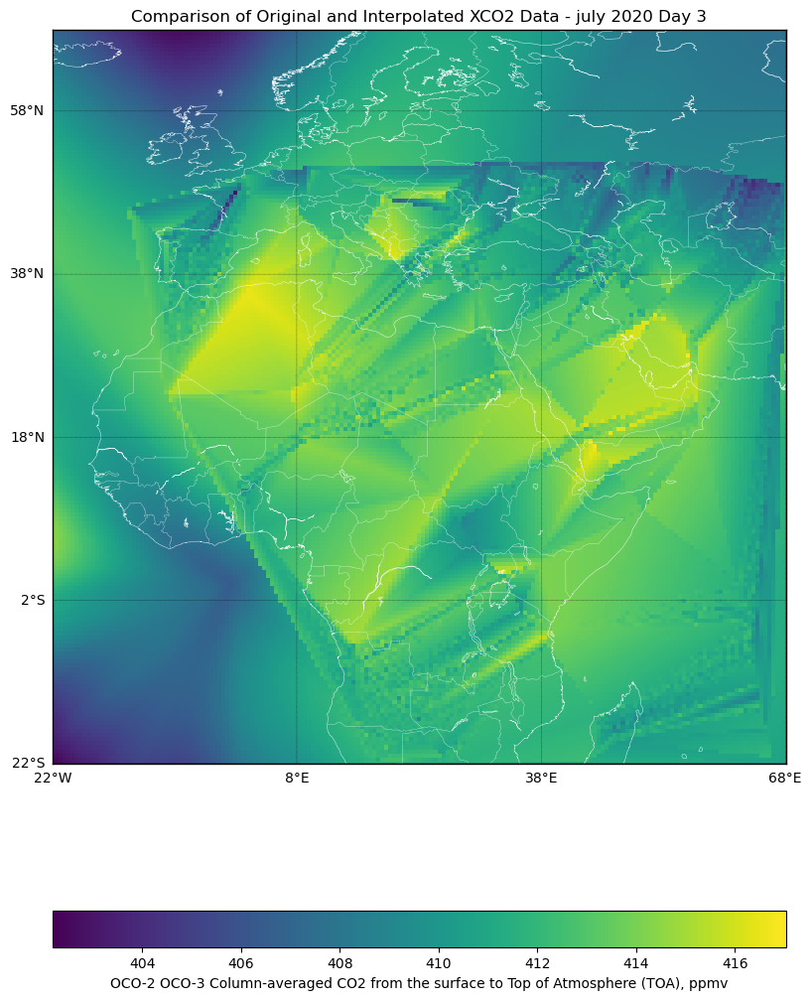

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  402.171265     2     181     181
1         -21.5      -22.0  402.385742     2     181     181
2         -21.0      -22.0  402.565704     2     181     181
3         -20.5      -22.0  402.734802     2     181     181
4         -20.0      -22.0  402.892670     2     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  407.670044     2     181     181
32757      66.5       68.0  407.655151     2     181     181
32758      67.0       68.0  407.641266     2     181     181
32759      67.5       68.0  407.629303     2     181     181
32760      68.0       68.0  407.619873     2     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[-18

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


354/354 - 1s - 3ms/step - loss: 0.2850 - val_loss: 0.4136
Epoch 2/20
354/354 - 0s - 1ms/step - loss: 0.0098 - val_loss: 0.3402
Epoch 3/20
354/354 - 0s - 1ms/step - loss: 0.0081 - val_loss: 0.3236
Epoch 4/20
354/354 - 0s - 1ms/step - loss: 0.0076 - val_loss: 0.3169
Epoch 5/20
354/354 - 0s - 1ms/step - loss: 0.0073 - val_loss: 0.3164
Epoch 5: early stopping
316/316 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[413.38070679 413.33596802 413.29129028 ... 410.70132446 410.69955444
  410.69784546]
 [413.36459351 413.32037354 413.27618408 ... 410.70217896 410.70037842
  410.69866943]
 [413.34793091 413.30426025 413.2605896  ... 410.70306396 410.70123291
  410.69952393]
 ...
 [411.57244873 411.56100464 411.54959106 ... 410.73480225 410.73336792
  410.73196411]
 [411.56369019 411.55218506 411.54071045 ... 410.7336731  410.73223877
  410.73083496]
 [411.55514526 411.54354858 411.53198242 ... 410.73254395 410.73114014
 

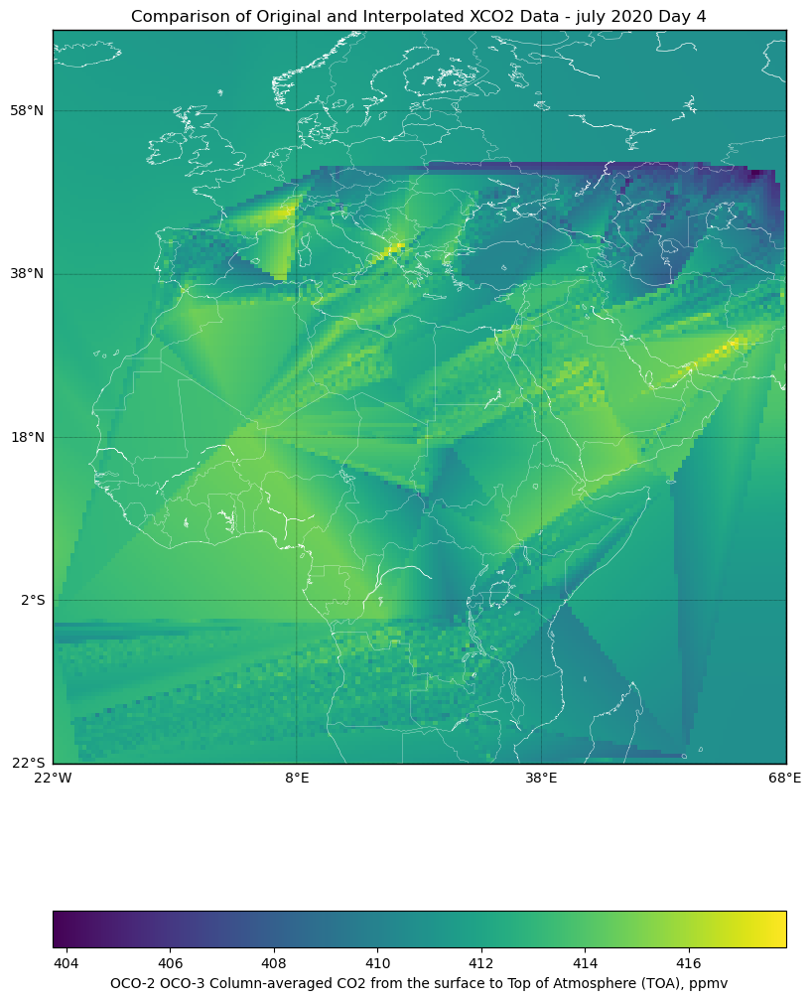

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  413.380707     3     181     181
1         -21.5      -22.0  413.335968     3     181     181
2         -21.0      -22.0  413.291290     3     181     181
3         -20.5      -22.0  413.255127     3     181     181
4         -20.0      -22.0  413.223328     3     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  410.735474     3     181     181
32757      66.5       68.0  410.734009     3     181     181
32758      67.0       68.0  410.732544     3     181     181
32759      67.5       68.0  410.731140     3     181     181
32760      68.0       68.0  410.729767     3     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[ -4

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


324/324 - 1s - 3ms/step - loss: 0.0925 - val_loss: 0.3443
Epoch 2/20
324/324 - 0s - 1ms/step - loss: 0.0067 - val_loss: 0.3194
Epoch 3/20
324/324 - 1s - 2ms/step - loss: 0.0057 - val_loss: 0.3154
Epoch 4/20
324/324 - 0s - 1ms/step - loss: 0.0053 - val_loss: 0.3215
Epoch 5/20
324/324 - 0s - 2ms/step - loss: 0.0052 - val_loss: 0.3251
Epoch 5: early stopping
378/378 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[409.927948   410.0385437  410.1479187  ... 410.58908081 410.58535767
  410.59329224]
 [409.9168396  410.01516724 410.12457275 ... 410.64596558 410.65682983
  410.66796875]
 [409.90182495 410.00427246 410.10144043 ... 410.72058105 410.73196411
  410.74371338]
 ...
 [411.16769409 411.29138184 411.42169189 ... 410.04269409 410.04342651
  410.04354858]
 [411.17468262 411.29797363 411.42047119 ... 410.02603149 410.03076172
  410.03149414]
 [411.18151855 411.3197937  411.41967773 ... 410.00994873 410.01449585
 

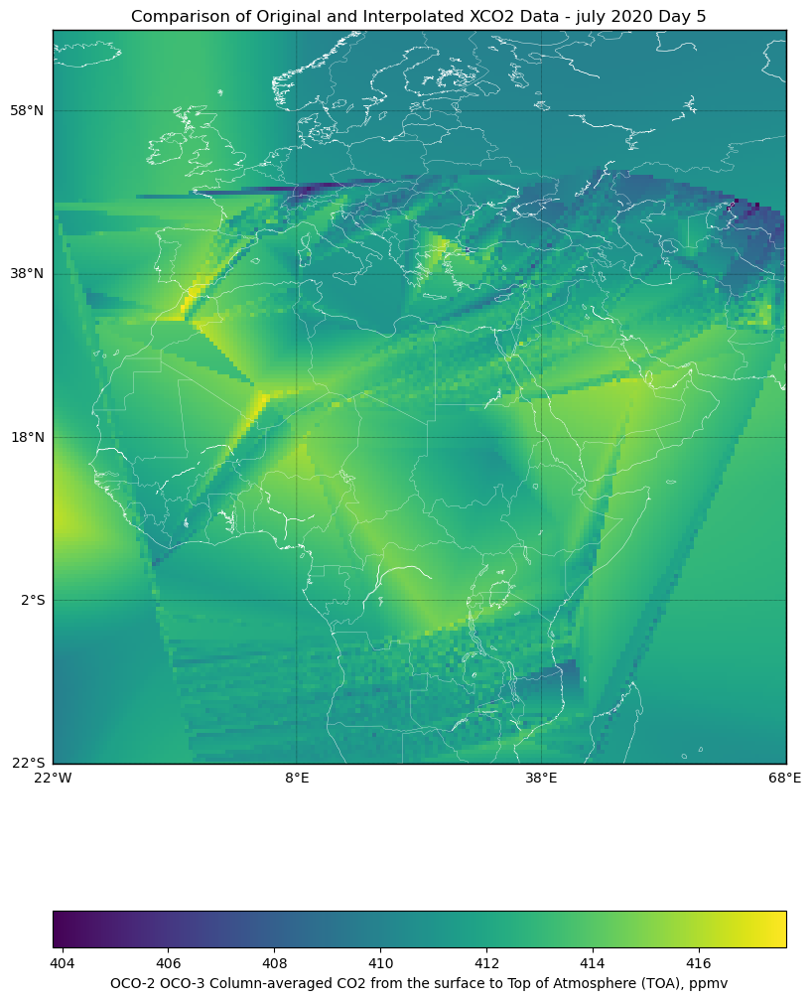

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  409.927948     4     181     181
1         -21.5      -22.0  410.038544     4     181     181
2         -21.0      -22.0  410.147919     4     181     181
3         -20.5      -22.0  410.283508     4     181     181
4         -20.0      -22.0  410.437897     4     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  410.001099     4     181     181
32757      66.5       68.0  410.005493     4     181     181
32758      67.0       68.0  410.009949     4     181     181
32759      67.5       68.0  410.014496     4     181     181
32760      68.0       68.0  410.019135     4     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[-15

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


363/363 - 1s - 3ms/step - loss: 0.0216 - val_loss: 0.2894
Epoch 2/20
363/363 - 0s - 1ms/step - loss: 0.0082 - val_loss: 0.2873
Epoch 3/20
363/363 - 0s - 1ms/step - loss: 0.0069 - val_loss: 0.2658
Epoch 4/20
363/363 - 0s - 1ms/step - loss: 0.0064 - val_loss: 0.2761
Epoch 5/20
363/363 - 0s - 1ms/step - loss: 0.0061 - val_loss: 0.2815
Epoch 5: early stopping
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[409.19998169 409.29702759 409.38668823 ... 411.48797607 411.4828186
  411.4777832 ]
 [409.35565186 409.39025879 409.48571777 ... 411.50933838 411.5045166
  411.49984741]
 [409.55578613 409.54797363 409.58078003 ... 411.53015137 411.52679443
  411.52423096]
 ...
 [409.44830322 409.41595459 409.3888855  ... 409.45825195 409.44256592
  409.42276001]
 [409.38684082 409.35787964 409.3309021  ... 409.4553833  409.44256592
  409.42718506]
 [409.3286438  409.29980469 409.27294922 ... 409.45266724 409.43981934
  4

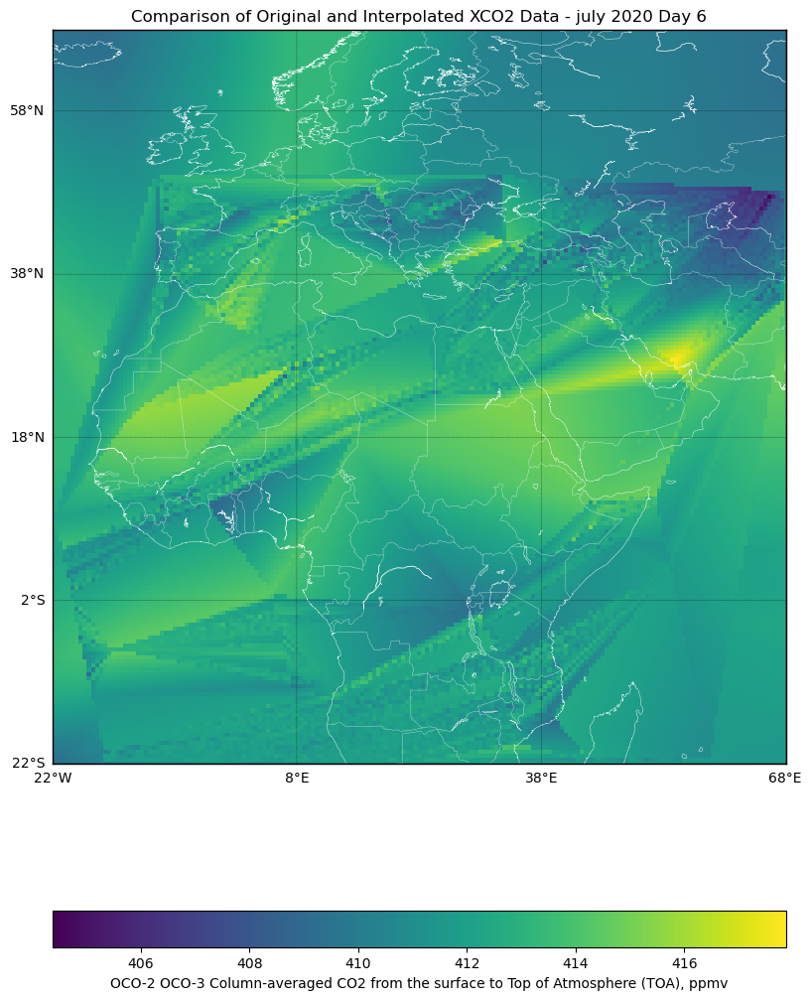

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  409.199982     5     181     181
1         -21.5      -22.0  409.297028     5     181     181
2         -21.0      -22.0  409.386688     5     181     181
3         -20.5      -22.0  409.495483     5     181     181
4         -20.0      -22.0  409.605896     5     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  409.479218     5     181     181
32757      66.5       68.0  409.465820     5     181     181
32758      67.0       68.0  409.452667     5     181     181
32759      67.5       68.0  409.439819     5     181     181
32760      68.0       68.0  409.427216     5     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[ 23

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


264/264 - 1s - 4ms/step - loss: 0.9668 - val_loss: 0.5197
Epoch 2/20
264/264 - 0s - 2ms/step - loss: 0.0106 - val_loss: 0.4682
Epoch 3/20
264/264 - 0s - 2ms/step - loss: 0.0088 - val_loss: 0.4556
Epoch 4/20
264/264 - 0s - 2ms/step - loss: 0.0081 - val_loss: 0.4565
Epoch 5/20
264/264 - 0s - 2ms/step - loss: 0.0079 - val_loss: 0.4576
Epoch 5: early stopping
498/498 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[415.63497925 415.75195312 415.87121582 ... 411.96490479 411.96575928
  411.96655273]
 [415.5637207  415.68505859 415.80557251 ... 411.96801758 411.96875
  411.96948242]
 [415.49487305 415.61645508 415.7409668  ... 411.97109985 411.97174072
  411.97232056]
 ...
 [414.35256958 414.30755615 414.26275635 ... 406.83374023 406.84155273
  406.84991455]
 [414.34927368 414.30300903 414.25698853 ... 406.7557373  406.76248169
  406.77072144]
 [414.34539795 414.29785156 414.25064087 ... 406.67977905 406.68435669
  40

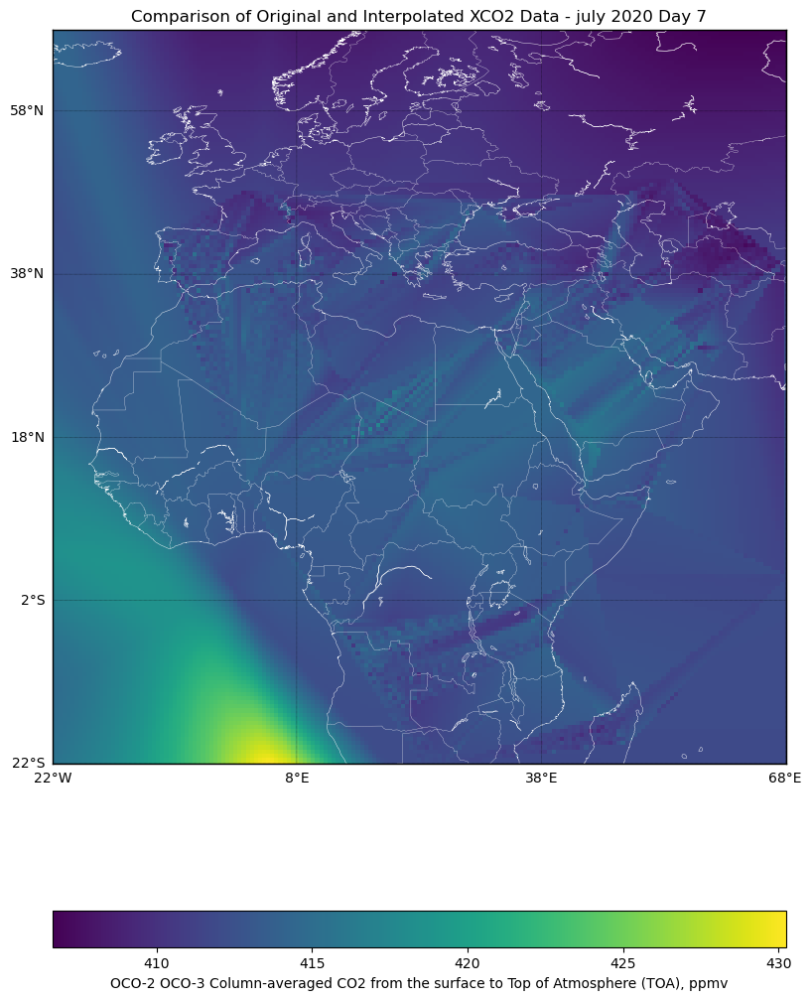

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  415.634979     6     181     181
1         -21.5      -22.0  415.751953     6     181     181
2         -21.0      -22.0  415.871216     6     181     181
3         -20.5      -22.0  415.992889     6     181     181
4         -20.0      -22.0  416.118652     6     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  406.671600     6     181     181
32757      66.5       68.0  406.675537     6     181     181
32758      67.0       68.0  406.679779     6     181     181
32759      67.5       68.0  406.684357     6     181     181
32760      68.0       68.0  406.691498     6     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[ 13

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


286/286 - 1s - 3ms/step - loss: 72.3332 - val_loss: 0.3879
Epoch 2/20
286/286 - 0s - 1ms/step - loss: 0.0220 - val_loss: 0.3857
Epoch 3/20
286/286 - 0s - 2ms/step - loss: 0.0219 - val_loss: 0.3853
Epoch 4/20
286/286 - 0s - 2ms/step - loss: 0.0219 - val_loss: 0.3854
Epoch 5/20
286/286 - 0s - 1ms/step - loss: 0.0219 - val_loss: 0.3884
Epoch 5: early stopping
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[412.08691406 412.08691406 412.08691406 ... 412.08691406 412.08691406
  412.08691406]
 [412.08691406 412.08691406 412.08691406 ... 412.08691406 412.08691406
  412.08691406]
 [412.08691406 412.08691406 412.08691406 ... 412.08691406 412.08691406
  412.08691406]
 ...
 [412.08691406 412.08691406 412.08691406 ... 412.08691406 412.08691406
  412.08691406]
 [412.08691406 412.08691406 412.08691406 ... 412.08691406 412.08691406
  412.08691406]
 [412.08691406 412.08691406 412.08691406 ... 412.08691406 412.08691406


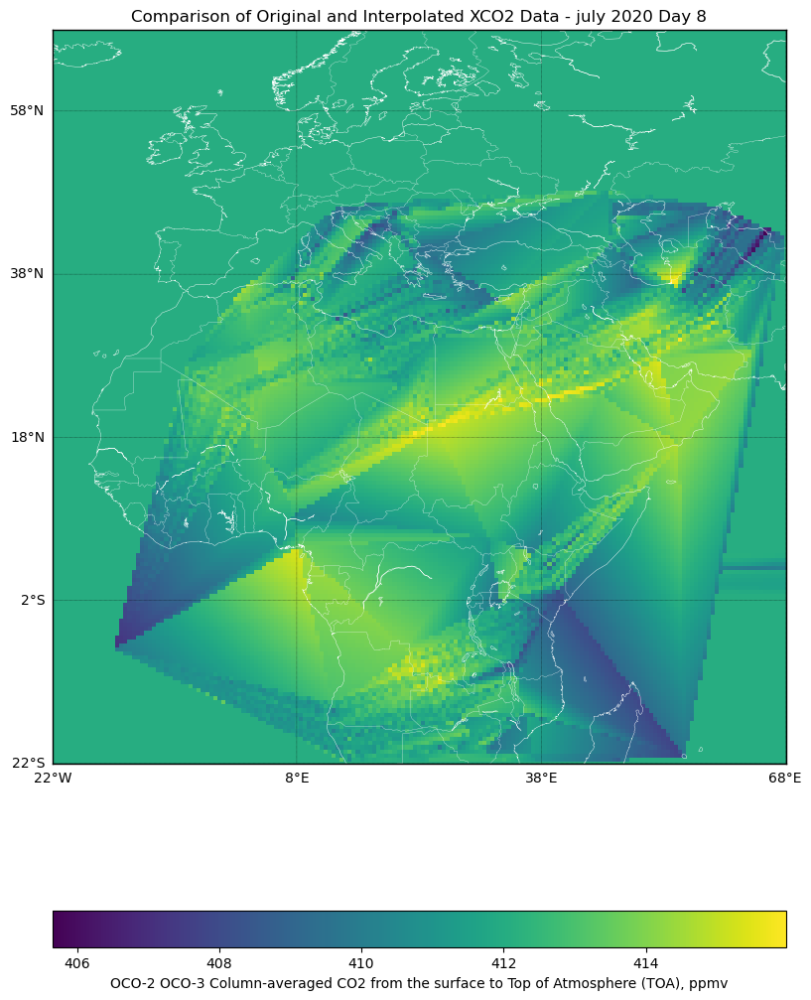

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  412.086914     7     181     181
1         -21.5      -22.0  412.086914     7     181     181
2         -21.0      -22.0  412.086914     7     181     181
3         -20.5      -22.0  412.086914     7     181     181
4         -20.0      -22.0  412.086914     7     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  412.086914     7     181     181
32757      66.5       68.0  412.086914     7     181     181
32758      67.0       68.0  412.086914     7     181     181
32759      67.5       68.0  412.086914     7     181     181
32760      68.0       68.0  412.086914     7     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[  1

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
297/297 - 1s - 3ms/step - loss: 0.1150 - val_loss: 0.1731
Epoch 2/20
297/297 - 0s - 1ms/step - loss: 0.0090 - val_loss: 0.2016
Epoch 3/20
297/297 - 0s - 1ms/step - loss: 0.0077 - val_loss: 0.2217
Epoch 4/20
297/297 - 0s - 1ms/step - loss: 0.0072 - val_loss: 0.2262
Epoch 5/20
297/297 - 0s - 1ms/step - loss: 0.0070 - val_loss: 0.2407
Epoch 5: early stopping
430/430 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[410.80291748 410.94622803 411.13439941 ... 411.6784668  411.67886353
  411.67922974]
 [410.69937134 410.83752441 410.97946167 ... 411.67034912 411.67019653
  411.67001343]
 [410.6222229  410.73382568 410.87072754 ... 411.66210938 411.66140747
  411.66073608]
 ...
 [409.91546631 409.97631836 410.03839111 ... 410.14181519 410.14447021
  410.14703369]
 [409.90811157 409.97024536 410.03344727 ... 410.13433838 410.13705444
  410.13964844]
 [409.90176392 409.96505737 410.02941895 ... 410.12692261 410

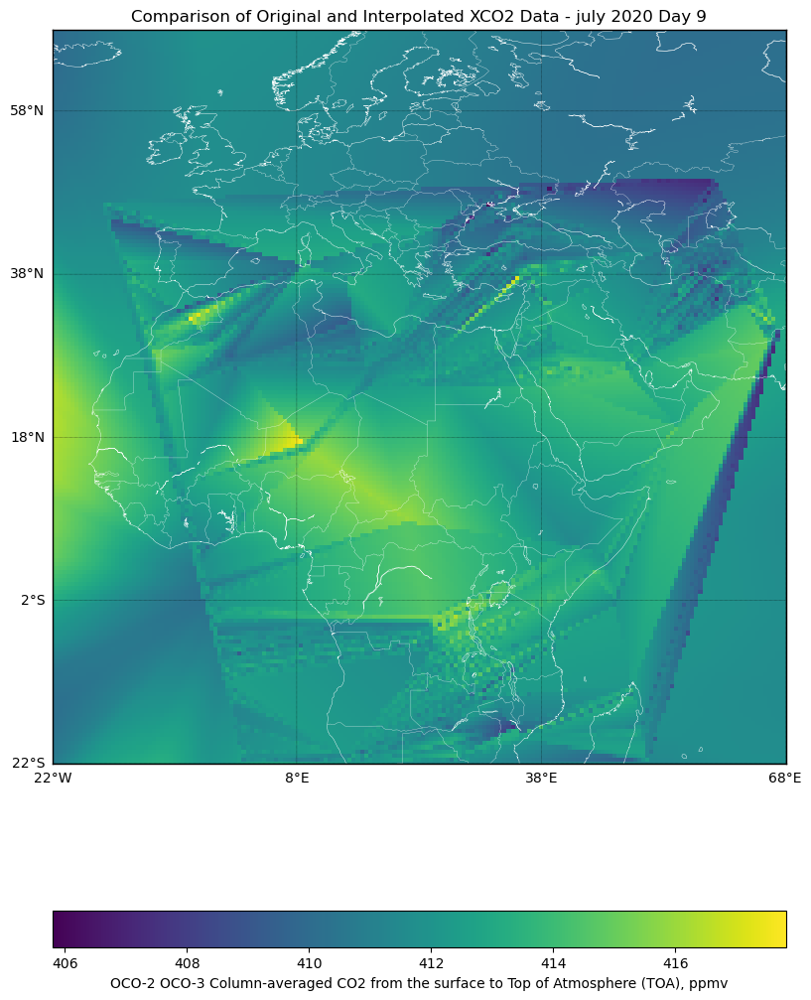

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  410.802917     8     181     181
1         -21.5      -22.0  410.946228     8     181     181
2         -21.0      -22.0  411.134399     8     181     181
3         -20.5      -22.0  411.323486     8     181     181
4         -20.0      -22.0  411.511963     8     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  410.120972     8     181     181
32757      66.5       68.0  410.124023     8     181     181
32758      67.0       68.0  410.126923     8     181     181
32759      67.5       68.0  410.129700     8     181     181
32760      68.0       68.0  410.132416     8     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[ 15

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
300/300 - 1s - 3ms/step - loss: 0.7402 - val_loss: 0.2223
Epoch 2/20
300/300 - 0s - 1ms/step - loss: 0.0078 - val_loss: 0.1722
Epoch 3/20
300/300 - 0s - 1ms/step - loss: 0.0069 - val_loss: 0.1430
Epoch 4/20
300/300 - 0s - 1ms/step - loss: 0.0065 - val_loss: 0.1554
Epoch 5/20
300/300 - 0s - 1ms/step - loss: 0.0063 - val_loss: 0.1275
Epoch 6/20
300/300 - 0s - 1ms/step - loss: 0.0063 - val_loss: 0.1165
Epoch 7/20
300/300 - 0s - 1ms/step - loss: 0.0061 - val_loss: 0.1100
Epoch 8/20
300/300 - 0s - 1ms/step - loss: 0.0059 - val_loss: 0.1056
Epoch 9/20
300/300 - 0s - 1ms/step - loss: 0.0058 - val_loss: 0.1148
Epoch 9: early stopping
425/425 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[400.81079102 400.91085815 401.0112915  ... 411.46432495 411.4637146
  411.46368408]
 [400.86584473 400.96591187 401.0663147  ... 411.47790527 411.47720337
  411.47711182]
 [400.92080688 401.02090454 401.12130737 ... 411.490

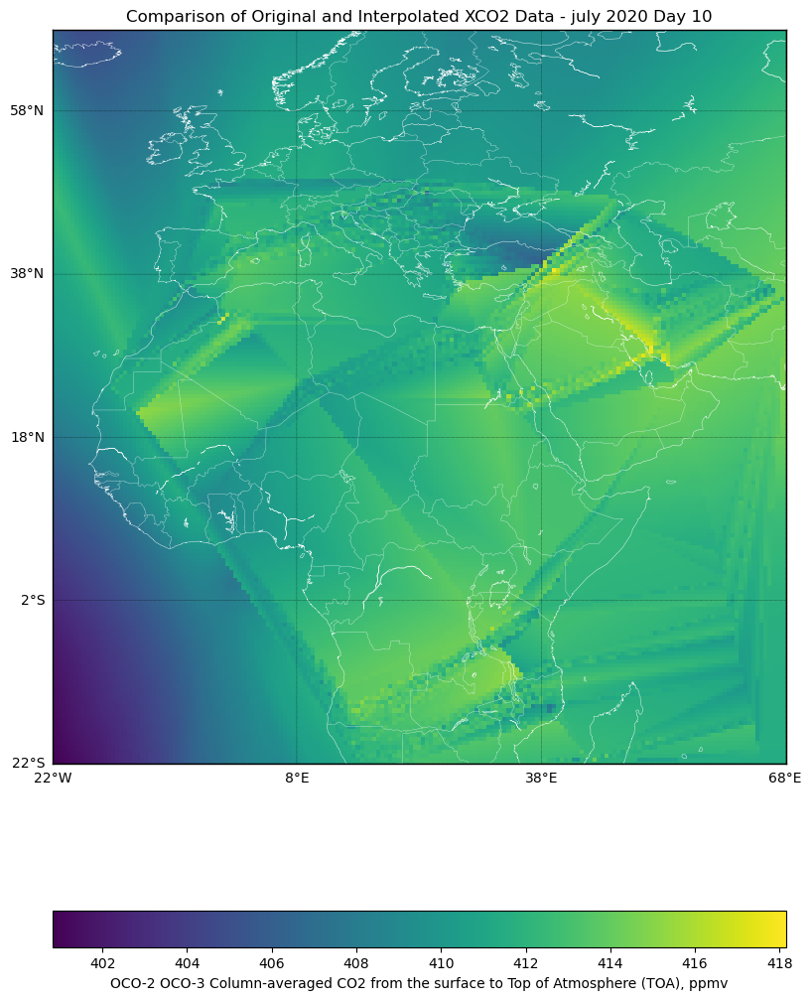

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  400.810791     9     181     181
1         -21.5      -22.0  400.910858     9     181     181
2         -21.0      -22.0  401.011292     9     181     181
3         -20.5      -22.0  401.112122     9     181     181
4         -20.0      -22.0  401.213379     9     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  411.163086     9     181     181
32757      66.5       68.0  411.226227     9     181     181
32758      67.0       68.0  411.289429     9     181     181
32759      67.5       68.0  411.352600     9     181     181
32760      68.0       68.0  411.415863     9     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[-20

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
344/344 - 1s - 3ms/step - loss: 0.0155 - val_loss: 0.1316
Epoch 2/20
344/344 - 0s - 1ms/step - loss: 0.0060 - val_loss: 0.1011
Epoch 3/20
344/344 - 0s - 1ms/step - loss: 0.0050 - val_loss: 0.1098
Epoch 4/20
344/344 - 0s - 1ms/step - loss: 0.0046 - val_loss: 0.0973
Epoch 5/20
344/344 - 0s - 1ms/step - loss: 0.0044 - val_loss: 0.1043
Epoch 6/20
344/344 - 0s - 1ms/step - loss: 0.0042 - val_loss: 0.1030
Epoch 7/20
344/344 - 0s - 1ms/step - loss: 0.0041 - val_loss: 0.1137
Epoch 8/20
344/344 - 0s - 1ms/step - loss: 0.0040 - val_loss: 0.1078
Epoch 9/20
344/344 - 0s - 1ms/step - loss: 0.0039 - val_loss: 0.0914
Epoch 10/20
344/344 - 0s - 1ms/step - loss: 0.0039 - val_loss: 0.0950
Epoch 11/20
344/344 - 0s - 1ms/step - loss: 0.0038 - val_loss: 0.0894
Epoch 12/20
344/344 - 0s - 1ms/step - loss: 0.0038 - val_loss: 0.1022
Epoch 13/20
344/344 - 0s - 1ms/step - loss: 0.0038 - val_loss: 0.0945
Epoch 14/20
344/344 - 0s - 1ms/step - loss: 0.0037 - val_loss: 0.0946
Epoch 15/20
344/344 - 0s - 1m

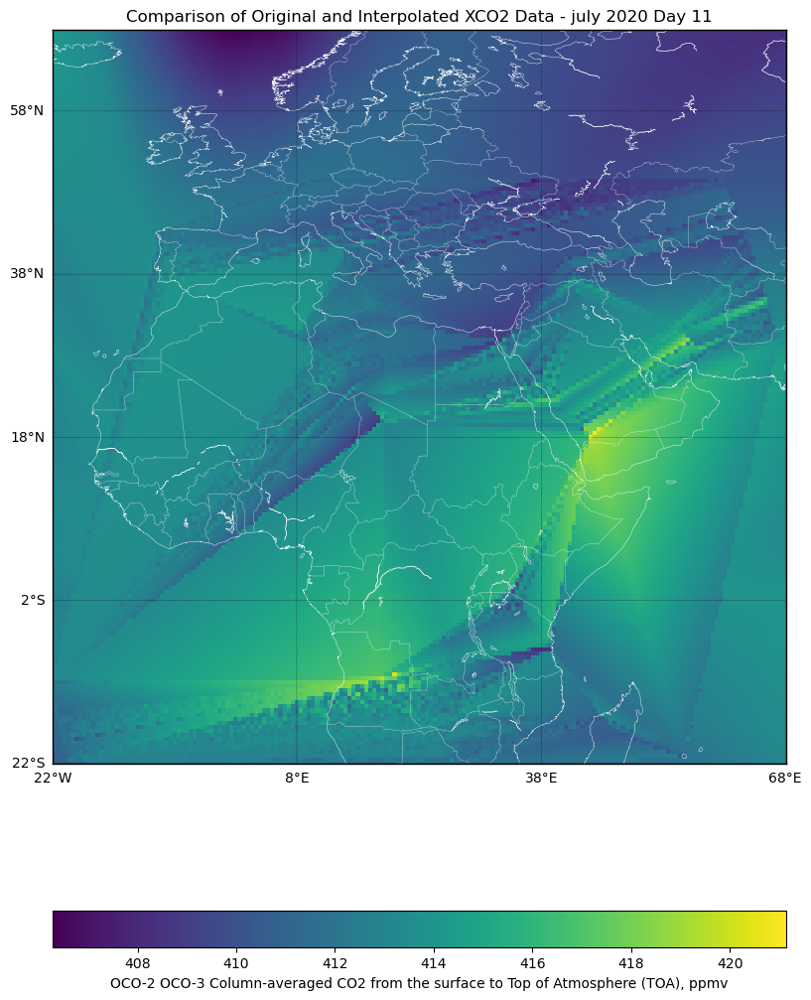

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  410.461700    10     181     181
1         -21.5      -22.0  410.589447    10     181     181
2         -21.0      -22.0  410.730530    10     181     181
3         -20.5      -22.0  410.876343    10     181     181
4         -20.0      -22.0  411.022217    10     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  408.221497    10     181     181
32757      66.5       68.0  408.232910    10     181     181
32758      67.0       68.0  408.257599    10     181     181
32759      67.5       68.0  408.291016    10     181     181
32760      68.0       68.0  408.323212    10     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[ -6

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


311/311 - 1s - 3ms/step - loss: 0.0274 - val_loss: 0.0874
Epoch 2/20
311/311 - 0s - 1ms/step - loss: 0.0100 - val_loss: 0.0860
Epoch 3/20
311/311 - 0s - 2ms/step - loss: 0.0092 - val_loss: 0.0951
Epoch 4/20
311/311 - 0s - 1ms/step - loss: 0.0089 - val_loss: 0.0630
Epoch 5/20
311/311 - 0s - 1ms/step - loss: 0.0087 - val_loss: 0.0740
Epoch 6/20
311/311 - 0s - 1ms/step - loss: 0.0085 - val_loss: 0.1099
Epoch 7/20
311/311 - 0s - 1ms/step - loss: 0.0083 - val_loss: 0.0754
Epoch 8/20
311/311 - 0s - 1ms/step - loss: 0.0084 - val_loss: 0.0612
Epoch 9/20
311/311 - 0s - 1ms/step - loss: 0.0082 - val_loss: 0.0961
Epoch 10/20
311/311 - 0s - 1ms/step - loss: 0.0081 - val_loss: 0.0674
Epoch 11/20
311/311 - 0s - 1ms/step - loss: 0.0081 - val_loss: 0.0901
Epoch 12/20
311/311 - 0s - 1ms/step - loss: 0.0080 - val_loss: 0.0819
Epoch 13/20
311/311 - 0s - 1ms/step - loss: 0.0080 - val_loss: 0.0670
Epoch 13: early stopping
404/404 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]

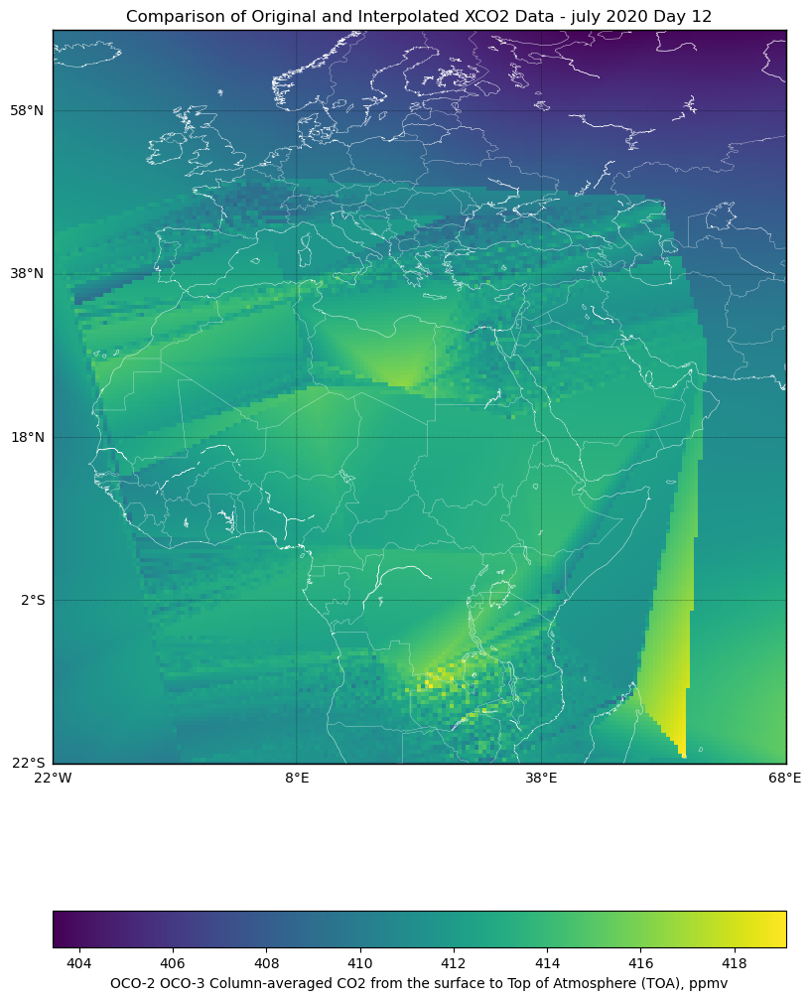

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  409.939606    11     181     181
1         -21.5      -22.0  409.961945    11     181     181
2         -21.0      -22.0  409.968262    11     181     181
3         -20.5      -22.0  409.973511    11     181     181
4         -20.0      -22.0  409.981445    11     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  403.694855    11     181     181
32757      66.5       68.0  403.701782    11     181     181
32758      67.0       68.0  403.708344    11     181     181
32759      67.5       68.0  403.716431    11     181     181
32760      68.0       68.0  403.725952    11     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[  8

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


288/288 - 1s - 4ms/step - loss: 0.0598 - val_loss: 0.2084
Epoch 2/20
288/288 - 0s - 2ms/step - loss: 0.0076 - val_loss: 0.1845
Epoch 3/20
288/288 - 0s - 1ms/step - loss: 0.0069 - val_loss: 0.2061
Epoch 4/20
288/288 - 0s - 1ms/step - loss: 0.0065 - val_loss: 0.1470
Epoch 5/20
288/288 - 0s - 1ms/step - loss: 0.0063 - val_loss: 0.1954
Epoch 5: early stopping
449/449 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[399.35635376 399.54333496 399.75332642 ... 410.3381958  410.31845093
  410.29577637]
 [399.45510864 399.59463501 399.7835083  ... 410.33752441 410.31329346
  410.28936768]
 [399.59161377 399.69186401 399.83282471 ... 410.33145142 410.30697632
  410.28283691]
 ...
 [410.52203369 410.55148315 410.58050537 ... 408.93908691 408.93795776
  408.93890381]
 [410.51498413 410.54449463 410.5736084  ... 408.91915894 408.91705322
  408.91595459]
 [410.50845337 410.5380249  410.56726074 ... 408.90109253 408.89752197
 

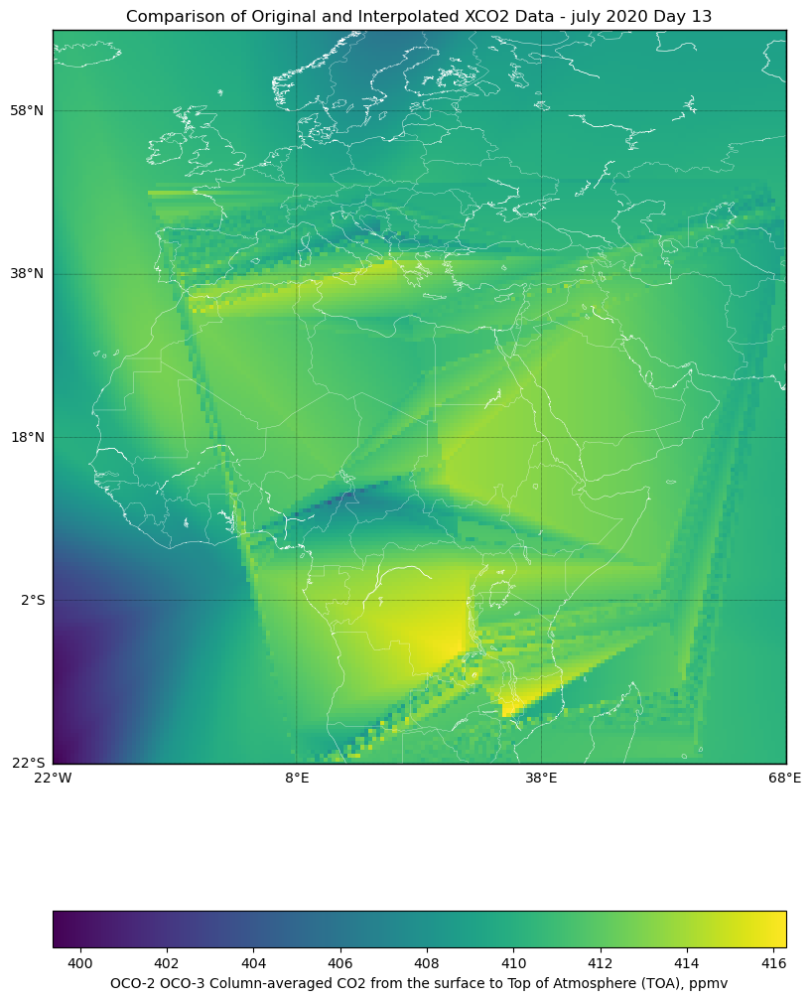

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  399.356354    12     181     181
1         -21.5      -22.0  399.543335    12     181     181
2         -21.0      -22.0  399.753326    12     181     181
3         -20.5      -22.0  400.009125    12     181     181
4         -20.0      -22.0  400.274414    12     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  408.902069    12     181     181
32757      66.5       68.0  408.901978    12     181     181
32758      67.0       68.0  408.901093    12     181     181
32759      67.5       68.0  408.897522    12     181     181
32760      68.0       68.0  408.895416    12     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[ 20

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


199/199 - 1s - 5ms/step - loss: 0.0189 - val_loss: 0.1445
Epoch 2/20
199/199 - 0s - 2ms/step - loss: 0.0043 - val_loss: 0.1574
Epoch 3/20
199/199 - 0s - 2ms/step - loss: 0.0027 - val_loss: 0.1576
Epoch 4/20
199/199 - 0s - 2ms/step - loss: 0.0026 - val_loss: 0.1492
Epoch 5/20
199/199 - 0s - 2ms/step - loss: 0.0025 - val_loss: 0.1631
Epoch 5: early stopping
627/627 ━━━━━━━━━━━━━━━━━━━━ 1s 766us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[432.51849365 432.02389526 431.57781982 ... 409.67694092 409.65063477
  409.62442017]
 [432.07263184 431.62820435 431.14456177 ... 409.75994873 409.73278809
  409.70574951]
 [431.61099243 431.1831665  430.7494812  ... 409.84130859 409.81329346
  409.78543091]
 ...
 [399.21551514 399.41778564 399.62161255 ... 408.4203186  408.43011475
  408.44052124]
 [399.1925354  399.39547729 399.59988403 ... 408.38394165 408.39321899
  408.40286255]
 [399.17007446 399.37359619 399.5786438  ... 408.34899902 408.3576355
  

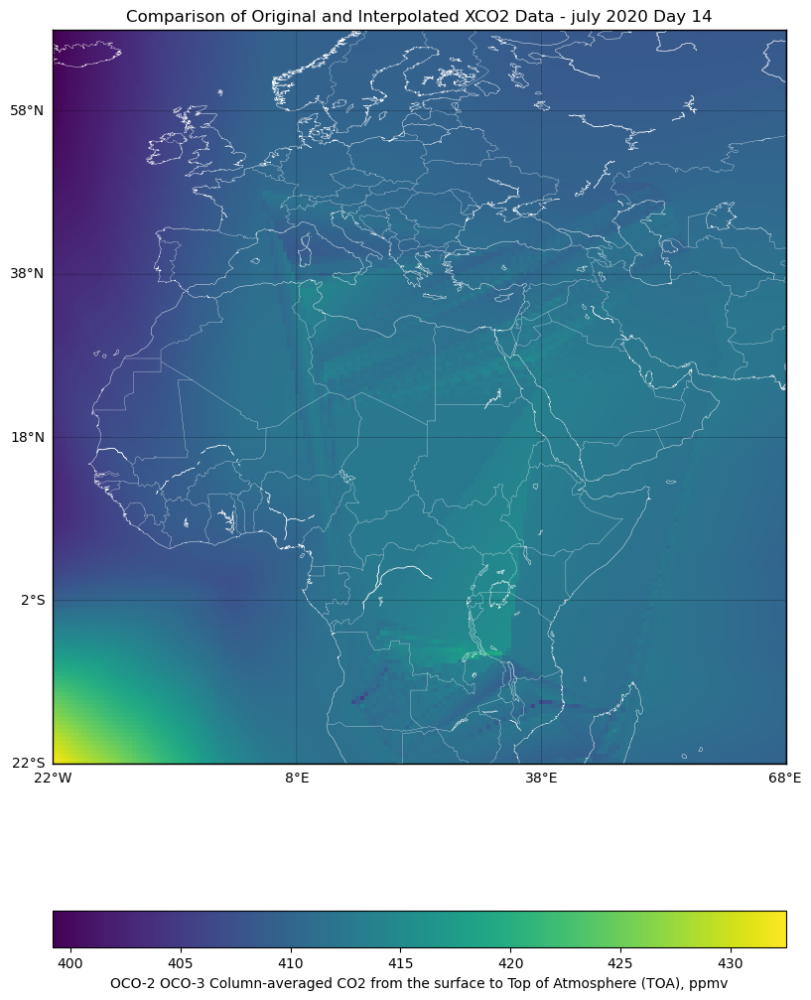

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  432.518494    13     181     181
1         -21.5      -22.0  432.023895    13     181     181
2         -21.0      -22.0  431.577820    13     181     181
3         -20.5      -22.0  431.182678    13     181     181
4         -20.0      -22.0  430.791321    13     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  408.331848    13     181     181
32757      66.5       68.0  408.340454    13     181     181
32758      67.0       68.0  408.348999    13     181     181
32759      67.5       68.0  408.357635    13     181     181
32760      68.0       68.0  408.366760    13     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[ 26

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


208/208 - 1s - 6ms/step - loss: 0.0422 - val_loss: 0.2424
Epoch 2/20
208/208 - 0s - 2ms/step - loss: 0.0075 - val_loss: 0.2760
Epoch 3/20
208/208 - 0s - 2ms/step - loss: 0.0068 - val_loss: 0.3088
Epoch 4/20
208/208 - 0s - 2ms/step - loss: 0.0061 - val_loss: 0.2982
Epoch 5/20
208/208 - 0s - 2ms/step - loss: 0.0059 - val_loss: 0.2425
Epoch 5: early stopping
609/609 ━━━━━━━━━━━━━━━━━━━━ 1s 751us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[408.27255249 408.33737183 408.40356445 ... 408.50314331 408.52044678
  408.53781128]
 [408.15032959 408.21417236 408.27905273 ... 408.60275269 408.61871338
  408.63476562]
 [408.03277588 408.09564209 408.1595459  ... 408.69628906 408.7109375
  408.72561646]
 ...
 [413.365448   413.00183105 412.64321899 ... 406.27508545 406.2845459
  406.29470825]
 [413.18487549 412.8215332  412.46331787 ... 406.21264648 406.22167969
  406.23135376]
 [413.00289917 412.64001465 412.28219604 ... 406.15093994 406.15948486
  4

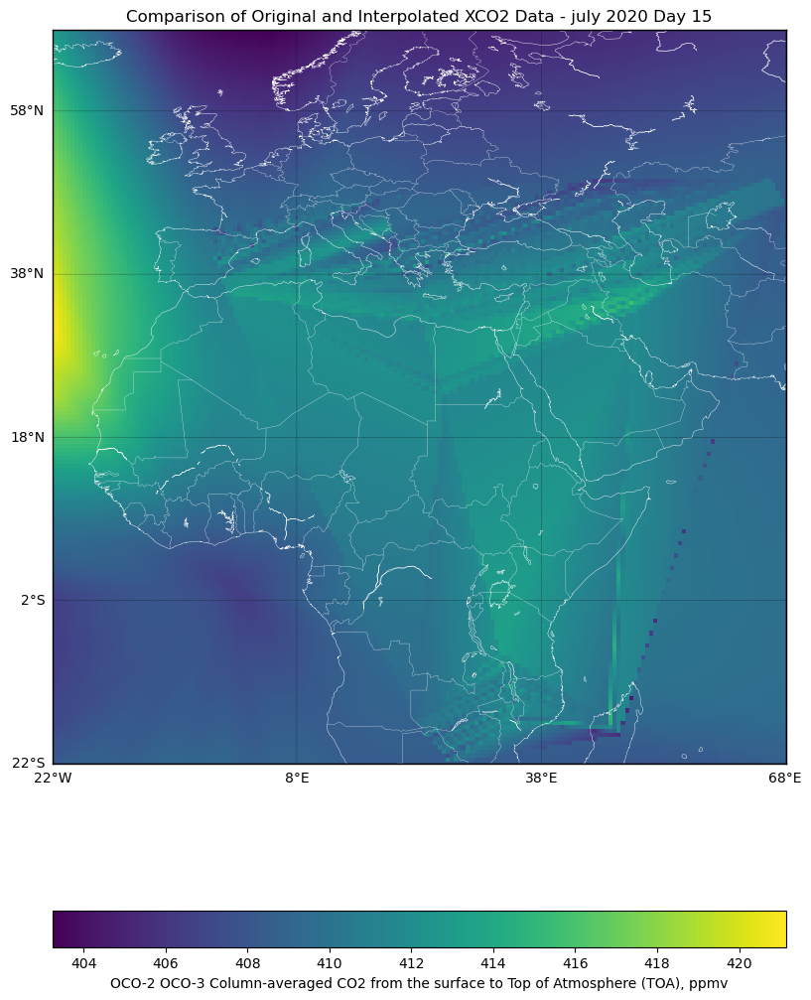

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  408.272552    14     181     181
1         -21.5      -22.0  408.337372    14     181     181
2         -21.0      -22.0  408.403564    14     181     181
3         -20.5      -22.0  408.477051    14     181     181
4         -20.0      -22.0  408.550507    14     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  406.135925    14     181     181
32757      66.5       68.0  406.143066    14     181     181
32758      67.0       68.0  406.150940    14     181     181
32759      67.5       68.0  406.159485    14     181     181
32760      68.0       68.0  406.168732    14     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[ 24

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


287/287 - 1s - 3ms/step - loss: 0.0919 - val_loss: 0.3431
Epoch 2/20
287/287 - 0s - 2ms/step - loss: 0.0105 - val_loss: 0.3794
Epoch 3/20
287/287 - 0s - 1ms/step - loss: 0.0093 - val_loss: 0.3929
Epoch 4/20
287/287 - 0s - 1ms/step - loss: 0.0088 - val_loss: 0.4095
Epoch 5/20
287/287 - 0s - 1ms/step - loss: 0.0085 - val_loss: 0.3935
Epoch 5: early stopping
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[412.90039062 412.9692688  413.04071045 ... 411.8324585  411.84994507
  411.86767578]
 [412.86746216 412.89215088 412.96044922 ... 411.8656311  411.88278198
  411.90020752]
 [412.88104248 412.85940552 412.88284302 ... 411.89749146 411.91479492
  411.93243408]
 ...
 [410.3371582  410.19598389 410.07437134 ... 409.41995239 409.42559814
  409.43139648]
 [410.27288818 410.13235474 410.04696655 ... 409.40222168 409.40716553
  409.41268921]
 [410.20928955 410.0692749  410.02020264 ... 409.38607788 409.3899231
  

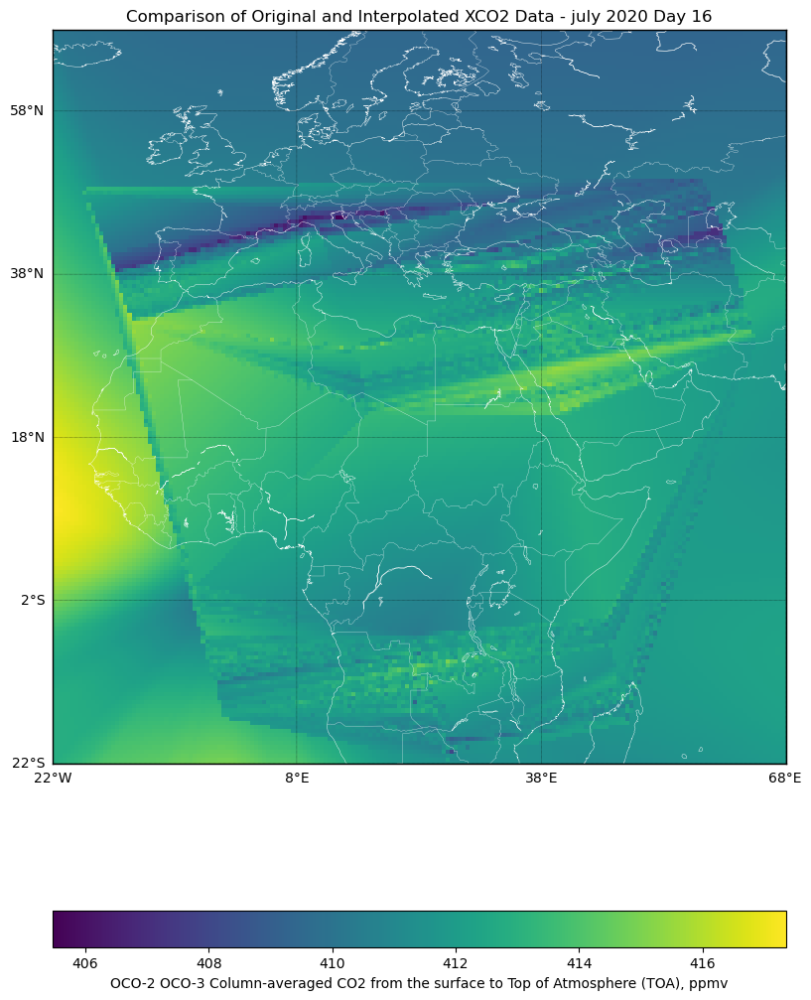

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  412.900391    15     181     181
1         -21.5      -22.0  412.969269    15     181     181
2         -21.0      -22.0  413.040710    15     181     181
3         -20.5      -22.0  413.110474    15     181     181
4         -20.0      -22.0  413.178436    15     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  409.378571    15     181     181
32757      66.5       68.0  409.382294    15     181     181
32758      67.0       68.0  409.386078    15     181     181
32759      67.5       68.0  409.389923    15     181     181
32760      68.0       68.0  409.394745    15     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[-10

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


294/294 - 1s - 3ms/step - loss: 0.0894 - val_loss: 0.4781
Epoch 2/20
294/294 - 0s - 1ms/step - loss: 0.0077 - val_loss: 0.4091
Epoch 3/20
294/294 - 0s - 1ms/step - loss: 0.0061 - val_loss: 0.3815
Epoch 4/20
294/294 - 0s - 1ms/step - loss: 0.0055 - val_loss: 0.3395
Epoch 5/20
294/294 - 0s - 1ms/step - loss: 0.0051 - val_loss: 0.3462
Epoch 5: early stopping
438/438 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[411.85668945 411.79153442 411.72305298 ... 410.54580688 410.54977417
  410.55340576]
 [412.03213501 411.96768188 411.90176392 ... 410.62017822 410.62332153
  410.62609863]
 [412.07977295 412.13778687 412.0748291  ... 410.69546509 410.69775391
  410.69973755]
 ...
 [410.45605469 410.41647339 410.37591553 ... 410.8453064  410.93963623
  411.03295898]
 [410.4303894  410.39019775 410.34915161 ... 410.74777222 410.84384155
  410.93908691]
 [410.40472412 410.36392212 410.32241821 ... 410.64834595 410.74539185
 

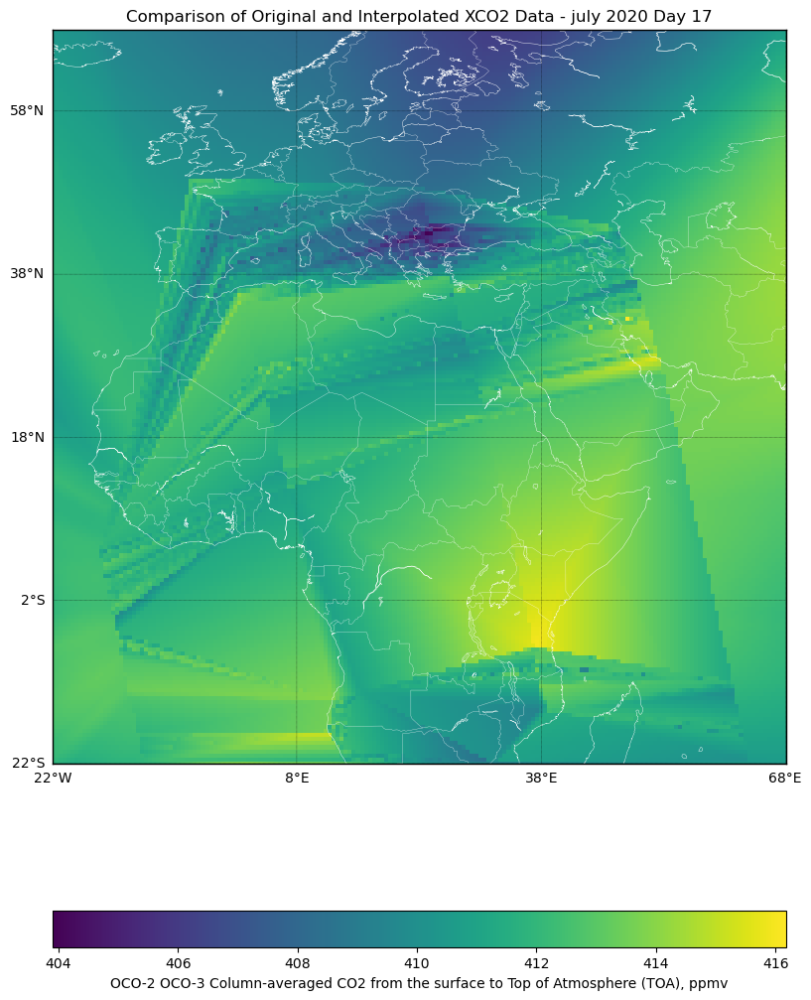

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  411.856689    16     181     181
1         -21.5      -22.0  411.791534    16     181     181
2         -21.0      -22.0  411.723053    16     181     181
3         -20.5      -22.0  411.652466    16     181     181
4         -20.0      -22.0  411.580566    16     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  410.455261    16     181     181
32757      66.5       68.0  410.551849    16     181     181
32758      67.0       68.0  410.648346    16     181     181
32759      67.5       68.0  410.745392    16     181     181
32760      68.0       68.0  410.842346    16     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[-21

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


301/301 - 1s - 3ms/step - loss: 0.0618 - val_loss: 0.4980
Epoch 2/20
301/301 - 0s - 1ms/step - loss: 0.0097 - val_loss: 0.3752
Epoch 3/20
301/301 - 0s - 1ms/step - loss: 0.0079 - val_loss: 0.3905
Epoch 4/20
301/301 - 0s - 1ms/step - loss: 0.0061 - val_loss: 0.2787
Epoch 5/20
301/301 - 0s - 1ms/step - loss: 0.0054 - val_loss: 0.2427
Epoch 6/20
301/301 - 0s - 1ms/step - loss: 0.0051 - val_loss: 0.2469
Epoch 6: early stopping
424/424 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[412.60073853 412.53057861 412.51403809 ... 411.90881348 411.91308594
  411.91741943]
 [412.68206787 411.39399989 411.64407228 ... 411.89190674 411.89782715
  411.90377808]
 [412.7557373  411.67668167 411.71480744 ... 411.87985229 411.88555908
  411.89129639]
 ...
 [409.2088623  409.15060425 409.02355957 ... 407.07095337 407.13446045
  407.19726562]
 [409.09875488 409.02886963 408.88598633 ... 406.9553833  407.02062988
  407.08517456]
 [4

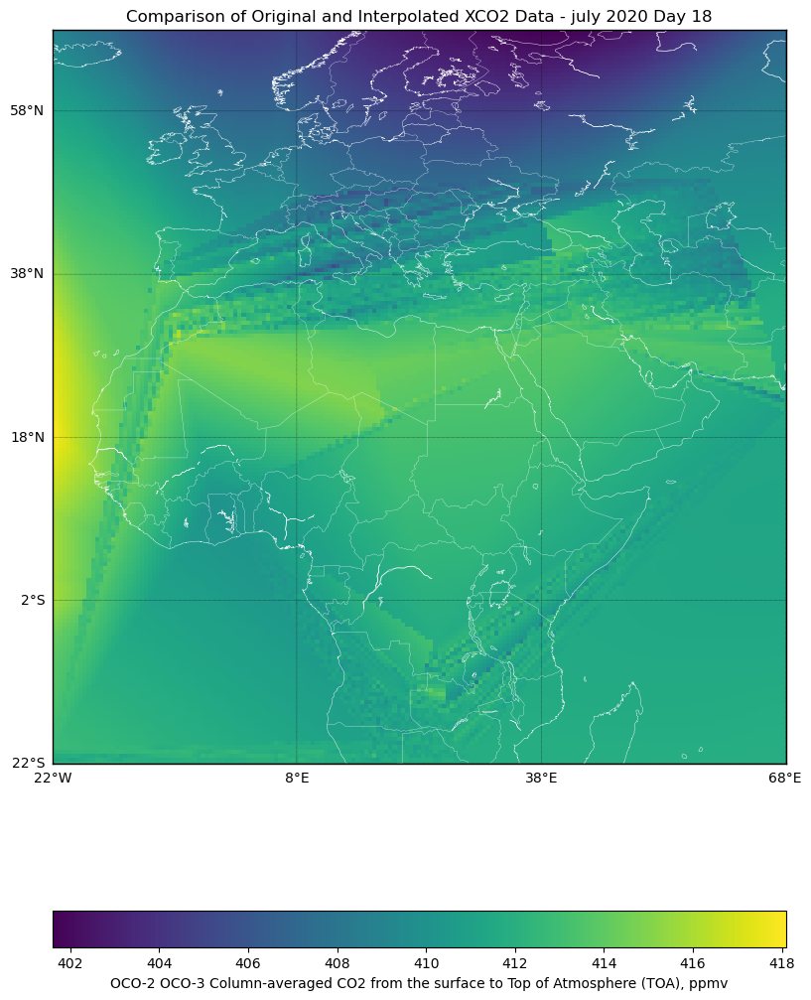

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  412.600739    17     181     181
1         -21.5      -22.0  412.530579    17     181     181
2         -21.0      -22.0  412.514038    17     181     181
3         -20.5      -22.0  412.495880    17     181     181
4         -20.0      -22.0  412.476746    17     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  406.499359    17     181     181
32757      66.5       68.0  406.639404    17     181     181
32758      67.0       68.0  406.783691    17     181     181
32759      67.5       68.0  406.905060    17     181     181
32760      68.0       68.0  406.971313    17     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[ -7

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


297/297 - 1s - 3ms/step - loss: 0.1690 - val_loss: 0.3699
Epoch 2/20
297/297 - 0s - 1ms/step - loss: 0.0074 - val_loss: 0.3482
Epoch 3/20
297/297 - 0s - 1ms/step - loss: 0.0054 - val_loss: 0.3450
Epoch 4/20
297/297 - 0s - 1ms/step - loss: 0.0045 - val_loss: 0.3533
Epoch 5/20
297/297 - 0s - 1ms/step - loss: 0.0040 - val_loss: 0.3394
Epoch 6/20
297/297 - 0s - 1ms/step - loss: 0.0037 - val_loss: 0.3425
Epoch 6: early stopping
431/431 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[414.09857178 413.92681885 413.75616455 ... 410.29782104 410.28408813
  410.27056885]
 [414.18521118 414.01754761 413.84793091 ... 410.29660034 410.28283691
  410.26928711]
 [414.22399902 414.10437012 413.93951416 ... 410.29608154 410.28234863
  410.26904297]
 ...
 [410.77923584 410.70129395 410.62280273 ... 405.16784668 405.24221802
  405.31838989]
 [410.74942017 410.6711731  410.59246826 ... 405.01483154 405.08837891
  405.16369629]
 [4

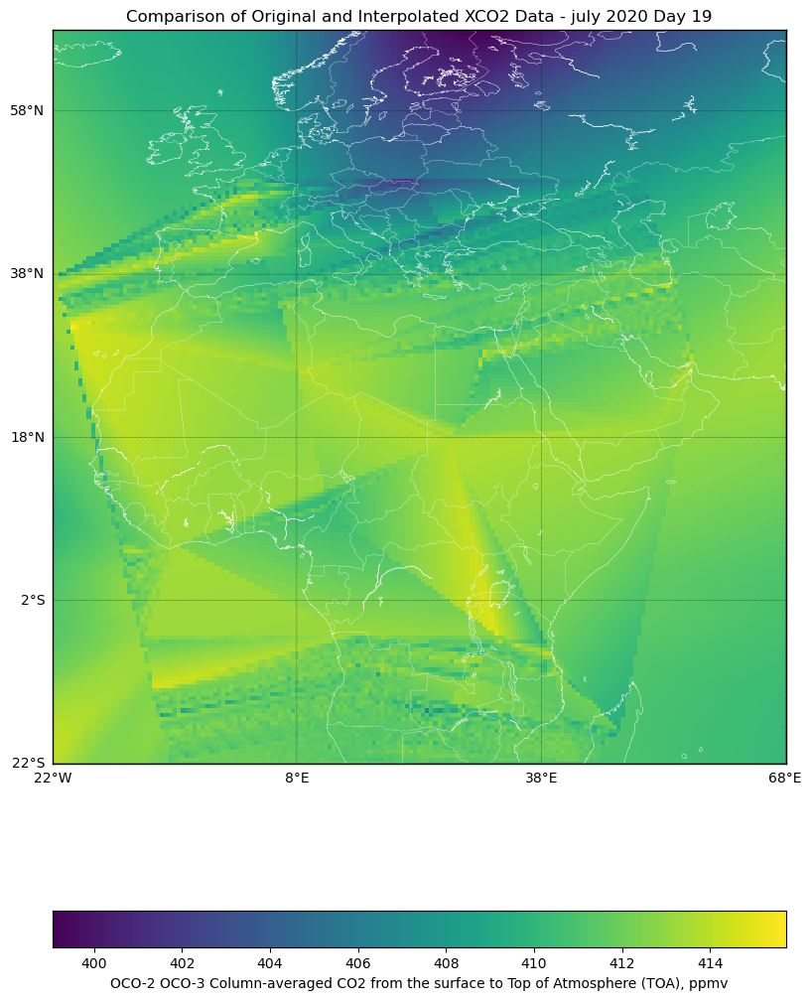

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  414.098572    18     181     181
1         -21.5      -22.0  413.926819    18     181     181
2         -21.0      -22.0  413.756165    18     181     181
3         -20.5      -22.0  413.595032    18     181     181
4         -20.0      -22.0  413.450043    18     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  404.722198    18     181     181
32757      66.5       68.0  404.791168    18     181     181
32758      67.0       68.0  404.862000    18     181     181
32759      67.5       68.0  404.934692    18     181     181
32760      68.0       68.0  405.009186    18     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[-18

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


358/358 - 1s - 3ms/step - loss: 0.0737 - val_loss: 0.1887
Epoch 2/20
358/358 - 0s - 1ms/step - loss: 0.0094 - val_loss: 0.1623
Epoch 3/20
358/358 - 0s - 1ms/step - loss: 0.0081 - val_loss: 0.1538
Epoch 4/20
358/358 - 0s - 1ms/step - loss: 0.0075 - val_loss: 0.1414
Epoch 5/20
358/358 - 0s - 1ms/step - loss: 0.0072 - val_loss: 0.1464
Epoch 5: early stopping
309/309 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[408.92953491 409.00018311 409.07467651 ... 410.01364136 409.98995972
  409.96627808]
 [409.10641479 409.17297363 409.24502563 ... 410.02667236 410.00283813
  409.97903442]
 [409.27355957 409.34475708 409.41238403 ... 410.04049683 410.01654053
  409.99258423]
 ...
 [402.74191284 402.84576416 402.9524231  ... 406.92498779 406.98904419
  407.05355835]
 [402.63961792 402.74319458 402.84963989 ... 406.79171753 406.85513306
  406.91906738]
 [402.53723145 402.64056396 402.74673462 ... 406.65930176 406.72207642
 

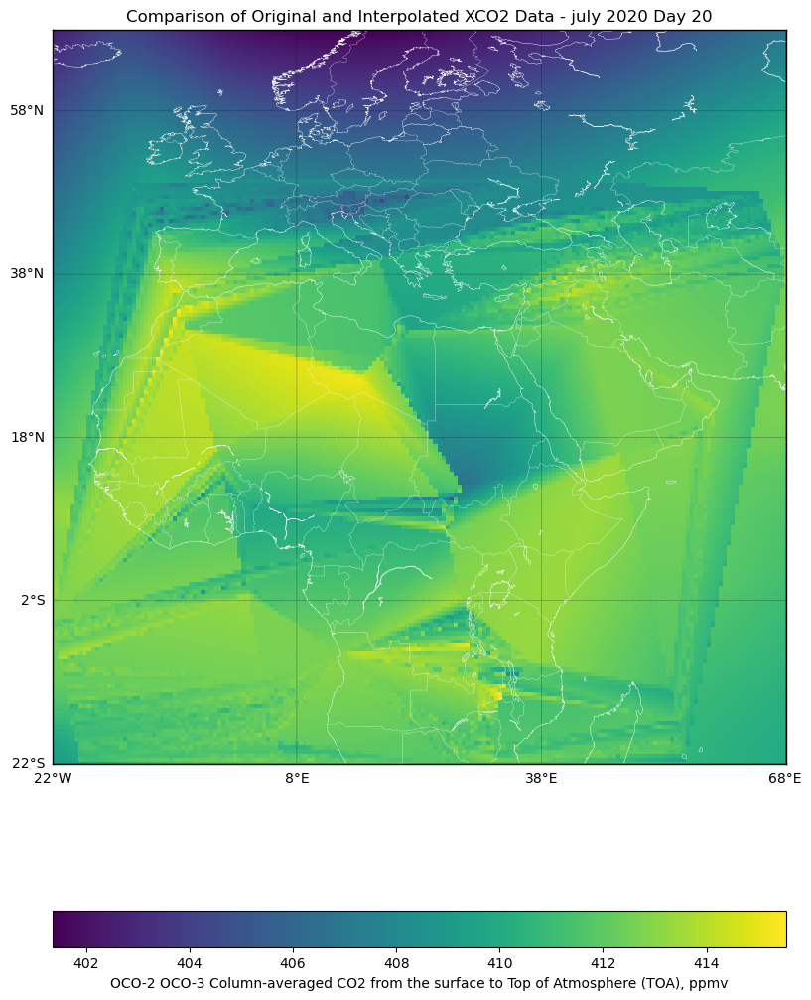

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  408.929535    19     181     181
1         -21.5      -22.0  409.000183    19     181     181
2         -21.0      -22.0  409.074677    19     181     181
3         -20.5      -22.0  409.159882    19     181     181
4         -20.0      -22.0  409.255524    19     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  406.535583    19     181     181
32757      66.5       68.0  406.597107    19     181     181
32758      67.0       68.0  406.659302    19     181     181
32759      67.5       68.0  406.722076    19     181     181
32760      68.0       68.0  406.785370    19     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[ 19

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


259/259 - 1s - 4ms/step - loss: 0.1180 - val_loss: 0.3546
Epoch 2/20
259/259 - 0s - 2ms/step - loss: 0.0046 - val_loss: 0.3028
Epoch 3/20
259/259 - 0s - 2ms/step - loss: 0.0038 - val_loss: 0.3069
Epoch 4/20
259/259 - 0s - 2ms/step - loss: 0.0035 - val_loss: 0.3019
Epoch 5/20
259/259 - 0s - 2ms/step - loss: 0.0034 - val_loss: 0.3103
Epoch 5: early stopping
508/508 ━━━━━━━━━━━━━━━━━━━━ 1s 769us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[415.36904907 415.25799561 415.1385498  ... 412.30926514 412.31253052
  412.31607056]
 [415.24291992 415.1390686  415.02581787 ... 412.28213501 412.28527832
  412.28872681]
 [415.02587891 415.01629639 414.90887451 ... 412.25485229 412.25790405
  412.2612915 ]
 ...
 [414.09716797 413.84552002 413.59799194 ... 406.55981445 406.63757324
  406.71569824]
 [414.03594971 413.78421021 413.53674316 ... 406.41775513 406.50311279
  406.58126831]
 [413.97442627 413.72265625 413.47518921 ... 406.22711182 406.36148071
 

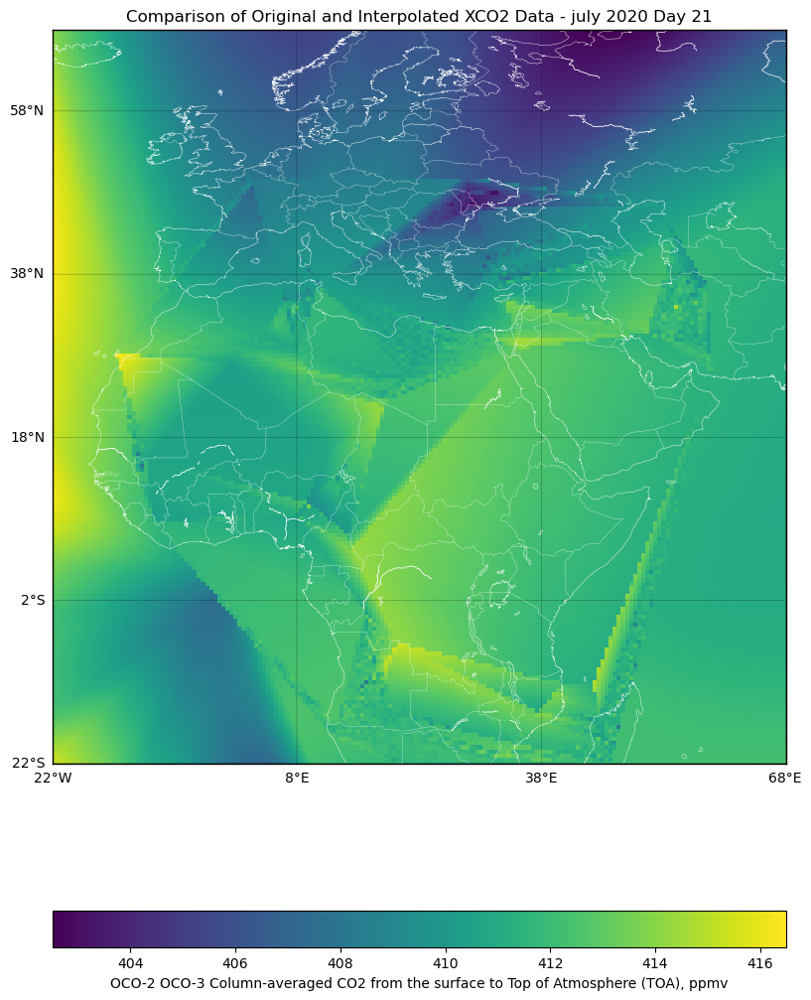

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  415.369049    20     181     181
1         -21.5      -22.0  415.257996    20     181     181
2         -21.0      -22.0  415.138550    20     181     181
3         -20.5      -22.0  415.011383    20     181     181
4         -20.0      -22.0  414.876312    20     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  405.958679    20     181     181
32757      66.5       68.0  406.092865    20     181     181
32758      67.0       68.0  406.227112    20     181     181
32759      67.5       68.0  406.361481    20     181     181
32760      68.0       68.0  406.446869    20     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[-15

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


293/293 - 1s - 3ms/step - loss: 0.0624 - val_loss: 0.4845
Epoch 2/20
293/293 - 0s - 2ms/step - loss: 0.0134 - val_loss: 0.4773
Epoch 3/20
293/293 - 0s - 1ms/step - loss: 0.0104 - val_loss: 0.4344
Epoch 4/20
293/293 - 0s - 1ms/step - loss: 0.0093 - val_loss: 0.4206
Epoch 5/20
293/293 - 0s - 1ms/step - loss: 0.0088 - val_loss: 0.4171
Epoch 6/20
293/293 - 0s - 1ms/step - loss: 0.0085 - val_loss: 0.4368
Epoch 6: early stopping
440/440 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[413.15014648 412.99749756 412.83813477 ... 411.38879395 411.39593506
  411.40319824]
 [413.28253174 413.13522339 412.98321533 ... 411.40744019 411.41436768
  411.42147827]
 [413.40460205 413.26419067 413.11752319 ... 411.42614746 411.43276978
  411.43954468]
 ...
 [412.97348022 413.00286865 413.02838135 ... 409.72427368 409.74212646
  409.76010132]
 [413.00216675 413.03088379 413.05563354 ... 409.70318604 409.7208252
  409.73855591]
 [41

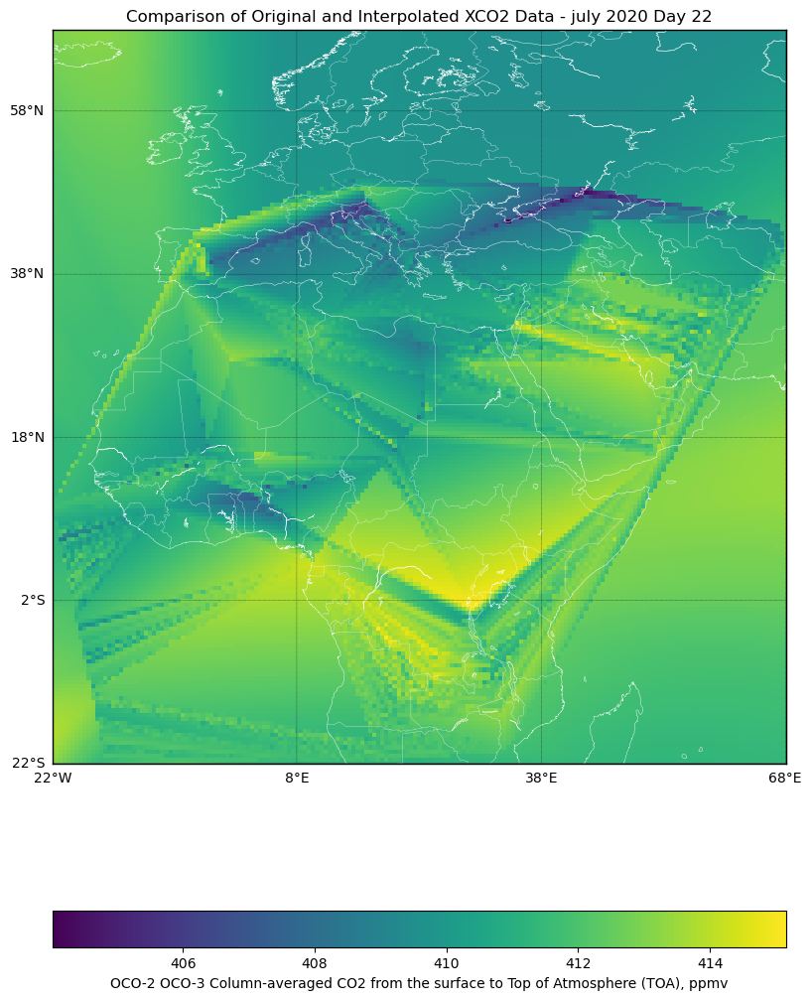

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  413.150146    21     181     181
1         -21.5      -22.0  412.997498    21     181     181
2         -21.0      -22.0  412.838135    21     181     181
3         -20.5      -22.0  412.672089    21     181     181
4         -20.0      -22.0  412.499237    21     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  409.649536    21     181     181
32757      66.5       68.0  409.665802    21     181     181
32758      67.0       68.0  409.682587    21     181     181
32759      67.5       68.0  409.700012    21     181     181
32760      68.0       68.0  409.717468    21     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[ -1

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


299/299 - 1s - 3ms/step - loss: 0.0216 - val_loss: 0.2967
Epoch 2/20
299/299 - 0s - 1ms/step - loss: 0.0106 - val_loss: 0.3588
Epoch 3/20
299/299 - 0s - 1ms/step - loss: 0.0089 - val_loss: 0.3855
Epoch 4/20
299/299 - 0s - 1ms/step - loss: 0.0081 - val_loss: 0.3870
Epoch 5/20
299/299 - 0s - 1ms/step - loss: 0.0075 - val_loss: 0.3381
Epoch 5: early stopping
428/428 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[424.06652832 423.82711792 423.58517456 ... 411.80834961 411.82833862
  411.84884644]
 [424.01580811 423.77520752 423.53765869 ... 411.84457397 411.86526489
  411.88644409]
 [423.9548645  423.71896362 423.48040771 ... 411.8807373  411.90209961
  411.90814209]
 ...
 [405.27062988 405.33633423 405.39996338 ... 403.9180603  403.95114136
  403.98214722]
 [405.22189331 405.28775024 405.34988403 ... 403.80535889 403.83572388
  403.86865234]
 [405.17337036 405.2388916  405.29998779 ... 403.69537354 403.72344971
 

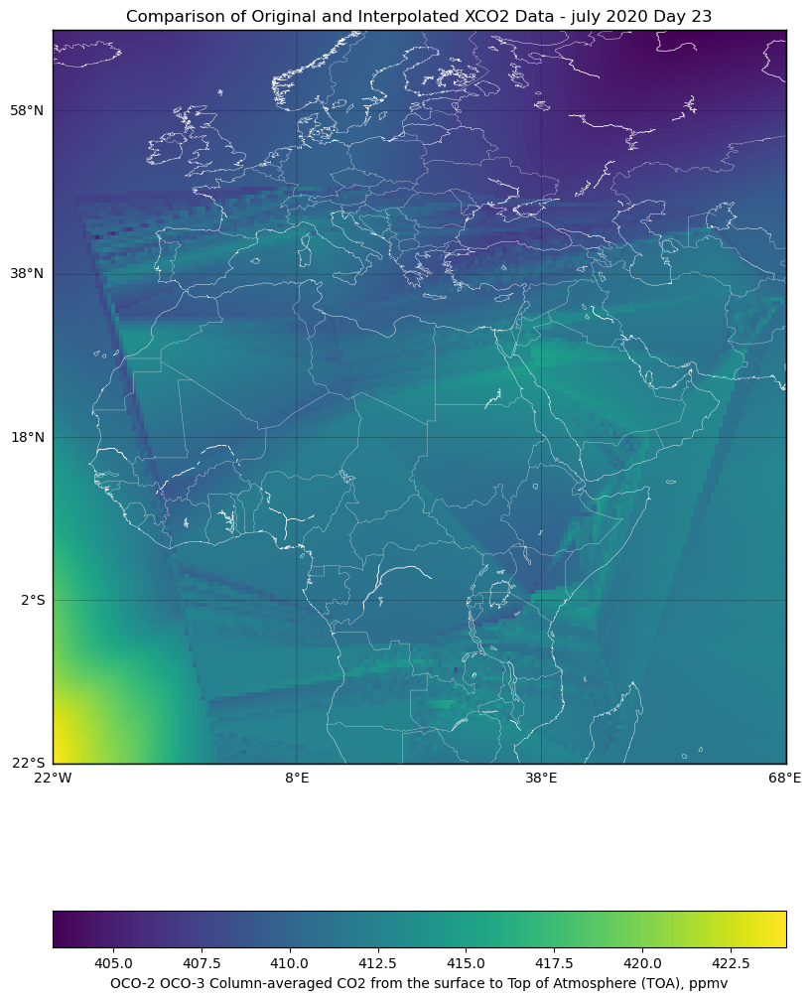

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  424.066528    22     181     181
1         -21.5      -22.0  423.827118    22     181     181
2         -21.0      -22.0  423.585175    22     181     181
3         -20.5      -22.0  423.341217    22     181     181
4         -20.0      -22.0  423.089142    22     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  403.641083    22     181     181
32757      66.5       68.0  403.667847    22     181     181
32758      67.0       68.0  403.695374    22     181     181
32759      67.5       68.0  403.723450    22     181     181
32760      68.0       68.0  403.753754    22     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[  7

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


283/283 - 1s - 4ms/step - loss: 0.0589 - val_loss: 0.3656
Epoch 2/20
283/283 - 0s - 1ms/step - loss: 0.0089 - val_loss: 0.3688
Epoch 3/20
283/283 - 0s - 1ms/step - loss: 0.0073 - val_loss: 0.3739
Epoch 4/20
283/283 - 0s - 1ms/step - loss: 0.0067 - val_loss: 0.3761
Epoch 5/20
283/283 - 0s - 1ms/step - loss: 0.0064 - val_loss: 0.3716
Epoch 5: early stopping
459/459 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[409.29577637 409.44393921 409.57614136 ... 412.34039307 412.35424805
  412.36773682]
 [409.30285645 409.4480896  409.5930481  ... 412.32489014 412.33804321
  412.3508606 ]
 [409.31420898 409.45645142 409.59851074 ... 412.30905151 412.32150269
  412.33364868]
 ...
 [408.63497925 408.65533447 408.67501831 ... 411.61791992 411.69818115
  411.77841187]
 [408.61895752 408.63931274 408.65896606 ... 411.55987549 411.64019775
  411.72058105]
 [408.60336304 408.62371826 408.64334106 ... 411.50167847 411.5821228
  

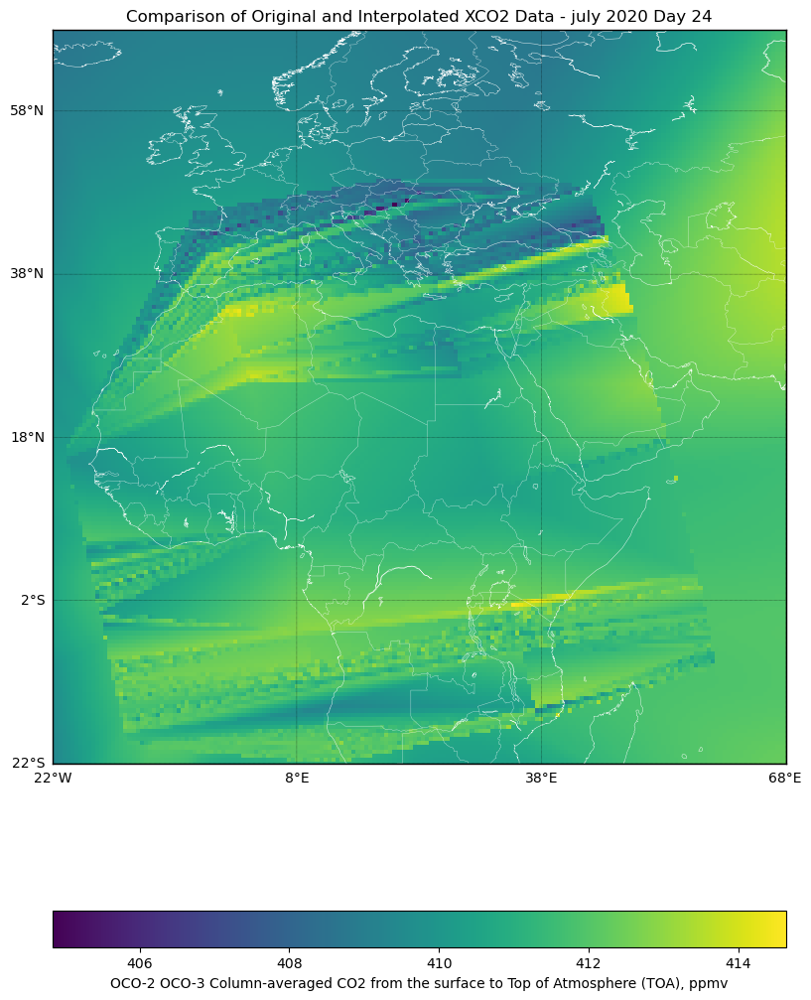

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  409.295776    23     181     181
1         -21.5      -22.0  409.443939    23     181     181
2         -21.0      -22.0  409.576141    23     181     181
3         -20.5      -22.0  409.700409    23     181     181
4         -20.0      -22.0  409.811401    23     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  411.340668    23     181     181
32757      66.5       68.0  411.421173    23     181     181
32758      67.0       68.0  411.501678    23     181     181
32759      67.5       68.0  411.582123    23     181     181
32760      68.0       68.0  411.662567    23     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[ 24

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
248/248 - 1s - 4ms/step - loss: 0.1515 - val_loss: 0.4501
Epoch 2/20
248/248 - 0s - 2ms/step - loss: 0.0080 - val_loss: 0.3677
Epoch 3/20
248/248 - 0s - 2ms/step - loss: 0.0058 - val_loss: 0.3935
Epoch 4/20
248/248 - 0s - 2ms/step - loss: 0.0047 - val_loss: 0.3912
Epoch 5/20
248/248 - 0s - 2ms/step - loss: 0.0042 - val_loss: 0.3761
Epoch 5: early stopping
530/530 ━━━━━━━━━━━━━━━━━━━━ 1s 781us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[407.91925049 408.41122437 408.89678955 ... 414.55596924 414.60876465
  414.66165161]
 [407.32479858 407.81991577 408.30895996 ... 414.60568237 414.6583252
  414.71118164]
 [406.73117065 407.2288208  407.72073364 ... 414.65039062 414.67614746
  414.70199585]
 ...
 [409.58032227 409.4977417  409.41189575 ... 400.29916382 400.32748413
  400.35614014]
 [409.52407837 409.44036865 409.35324097 ... 400.12963867 400.15713501
  400.18502808]
 [409.46786499 409.38290405 409.29455566 ... 399.96166992 399.

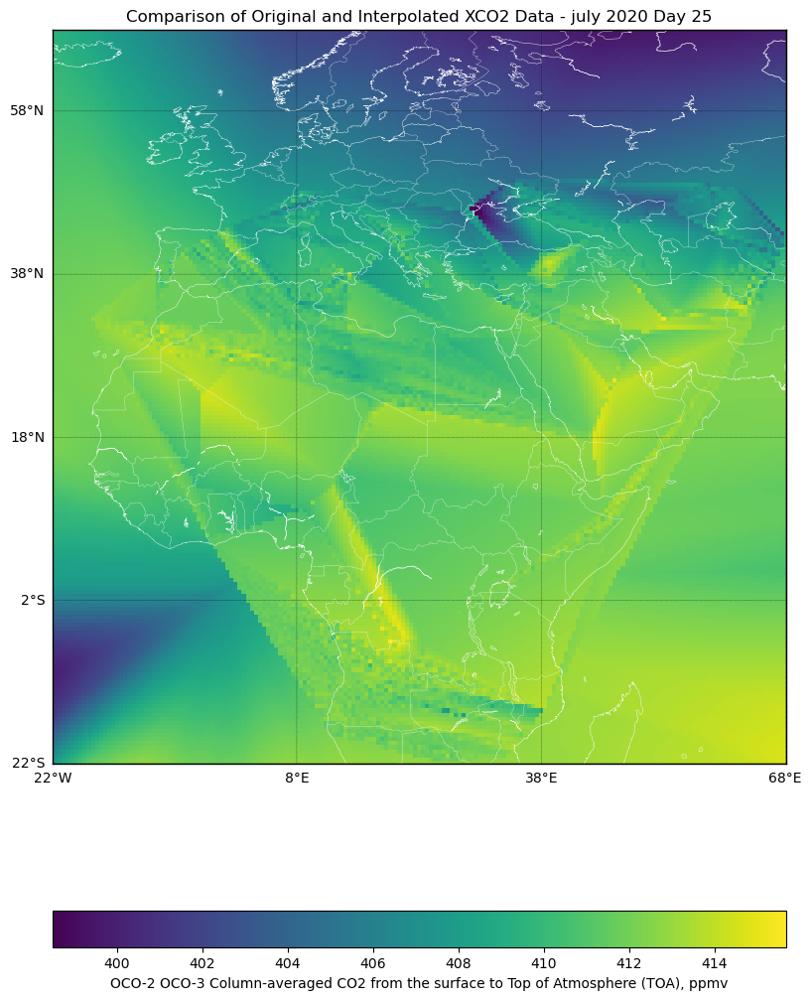

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  407.919250    24     181     181
1         -21.5      -22.0  408.411224    24     181     181
2         -21.0      -22.0  408.896790    24     181     181
3         -20.5      -22.0  409.297028    24     181     181
4         -20.0      -22.0  409.679199    24     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  399.909119    24     181     181
32757      66.5       68.0  399.935242    24     181     181
32758      67.0       68.0  399.961670    24     181     181
32759      67.5       68.0  399.988434    24     181     181
32760      68.0       68.0  400.015472    24     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[ -3

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


308/308 - 1s - 3ms/step - loss: 0.0291 - val_loss: 0.3809
Epoch 2/20
308/308 - 0s - 1ms/step - loss: 0.0103 - val_loss: 0.2955
Epoch 3/20
308/308 - 0s - 1ms/step - loss: 0.0083 - val_loss: 0.3031
Epoch 4/20
308/308 - 0s - 1ms/step - loss: 0.0075 - val_loss: 0.3113
Epoch 5/20
308/308 - 0s - 1ms/step - loss: 0.0070 - val_loss: 0.3165
Epoch 5: early stopping
410/410 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[410.86578369 410.69903564 410.52978516 ... 412.36428833 412.39694214
  412.42974854]
 [411.18963623 411.02941895 410.86639404 ... 412.39379883 412.42593384
  412.45822144]
 [411.49688721 411.34353638 411.18707275 ... 412.42172241 412.45333862
  412.48513794]
 ...
 [403.80307007 404.05496216 404.30722046 ... 407.97402954 407.98394775
  407.99380493]
 [403.72595215 403.97961426 404.23364258 ... 407.9486084  407.95831299
  407.96801758]
 [403.64929199 403.90475464 404.16049194 ... 407.92401123 407.93353271
 

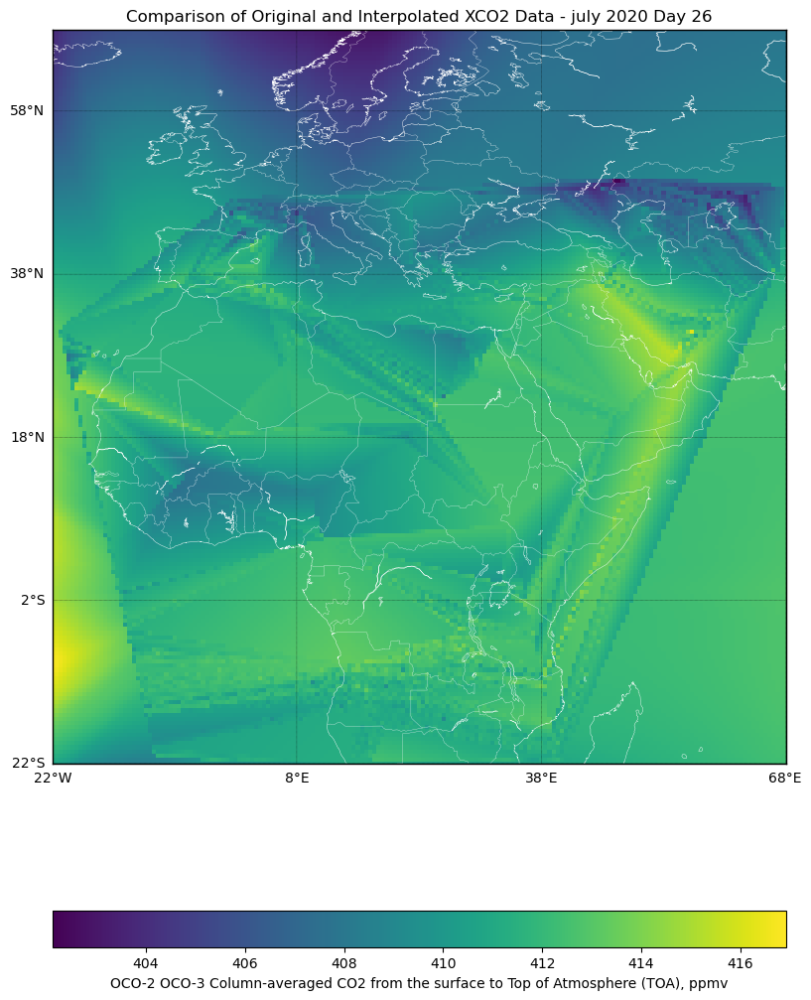

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  410.865784    25     181     181
1         -21.5      -22.0  410.699036    25     181     181
2         -21.0      -22.0  410.529785    25     181     181
3         -20.5      -22.0  410.358276    25     181     181
4         -20.0      -22.0  410.105804    25     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  407.904938    25     181     181
32757      66.5       68.0  407.914490    25     181     181
32758      67.0       68.0  407.924011    25     181     181
32759      67.5       68.0  407.933533    25     181     181
32760      68.0       68.0  407.942993    25     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[-20

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


361/361 - 1s - 3ms/step - loss: 0.0310 - val_loss: 0.3087
Epoch 2/20
361/361 - 0s - 1ms/step - loss: 0.0075 - val_loss: 0.2928
Epoch 3/20
361/361 - 0s - 1ms/step - loss: 0.0052 - val_loss: 0.2752
Epoch 4/20
361/361 - 0s - 1ms/step - loss: 0.0042 - val_loss: 0.2964
Epoch 5/20
361/361 - 0s - 1ms/step - loss: 0.0037 - val_loss: 0.3108
Epoch 5: early stopping
303/303 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[411.58035278 411.63534546 411.65322876 ... 410.65966797 410.62683105
  410.59359741]
 [411.59594727 411.65481567 411.71008301 ... 410.66168213 410.62796021
  410.59393311]
 [411.60458374 411.66720581 411.72616577 ... 410.66079712 410.6262207
  410.59130859]
 ...
 [409.07064819 409.00765991 408.94586182 ... 398.22085571 398.24157715
  398.26473999]
 [409.01980591 408.95666504 408.89483643 ... 397.96069336 397.97775269
  397.99719238]
 [408.96911621 408.90594482 408.84396362 ... 397.70501709 397.71847534
  

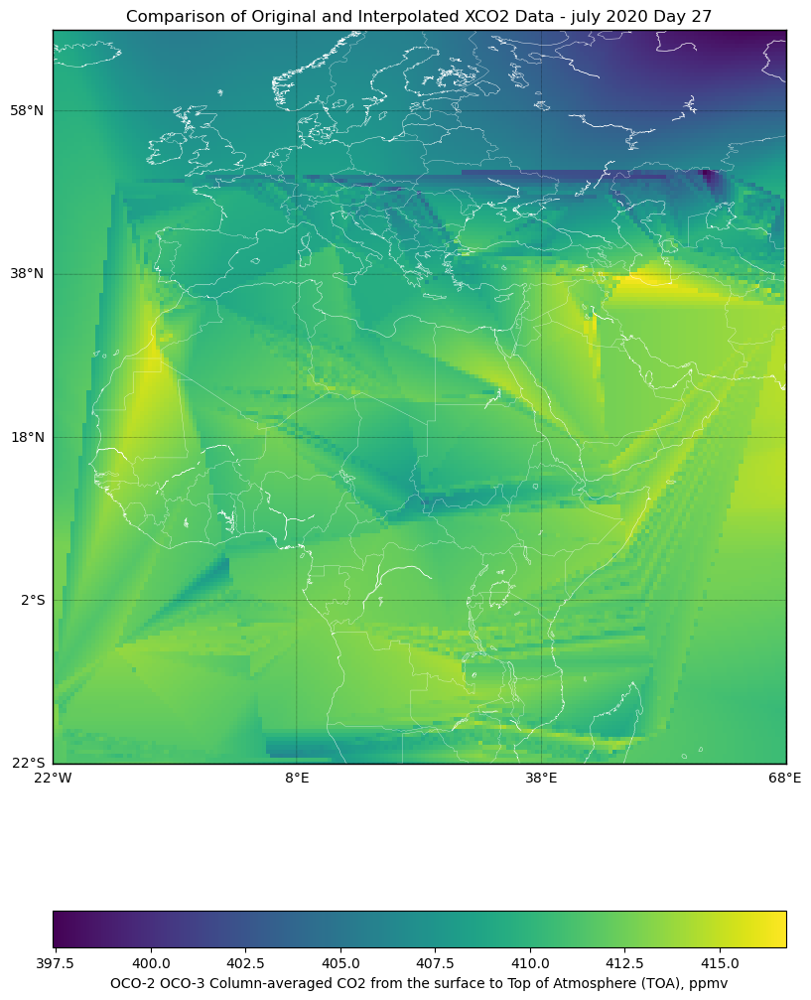

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  411.580353    26     181     181
1         -21.5      -22.0  411.635345    26     181     181
2         -21.0      -22.0  411.653229    26     181     181
3         -20.5      -22.0  411.617584    26     181     181
4         -20.0      -22.0  411.566254    26     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  397.684906    26     181     181
32757      66.5       68.0  397.693848    26     181     181
32758      67.0       68.0  397.705017    26     181     181
32759      67.5       68.0  397.718475    26     181     181
32760      68.0       68.0  397.734283    26     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[-21

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


387/387 - 1s - 3ms/step - loss: 0.0215 - val_loss: 0.1677
Epoch 2/20
387/387 - 0s - 1ms/step - loss: 0.0063 - val_loss: 0.1500
Epoch 3/20
387/387 - 0s - 1ms/step - loss: 0.0055 - val_loss: 0.1242
Epoch 4/20
387/387 - 0s - 1ms/step - loss: 0.0050 - val_loss: 0.1307
Epoch 5/20
387/387 - 0s - 1ms/step - loss: 0.0047 - val_loss: 0.1441
Epoch 5: early stopping
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[410.82891846 410.83868408 410.88739014 ... 411.71347046 411.71090698
  411.70922852]
 [410.81811523 410.87023926 411.07617082 ... 411.0069126  411.65517206
  411.74029541]
 [410.80752563 410.85766602 411.08347108 ... 411.71429211 411.82865555
  411.73184204]
 ...
 [407.41741943 407.13818359 406.86248779 ... 398.08370972 398.11309814
  398.14303589]
 [407.21551514 406.93539429 406.65884399 ... 397.84542847 397.88839722
  397.91778564]
 [407.01184082 406.73083496 406.45349121 ... 397.60321045 397.65103149
  3

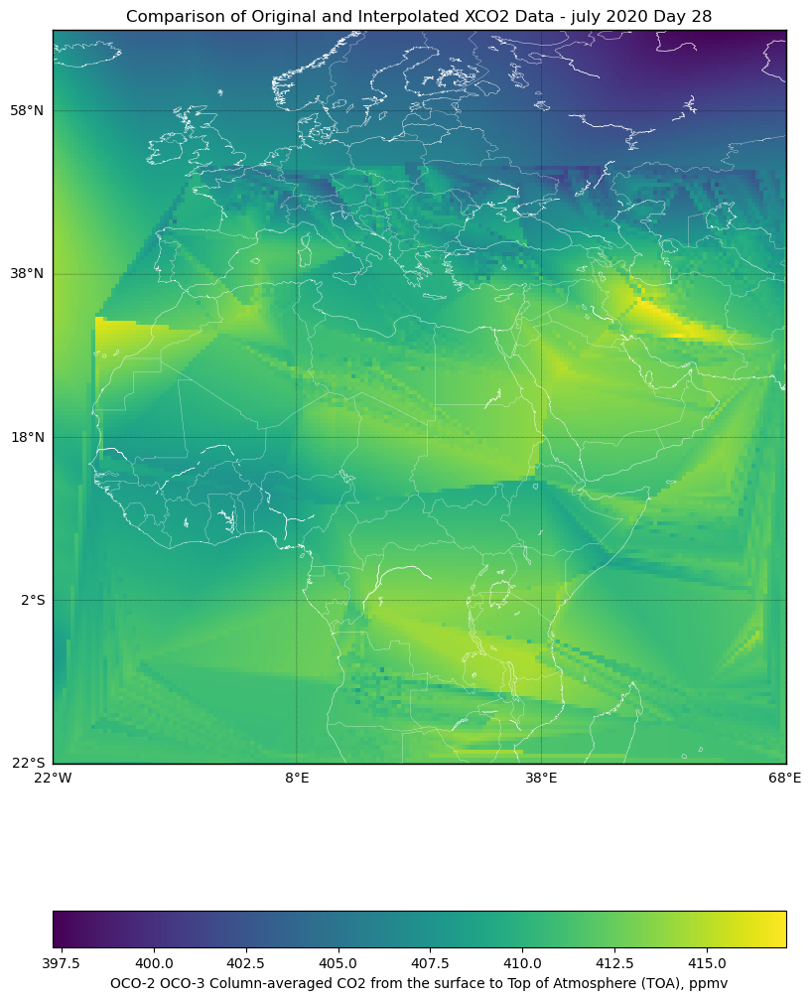

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  410.828918    27     181     181
1         -21.5      -22.0  410.838684    27     181     181
2         -21.0      -22.0  410.887390    27     181     181
3         -20.5      -22.0  410.851257    27     181     181
4         -20.0      -22.0  410.719849    27     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  397.511688    27     181     181
32757      66.5       68.0  397.556702    27     181     181
32758      67.0       68.0  397.603210    27     181     181
32759      67.5       68.0  397.651031    27     181     181
32760      68.0       68.0  397.693756    27     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[-16

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


370/370 - 1s - 3ms/step - loss: 0.1228 - val_loss: 0.5143
Epoch 2/20
370/370 - 0s - 1ms/step - loss: 0.0103 - val_loss: 0.4302
Epoch 3/20
370/370 - 0s - 1ms/step - loss: 0.0080 - val_loss: 0.3971
Epoch 4/20
370/370 - 0s - 1ms/step - loss: 0.0072 - val_loss: 0.3970
Epoch 5/20
370/370 - 0s - 1ms/step - loss: 0.0068 - val_loss: 0.3908
Epoch 6/20
370/370 - 0s - 1ms/step - loss: 0.0066 - val_loss: 0.3840
Epoch 7/20
370/370 - 0s - 1ms/step - loss: 0.0064 - val_loss: 0.3739
Epoch 8/20
370/370 - 0s - 1ms/step - loss: 0.0063 - val_loss: 0.3555
Epoch 9/20
370/370 - 0s - 1ms/step - loss: 0.0057 - val_loss: 0.3135
Epoch 10/20
370/370 - 0s - 1ms/step - loss: 0.0049 - val_loss: 0.3011
Epoch 11/20
370/370 - 0s - 1ms/step - loss: 0.0044 - val_loss: 0.3590
Epoch 11: early stopping
286/286 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[408.74832153 408.86645508 408.98382568 ... 410.72772217 410.72473145
  410.72174072]
 [408.87

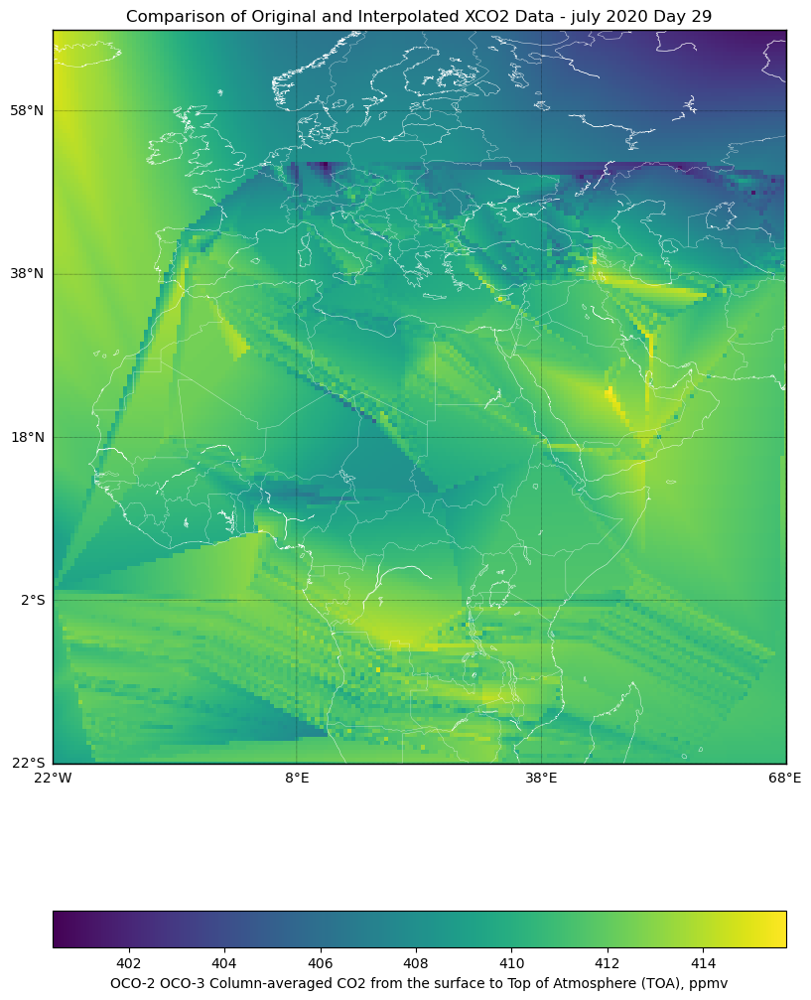

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  408.748322    28     181     181
1         -21.5      -22.0  408.866455    28     181     181
2         -21.0      -22.0  408.983826    28     181     181
3         -20.5      -22.0  409.077881    28     181     181
4         -20.0      -22.0  409.102478    28     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  401.182373    28     181     181
32757      66.5       68.0  401.177521    28     181     181
32758      67.0       68.0  401.174255    28     181     181
32759      67.5       68.0  401.172577    28     181     181
32760      68.0       68.0  401.172394    28     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[ -9

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


403/403 - 1s - 3ms/step - loss: 0.0547 - val_loss: 0.4881
Epoch 2/20
403/403 - 0s - 1ms/step - loss: 0.0062 - val_loss: 0.4917
Epoch 3/20
403/403 - 0s - 1ms/step - loss: 0.0043 - val_loss: 0.4920
Epoch 4/20
403/403 - 0s - 1ms/step - loss: 0.0035 - val_loss: 0.4809
Epoch 5/20
403/403 - 0s - 1ms/step - loss: 0.0030 - val_loss: 0.4806
Epoch 5: early stopping
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[409.07806396 409.25985718 409.44711304 ... 411.12158203 411.13729858
  411.15301514]
 [409.12701416 409.30383301 409.48605347 ... 411.17687988 411.190979
  411.20516968]
 [409.18093872 409.3526001  409.52960205 ... 411.22537231 411.23794556
  411.2505188 ]
 ...
 [403.79611206 403.76702881 403.7487793  ... 405.12561035 405.13589478
  405.14706421]
 [403.69873047 403.66995239 403.65737915 ... 405.06893921 405.07821655
  405.08828735]
 [403.60162354 403.57312012 403.56622314 ... 405.01425171 405.02261353
  405

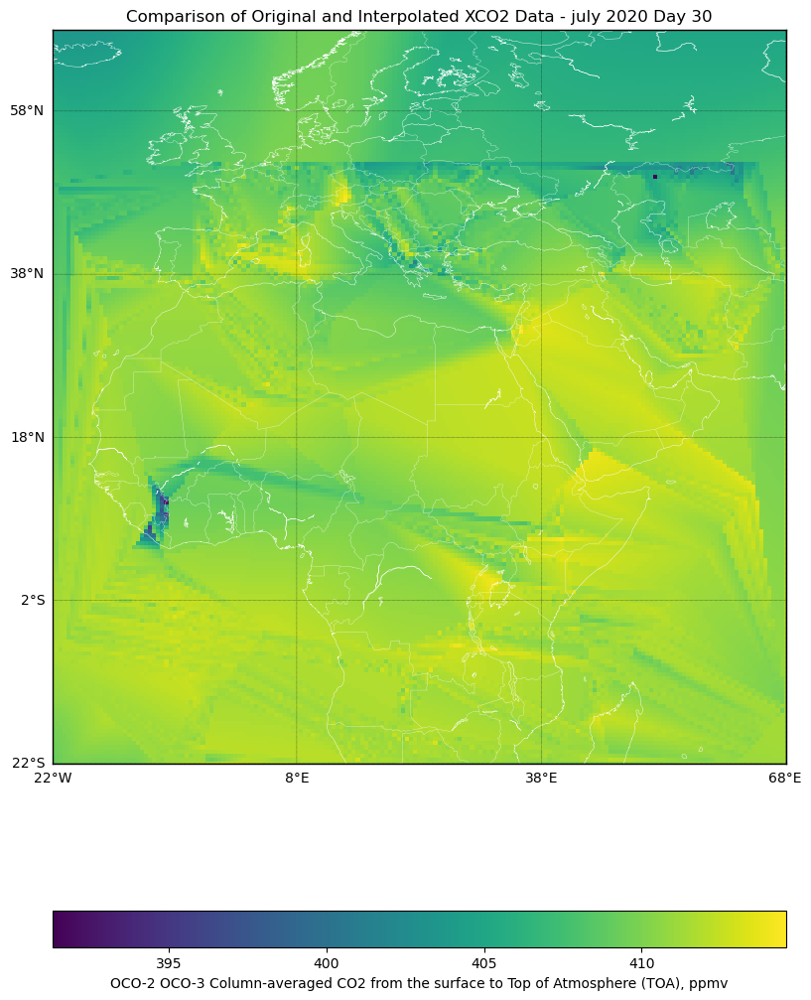

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  409.078064    29     181     181
1         -21.5      -22.0  409.259857    29     181     181
2         -21.0      -22.0  409.447113    29     181     181
3         -20.5      -22.0  409.577240    29     181     181
4         -20.0      -22.0  409.664612    29     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  404.999878    29     181     181
32757      66.5       68.0  405.006714    29     181     181
32758      67.0       68.0  405.014252    29     181     181
32759      67.5       68.0  405.022614    29     181     181
32760      68.0       68.0  405.031677    29     181     181

[32761 rows x 6 columns]
(181, 181) (181, 181)
dimension (181, 181)
(181, 181)
I am nwae =  [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
before training the model [[[-14

C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


403/403 - 1s - 3ms/step - loss: 0.0253 - val_loss: 0.1335
Epoch 2/20
403/403 - 0s - 1ms/step - loss: 0.0092 - val_loss: 0.1376
Epoch 3/20
403/403 - 0s - 1ms/step - loss: 0.0074 - val_loss: 0.1581
Epoch 4/20
403/403 - 0s - 1ms/step - loss: 0.0066 - val_loss: 0.2046
Epoch 5/20
403/403 - 0s - 1ms/step - loss: 0.0063 - val_loss: 0.1652
Epoch 5: early stopping
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
X:  (32761, 2)
before [[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]
after (181, 181) [[409.23098755 409.31555176 409.4012146  ... 411.05206299 411.03881836
  411.02566528]
 [409.3477478  409.42767334 409.50860596 ... 409.87215735 410.45817964
  411.02005005]
 [409.46875    409.5440979  409.62030029 ... 410.51613748 411.90129674
  411.01531982]
 ...
 [401.80169678 401.99319458 402.16592407 ... 401.21722412 401.20401001
  401.19210815]
 [401.73690796 401.92111206 402.09646606 ... 401.03527832 401.02093506
  401.00793457]
 [401.67346191 401.85055542 402.02841187 ... 400.85369873 400.83822632
  4

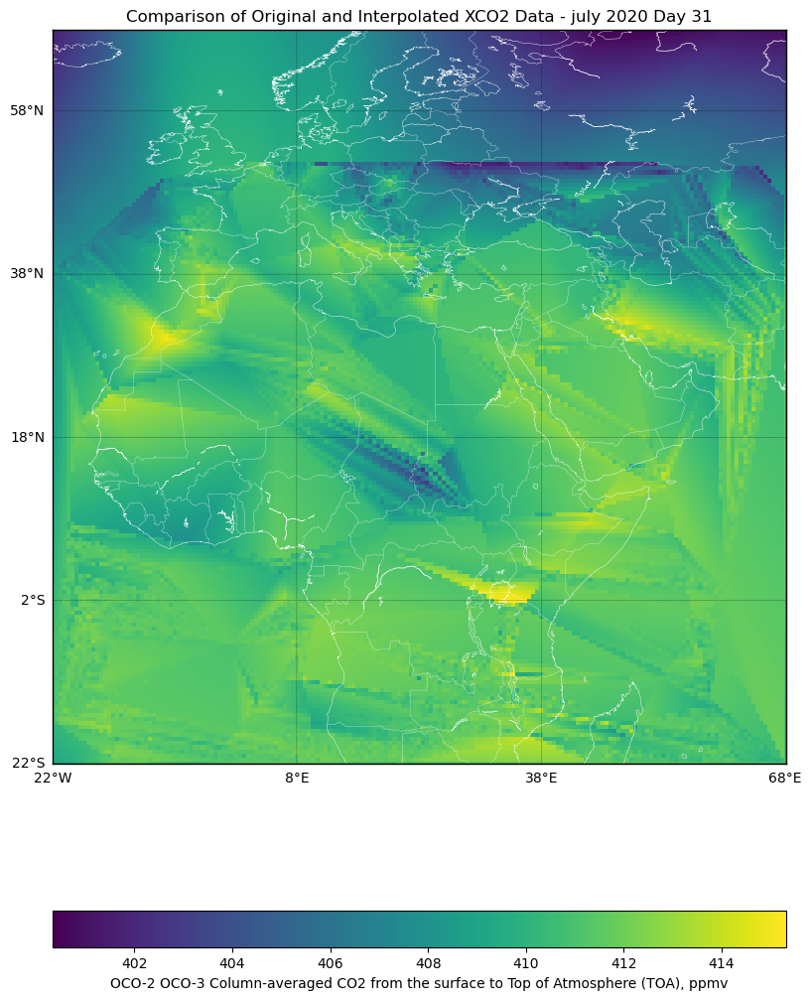

here is df        latitude  longitude        xco2  date  shape1  shape2
0         -22.0      -22.0  409.230988    30     181     181
1         -21.5      -22.0  409.315552    30     181     181
2         -21.0      -22.0  409.401215    30     181     181
3         -20.5      -22.0  409.487976    30     181     181
4         -20.0      -22.0  409.631622    30     181     181
...         ...        ...         ...   ...     ...     ...
32756      66.0       68.0  400.888611    30     181     181
32757      66.5       68.0  400.870483    30     181     181
32758      67.0       68.0  400.853699    30     181     181
32759      67.5       68.0  400.838226    30     181     181
32760      68.0       68.0  400.824097    30     181     181

[32761 rows x 6 columns]
31
(31, 181, 181)
stationinfo   Code     Station  Latitude  Longitude
0   so   Sodankylä     67.37      26.63
1   pr       Paris     48.85       2.36
2   ni     Nicosia     35.14      33.38
3   iz       Izana     28.31     -16.50
4

C:\Users\Dr. Mohamad Awad\AppData\Local\Temp\ipykernel_7596\2803921911.py:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', num_stations)


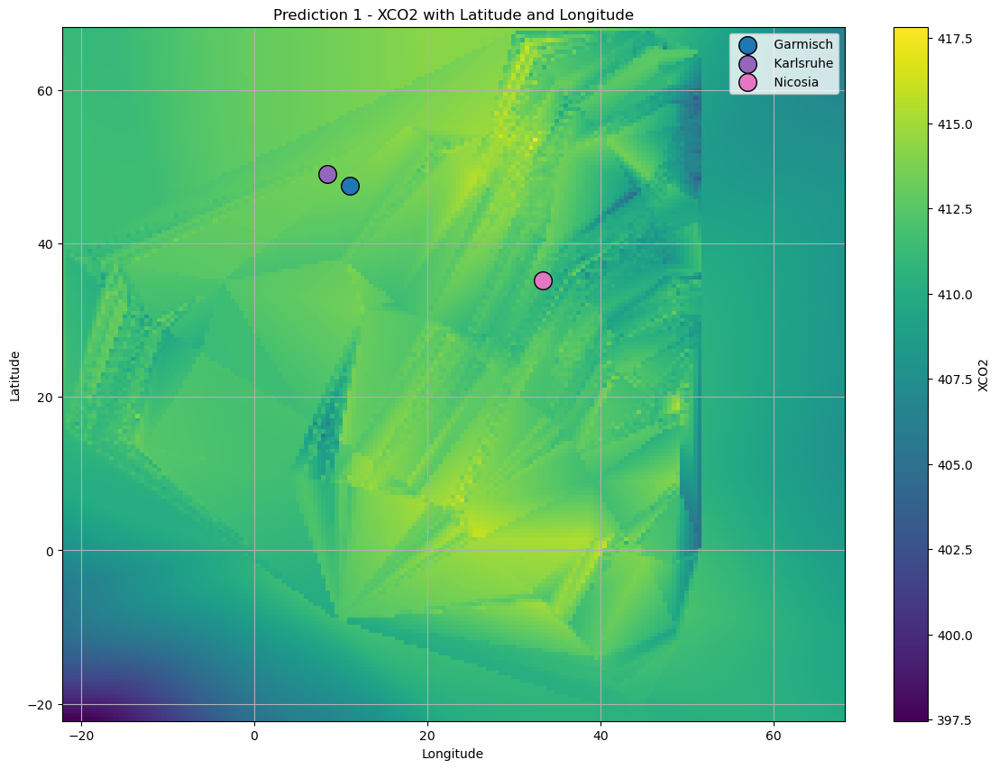

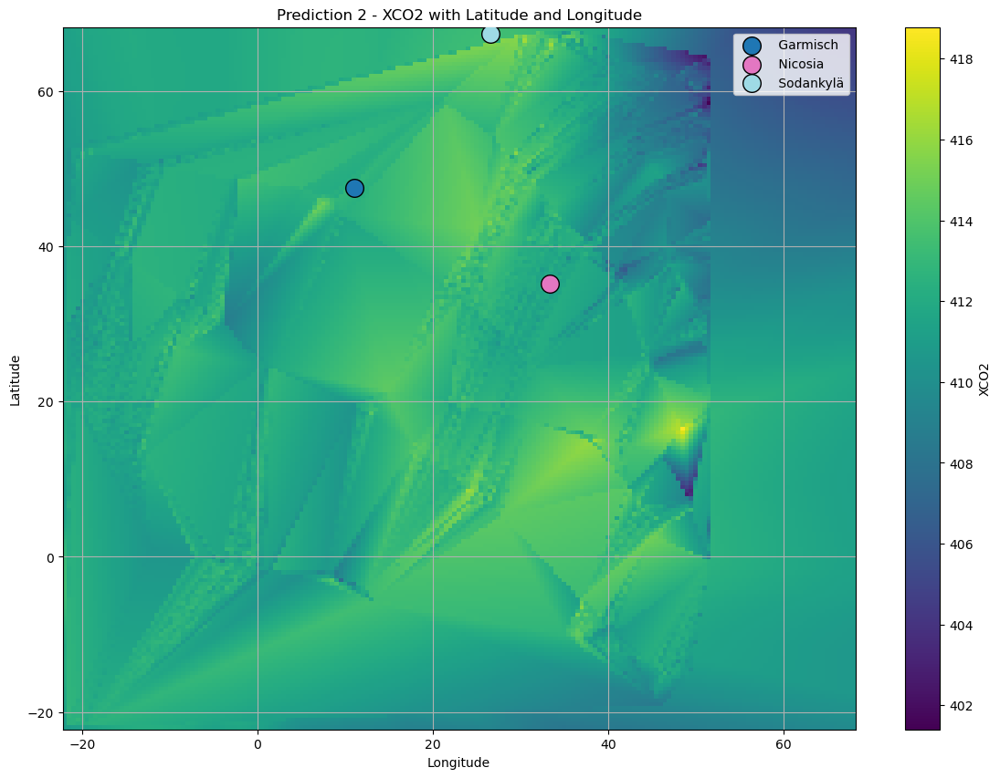

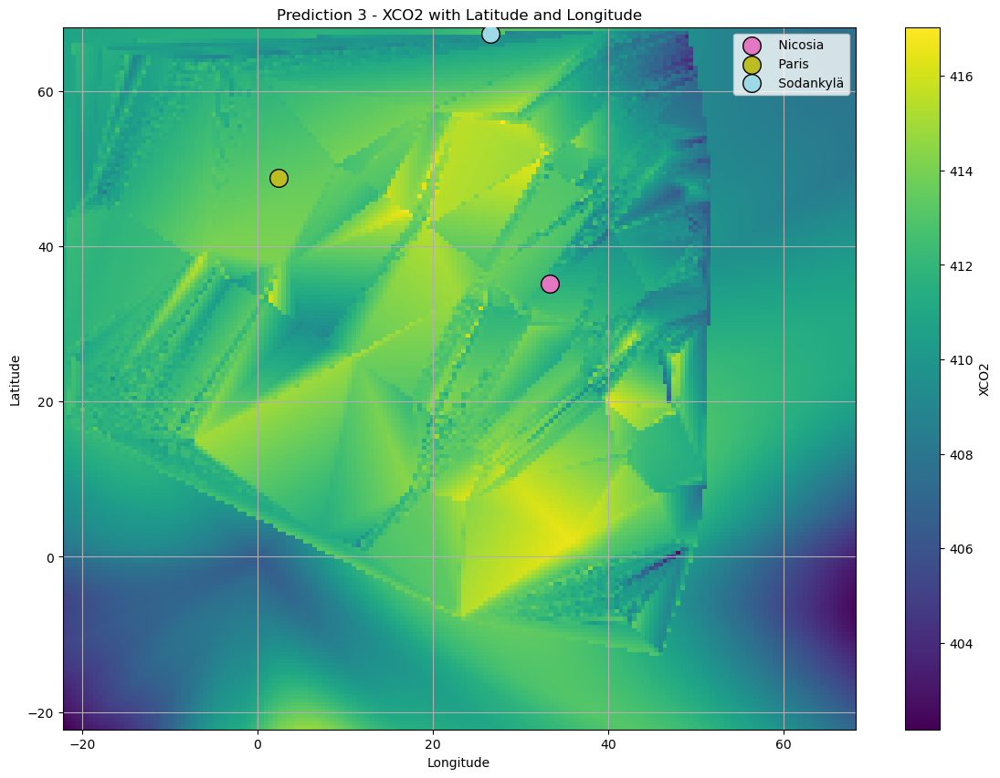

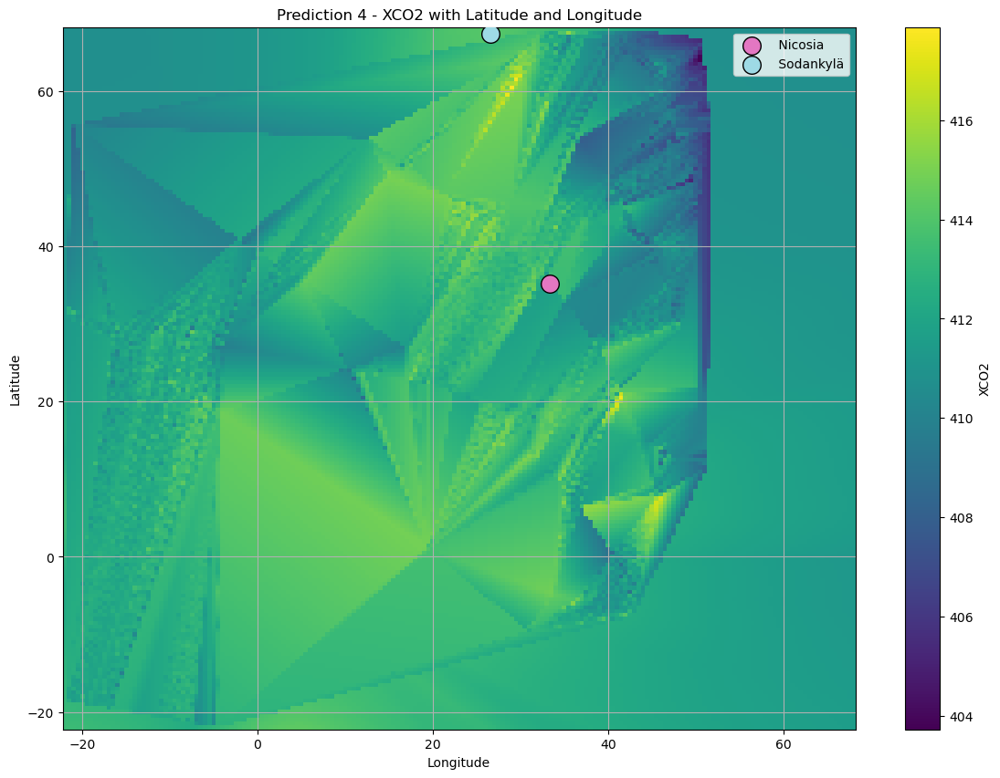

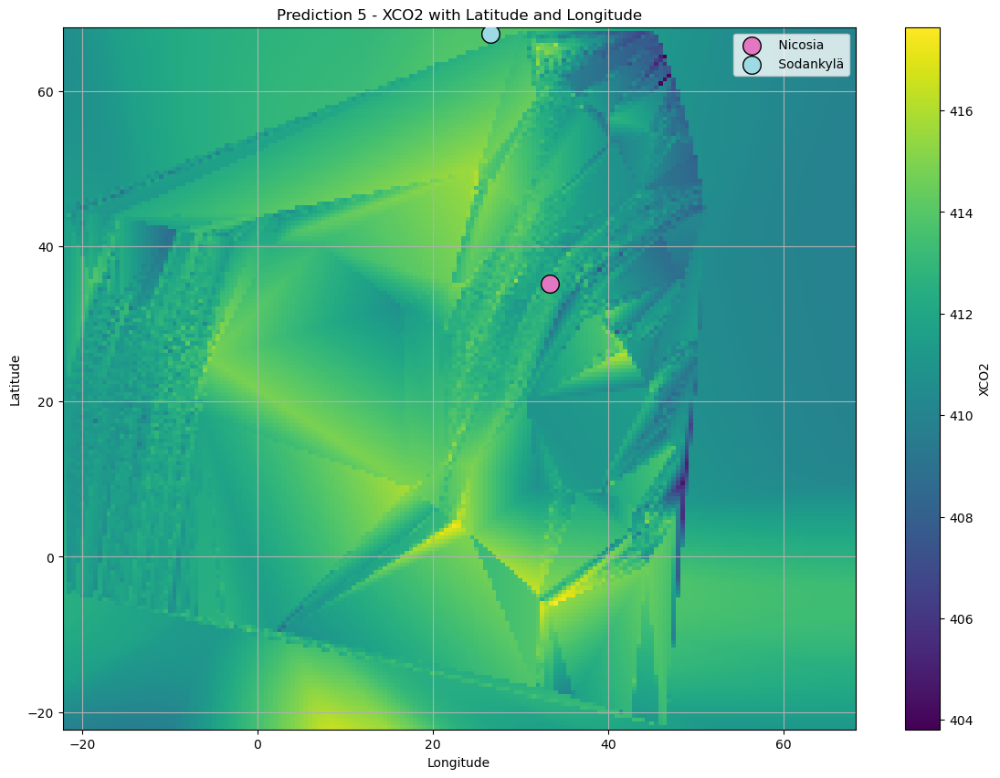

...

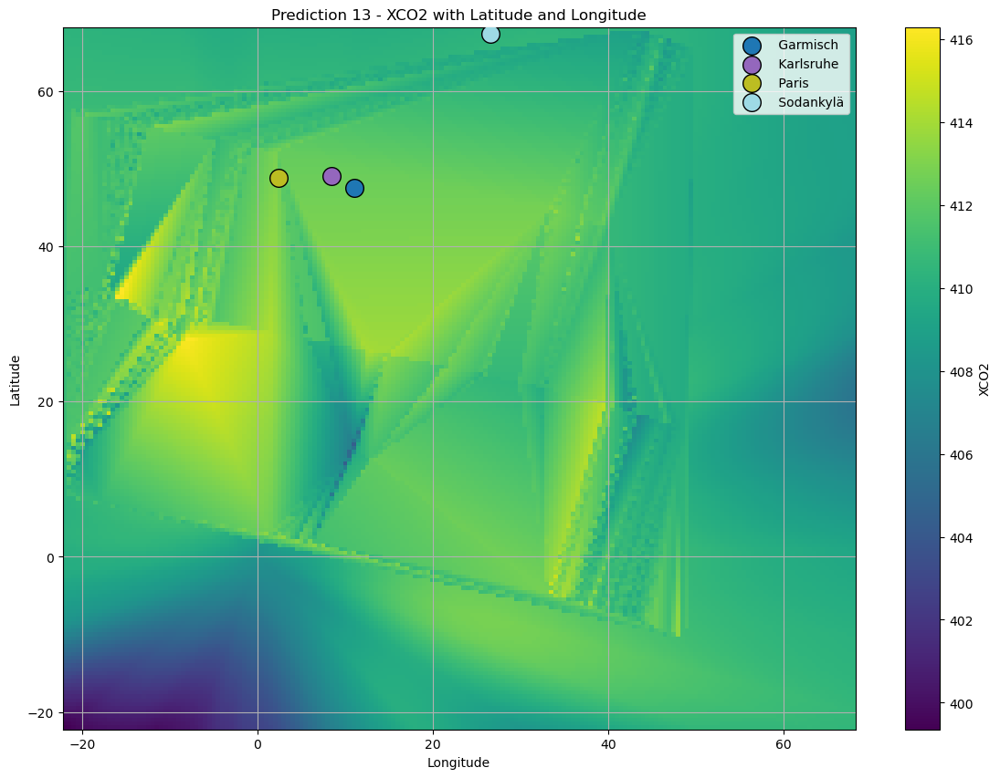

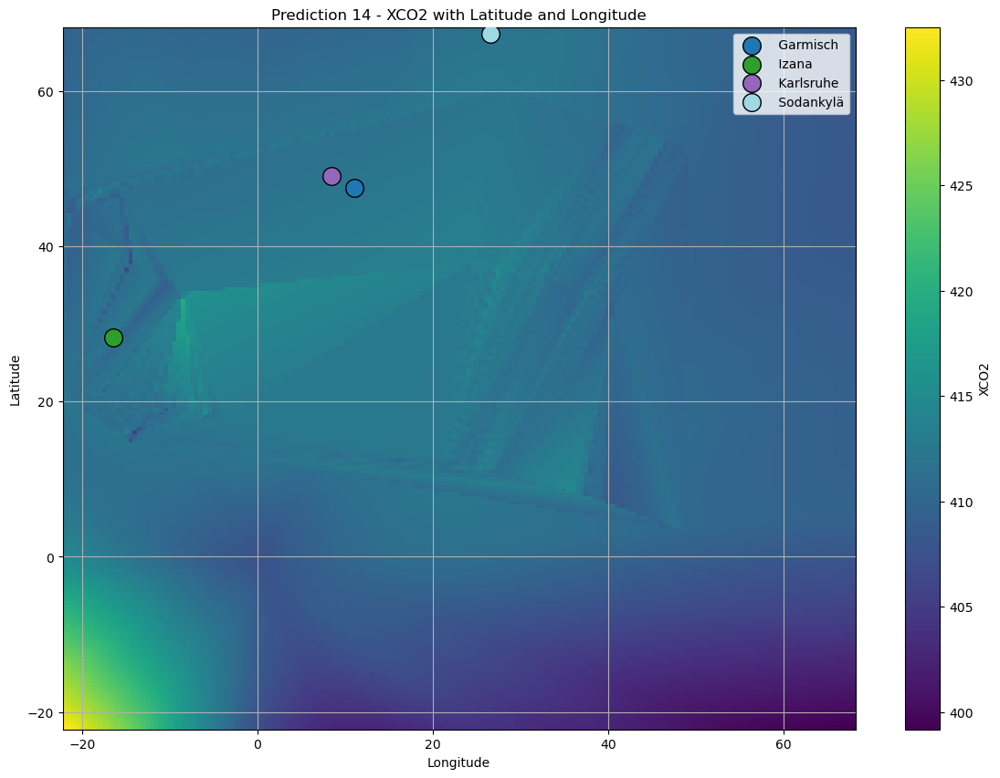

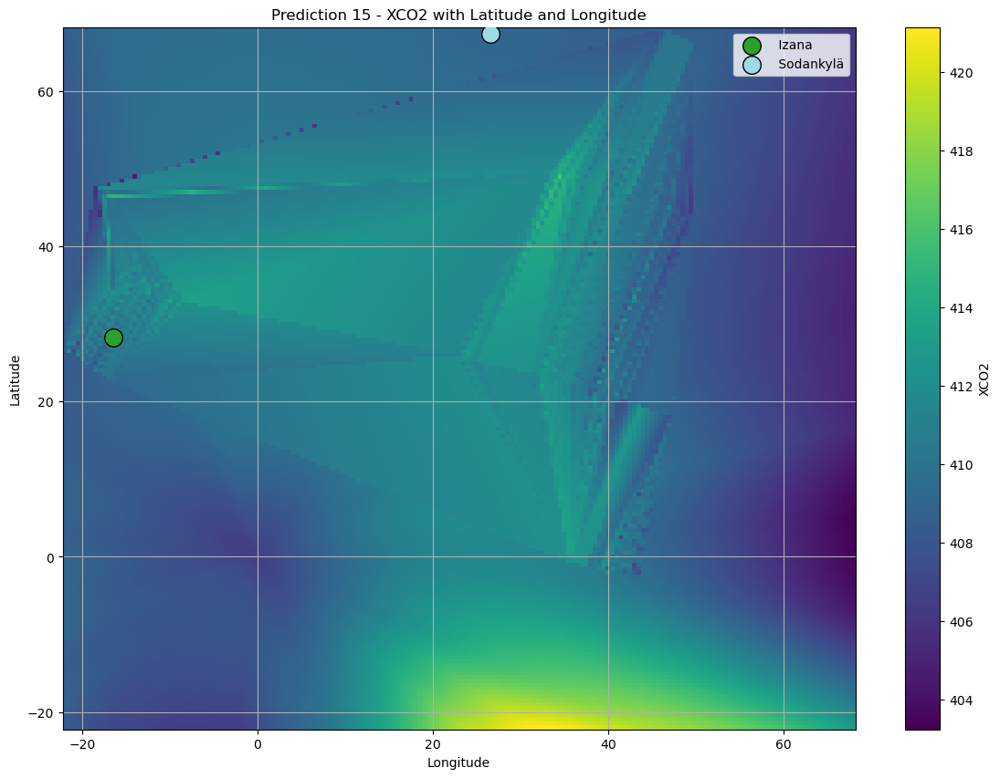

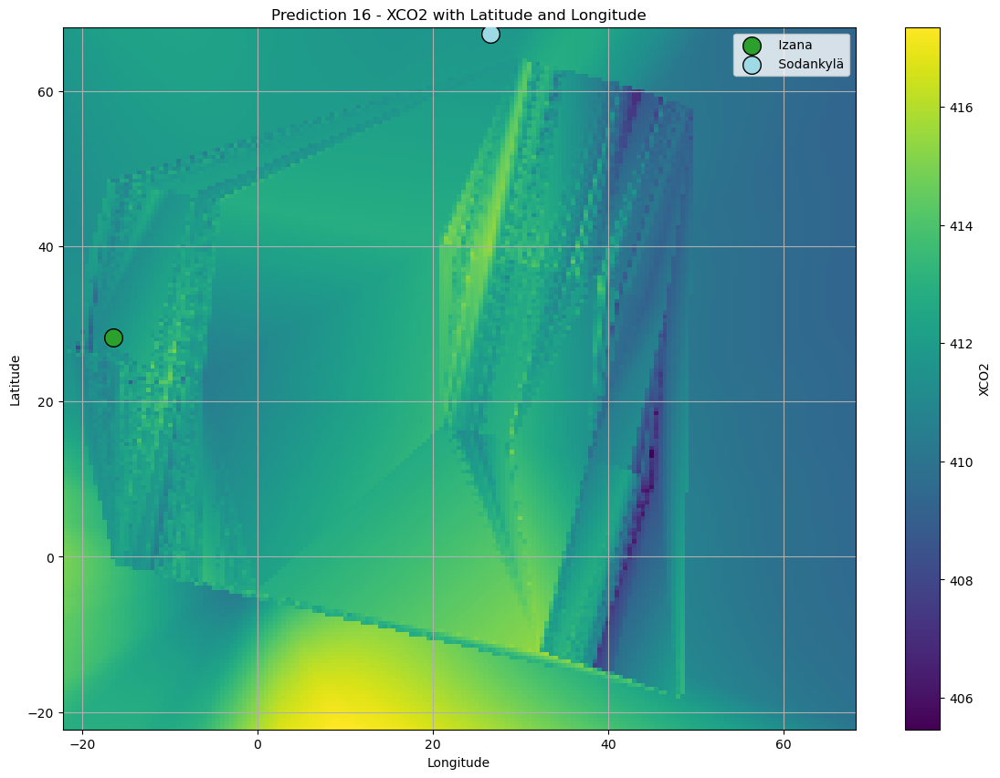

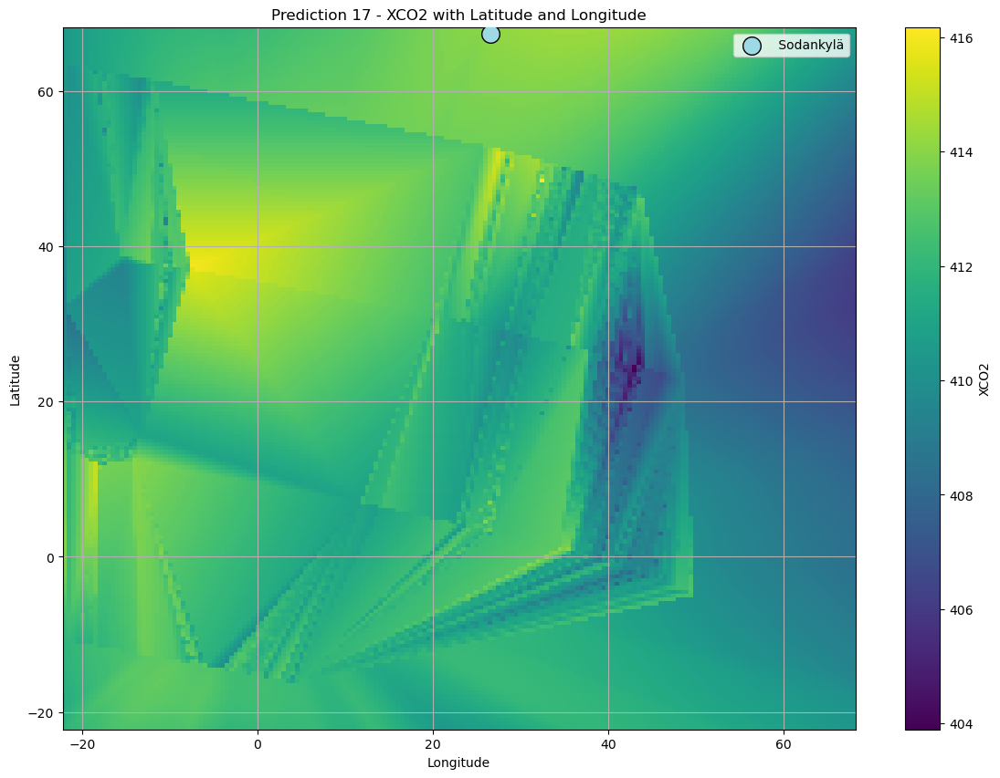

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


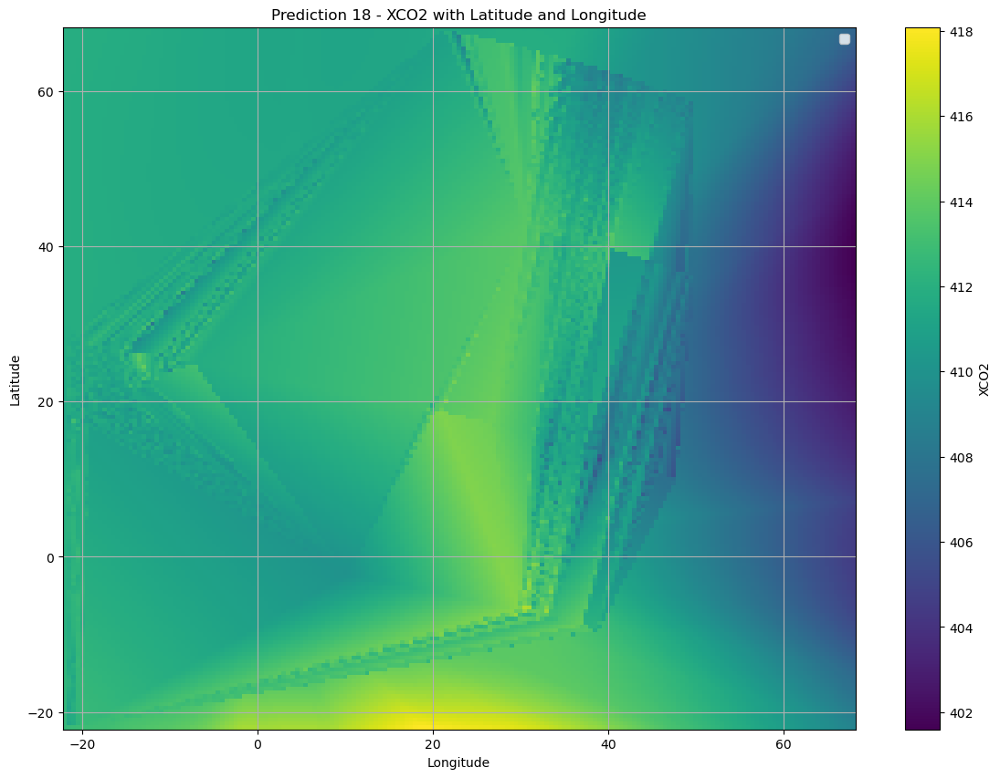

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


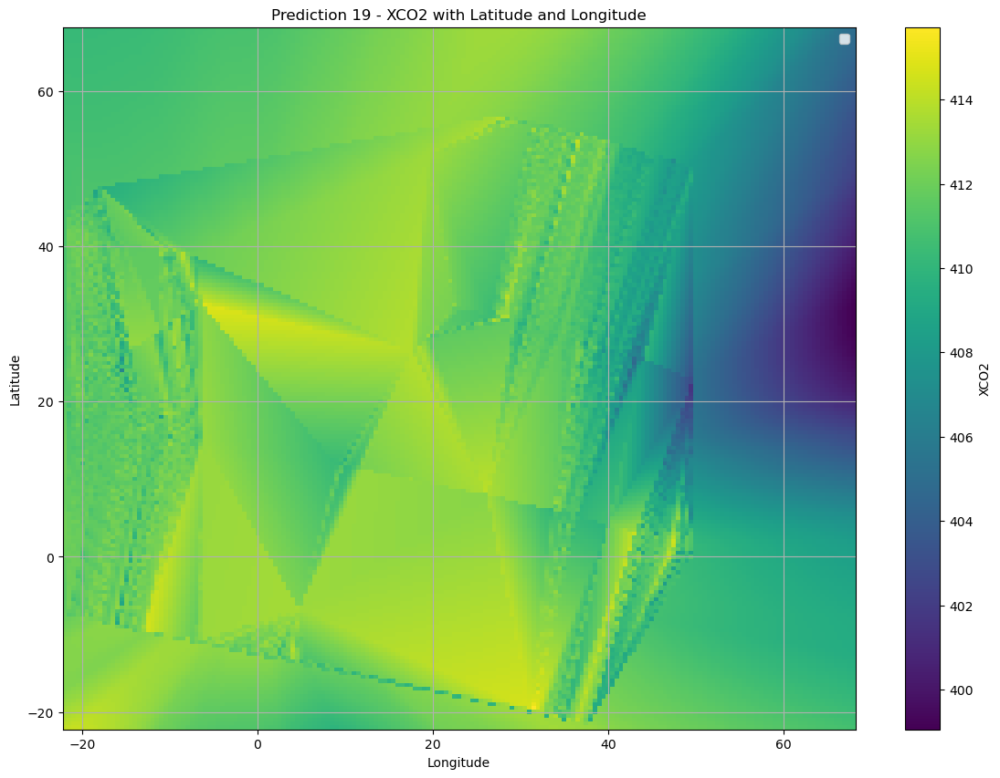

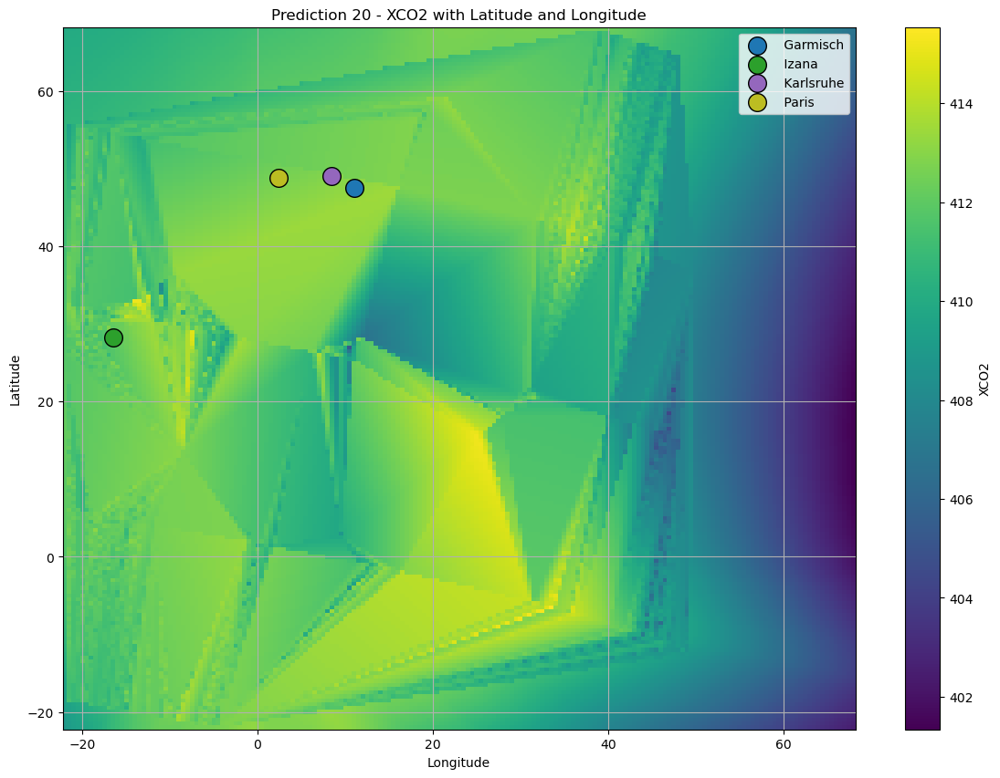

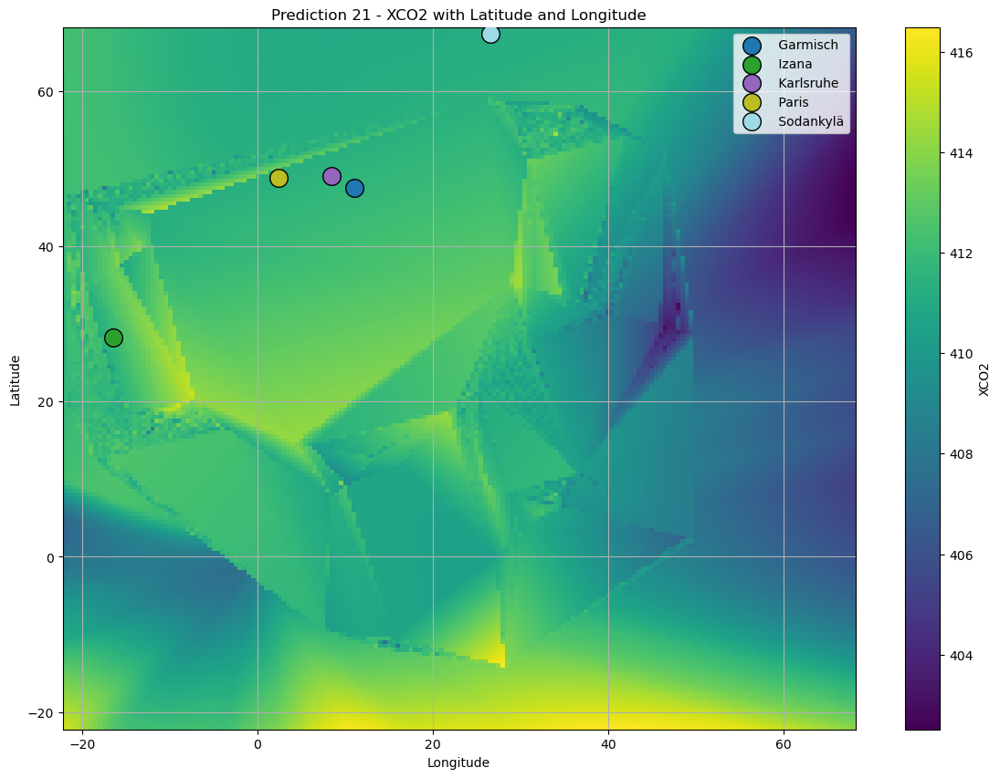

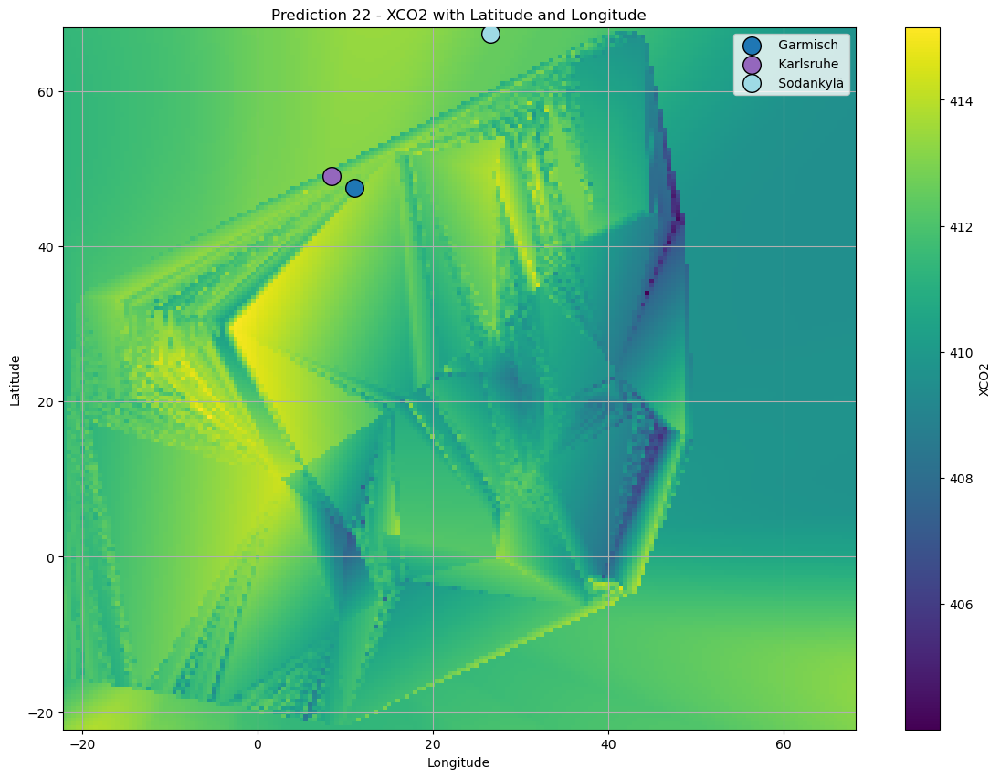

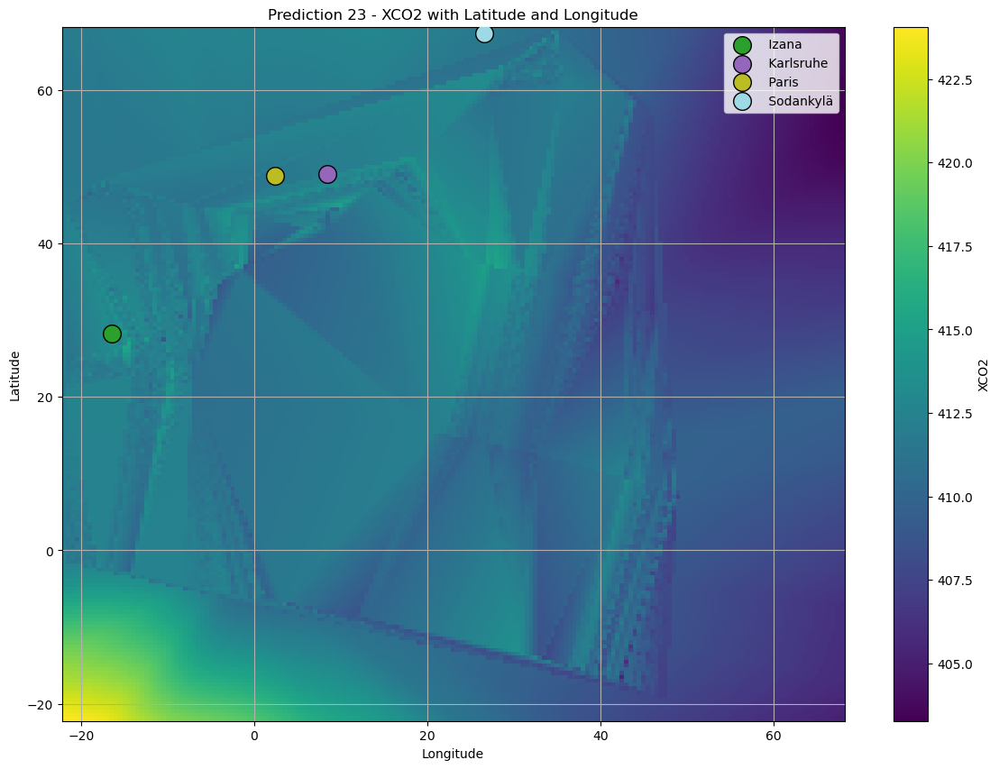

...

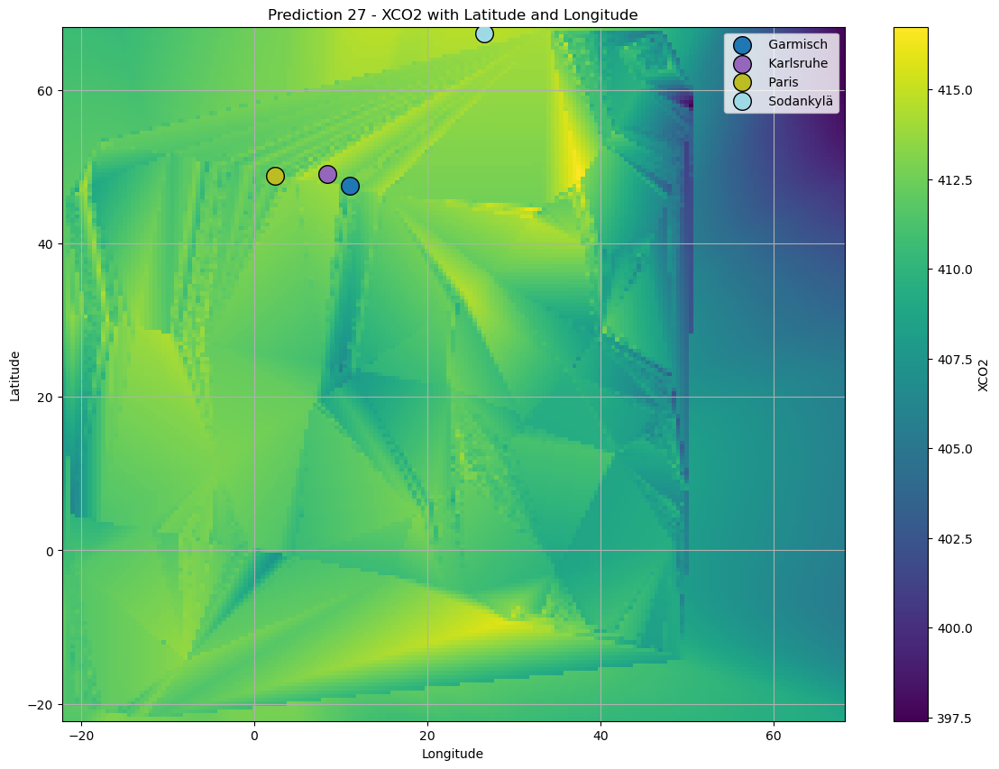

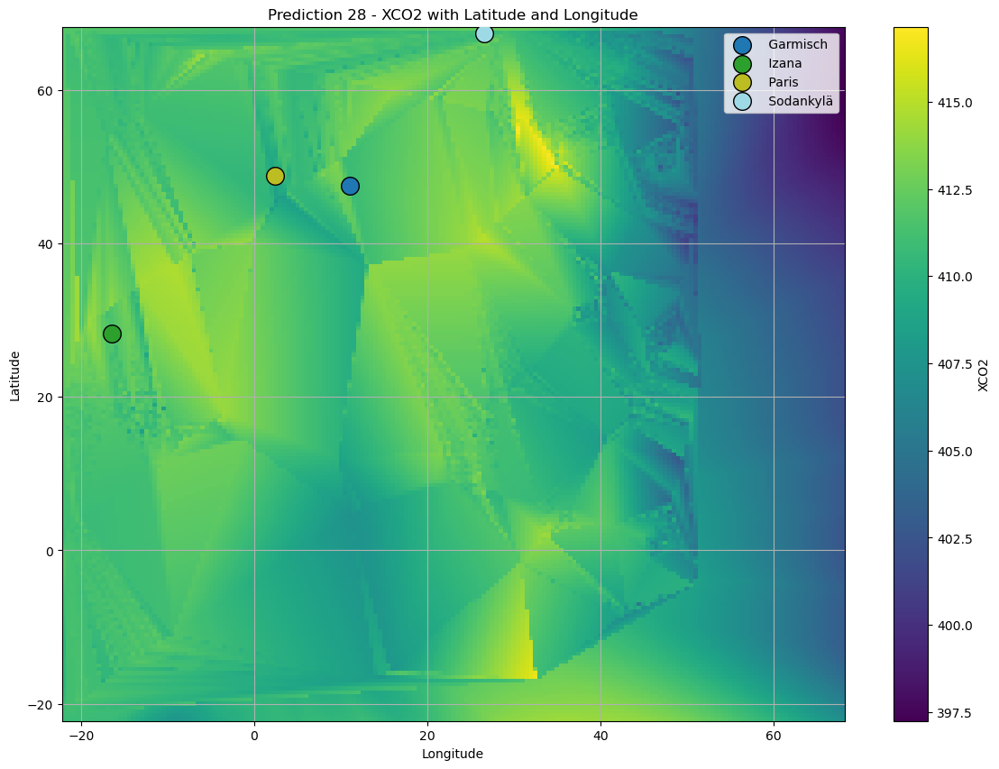

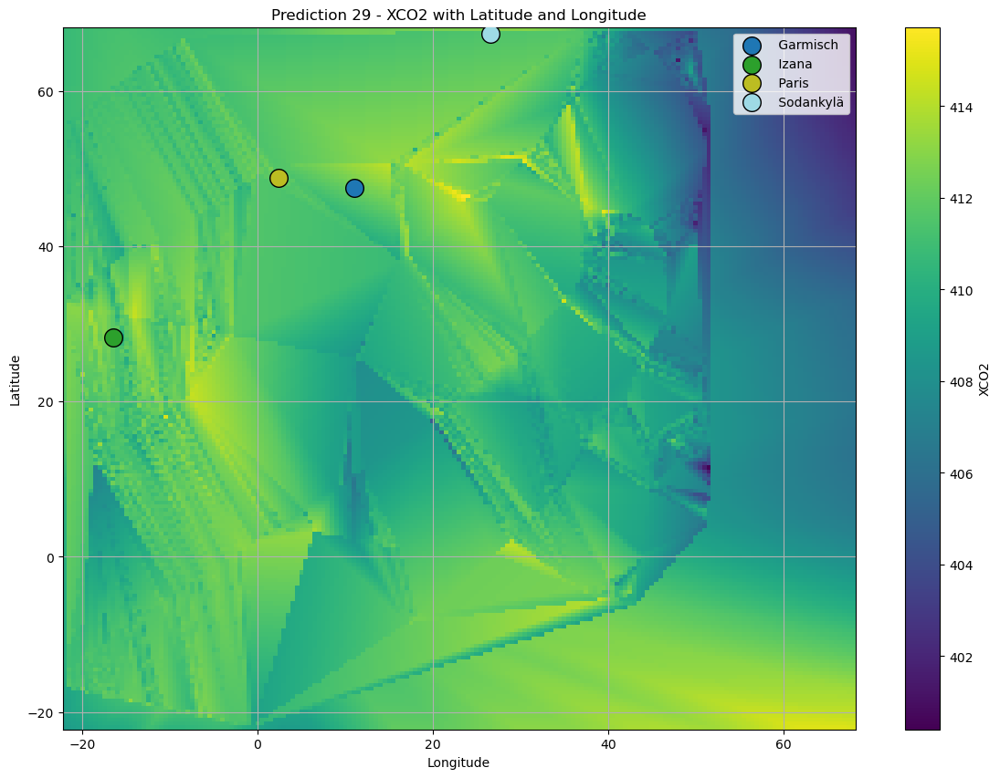

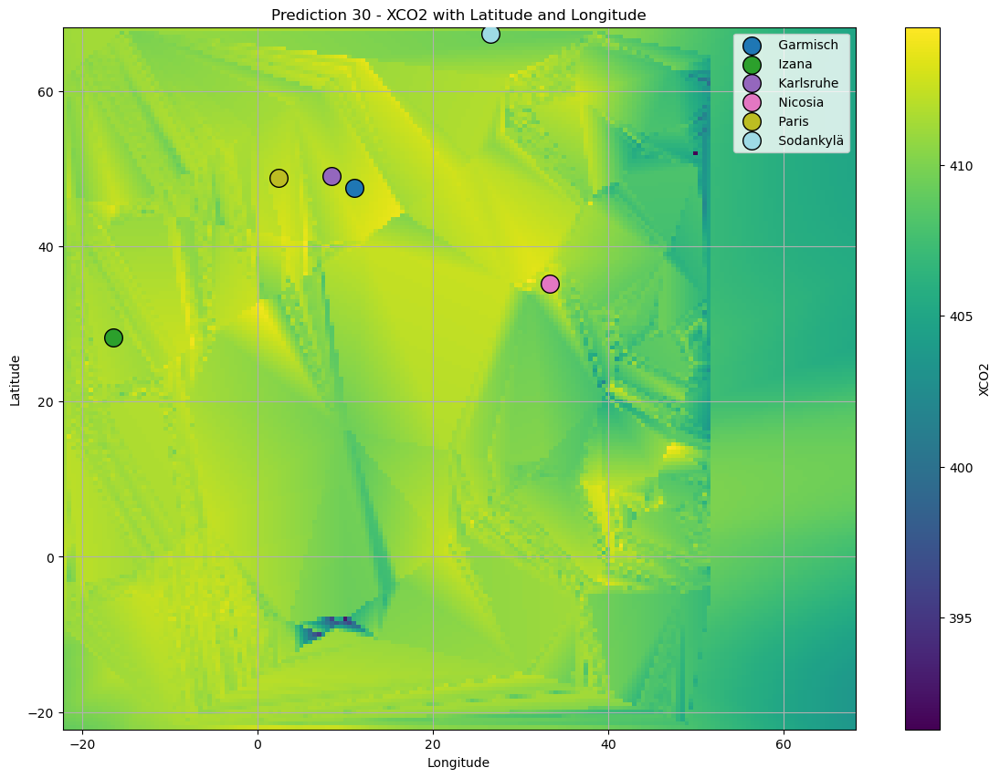

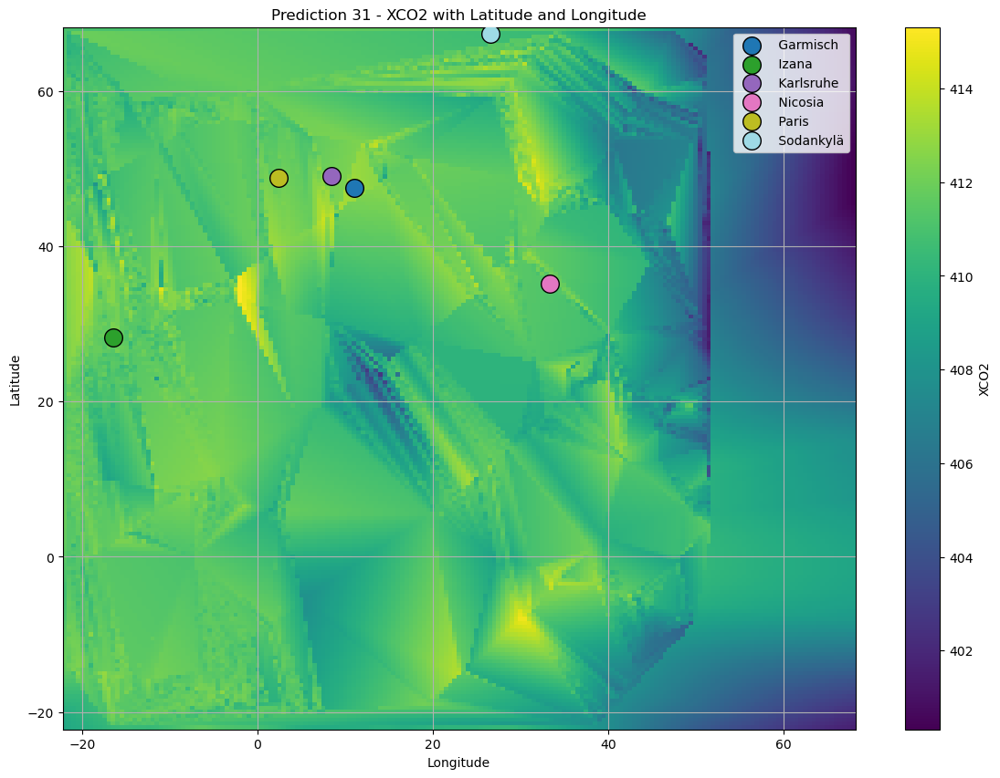

RMSE and MAE for each station for each day:
Station  Garmisch: RMSE = [1.656630109638968, 1.0639229811616815, 'N/A', 'N/A', 'N/A', 0.34461964578747484, 2.961464442478416, 2.573154178380207, 1.4999789999408222, 0.6650779102261595, 'N/A', 'N/A', 3.9224293654778535, 4.24257969957506, 'N/A', 'N/A', 'N/A', 'N/A', 'N/A', 5.374288126374722, 1.134859806781492, 1.0864442396249956, 'N/A', 'N/A', 'N/A', 'N/A', 4.6533136332459435, 0.4867446358647385, 1.9461957739521267, 2.572927447091047, 1.026285650174998], MAE = [1.656630109638968, 1.0639229811616815, 'N/A', 'N/A', 'N/A', 0.34461964578747484, 2.961464442478416, 2.573154178380207, 1.4999789999408222, 0.6650779102261595, 'N/A', 'N/A', 3.9224293654778535, 4.24257969957506, 'N/A', 'N/A', 'N/A', 'N/A', 'N/A', 5.374288126374722, 1.134859806781492, 1.0864442396249956, 'N/A', 'N/A', 'N/A', 'N/A', 4.6533136332459435, 0.4867446358647385, 1.9461957739521267, 2.572927447091047, 1.026285650174998]
Station  Izana: RMSE = ['N/A', 'N/A', 'N/A', 'N/A', 'N/A', 2.

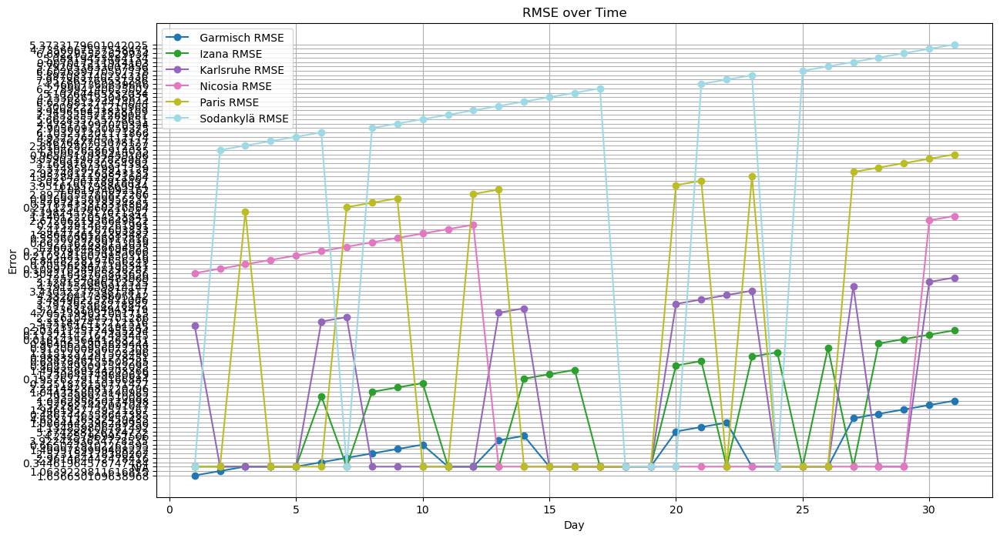

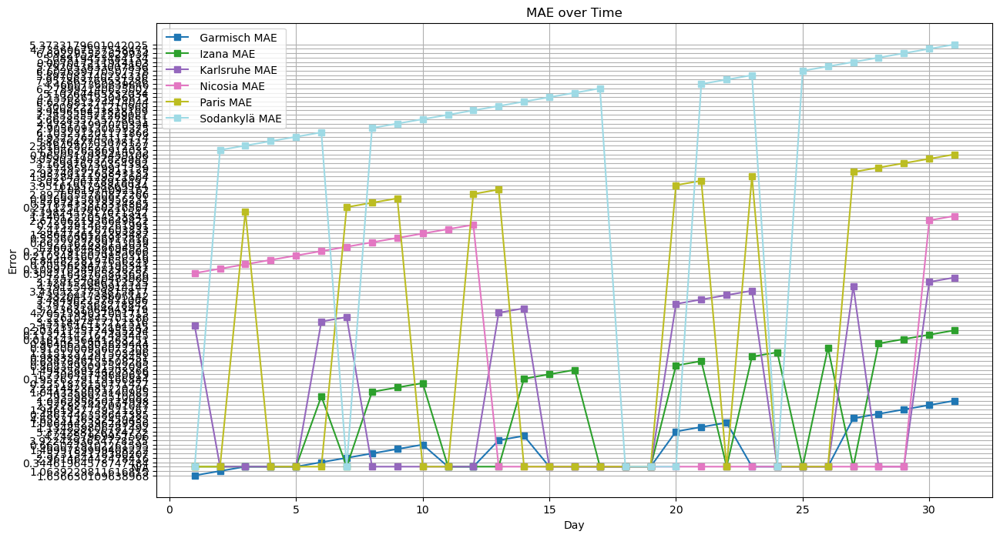

CPU times: total: 1min 21s
Wall time: 3min 24s


In [ ]:
# for LSTM use the one below as first step without dates
%%time
import pandas as pd
import pandas as pd1
time_series_b = []
version_str = 'B11100Ar'
file = ''
x_meas1 = []
latitude_max = 68
latitude_min = -22
longitude_max = 68
longitude_min =-22
alldates= np.unique(arr2[:]['date'])
df_list = []
df1_list = []
P=1
inc=0
for j in range(0,len(alldates),P):
  x_meas1 = []
  latitude_max = 68
  latitude_min = -22
  longitude_max = 68
  longitude_min =-22
  arr3=[]
  #for i in range(j,3):#j+1,1):
   #print("I am here near arr3",i)
  arr3.extend(arr2[arr2[:]['date'] == np.datetime64( (alldates[j]))])
  #print(len(arr3))
  # Read the data from your variables
  latitude = np.array([row['Lat'] for row in arr3]) # Extract 'Lat' values into a numpy array
  longitude = np.array([row['Long'] for row in arr3]) # Extract 'Long' values into a numpy array
  x_meas = np.array([row['XCO2'] for row in arr3]) # Extra
  date= np.array([row['date'] for row in arr3]) # Extract 'date' values into a numpy array
  time = np.array([row['time'] for row in arr3]) # Extract 'time' values into a numpy array
  qf = np.array([row['Qual'] for row in arr3]) # Extract 'Qual' values into a numpy array
  # Apply the subset selection
  selection_only = np.where(
      (latitude > latitude_min) & (latitude < latitude_max) &
      (longitude > longitude_min) &(longitude < longitude_max) & (qf == 0)
  )[0]
  # Apply the subset selection to data variables
  df1 = pd.DataFrame(time[selection_only], columns=['datetime_column'])
  # Extract the time
  df1['date_only'] = df1['datetime_column'].dt.date
  df1['time_only'] = df1['datetime_column'].dt.time
  #print(df1['date_only'])
  df1['seconds'] = pd.to_timedelta(df1['time_only'].astype(str)).dt.total_seconds()
  #print(np.sum(df1['seconds']))
  points= np.zeros((len(selection_only),4)).astype(np.float32)
  points[:,0] = date[selection_only]
  points[:,1] = longitude[selection_only]
  points[:,2] = latitude[selection_only]
  points[:,3] = x_meas[selection_only]
  #print(points.shape)
  #print(points[:,0].shape,points[:,1].shape)
 #regress_DL(points[:,0:4],points[:,4])
  pixel_size_deg =0.5 # 5x5 degree grid resolution
  # Get the grid for the interpolated values
  grid_lat, grid_lon = np.mgrid[latitude_min:latitude_max+pixel_size_deg:pixel_size_deg, longitude_min:longitude_max+pixel_size_deg:pixel_size_deg]
  print(grid_lat.shape,grid_lon.shape)
  dimen = grid_lat.shape
  print("dimension",dimen)
  # Bin the data on a consistent lat/lon grid using griddata using nearest neighbor binning; for bi-linear, use method='linear'
  grid_x = griddata((points[:,2], points[:,1]), points[:,3], (grid_lat, grid_lon), method='linear',  rescale=True)
  print(grid_x.shape)
  # Create a list of dataframes
  df = pd.DataFrame({
      #'date': df1['date_only'],
      #'time': df1['time_only'],
      'latitude':  grid_lat.flatten(),
      'longitude': grid_lon.flatten(),
      'xco2': grid_x.flatten(),
     # 'date': j,
      'shape1':dimen[0],
      'shape2':dimen[1]
  })
  df_list.append(df)
  df1_list.append(predict_daily(df,j))
  time_series_b.append(grid_x)
print(len(df_list))
time_series_b = np.array(time_series_b)
print(time_series_b.shape)
x_meas_month_mean_a = np.mean(time_series_b, axis=0)
#regress_DL2(df_list)
obs_stat=readstations()
verify(df1_list,obs_stat)

In [ ]:
# Second step to run without dates LSTM
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, Dense, Flatten
from sklearn.metrics import mean_squared_error
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.losses import BinaryCrossentropy
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from scipy.stats import pearsonr
# Assuming dataframes are combined into a single DataFrame 'df'
# df = pd.concat(list_of_dataframes)
def predict_daily(df_list,daytime):
  #df_combined = pd.concat(df_list, ignore_index=True)
  df_combined = df_list
  scaler = MinMaxScaler()
  #df_combined[[ 'xco2']] = scaler.fit_transform(df_combined[[ 'xco2']])
  # Prepare input and output
  X = df_combined[['longitude', 'latitude']].values
  y = df_combined['xco2'].values
  #daytime = df_combined['date'].values
  dimen1 = df_combined['shape1'].values
  dimen2 = df_combined['shape2'].values
  # Reshape input for CNN+LSTM [samples, timesteps, features]
  #X_scaled = scaler.fit_transform(X)
  y_scaled = scaler.fit_transform(y.reshape(-1, 1))
  #X_scaled = X_scaled.reshape((X_scaled.shape[0], 1, X_scaled.shape[1]))
  X_scaled = X.reshape((X.shape[0], 1, X.shape[1]))
  #X = X.reshape((X.shape[0], 1, X.shape[1]))'''
  #X = X.reshape((X.shape[0], 1, X.shape[1]))
  #print(X.shape)
  #print("scaled")
  #print(X_scaled[:5] )
  #print(me)
  #print(y_scaled)
  # Split data into training and testing sets
  # Train-test split
  nan_indices = np.isnan(y) # Extract the elements of X where y values are NaN
  X_test = X_scaled[nan_indices]
  y_test = y_scaled[nan_indices]
  print("I am nwae = ", y_test)
  y_test = np.nan_to_num(y_test, nan=0.0)
  print(y_test)
  X_train = X_scaled[~nan_indices]
  y_train = y_scaled[~nan_indices]

  y_test = np.nan_to_num(y_test, nan=0.0)
  print(y_test)
  #X_train, X_test, y_train, y_test = train_test_split(X_scaled,y_scaled, test_size=0.2, random_state=42)
  #X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42)
  print("before training the model", X_train)
  #print(pd('star'))
  # Build CNN+LSTM model
  model = Sequential()
  model.add(Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
  model.add(MaxPooling1D(pool_size=1))
  model.add(LSTM(50, activation='relu'))
  model.add(Dense(1))
  #model.compile(optimizer='adam', loss='mse')
  model.compile(optimizer=SGD(learning_rate=0.01),loss='mse')#, metrics=['accuracy'])#loss=BinaryCrossentropy(), metrics=['accuracy'])
  plot_model(model, to_file='lstm_model.png', show_shapes=True, show_layer_names=True)
  early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=5, verbose=1, mode='min', baseline=0.1)
  history = model.fit(X_train, y_train, epochs=20, batch_size=64, validation_data=(X_test, y_test), verbose=2,callbacks=[early_stopping])
  # Train model
  #model.fit(X_train, y_train, epochs=10, batch_size=64, validation_data=(X_test, y_test), verbose=2)
  # Predict
  y_pred = model.predict(X_test)
  df1=display_results(y_pred, y_scaled,X_scaled,nan_indices ,scaler, dimen1, dimen2, daytime)
  print("here is df", df1)
  #.reshape(-1, 1)
  #reshape(X_scaled.shape[0], 1, X_scaled.shape[1])
  return df1


In [ ]:
latitude_max = 68
latitude_min = -22
longitude_max = 68
longitude_min =-22
from datetime import datetime

aspect_ratio = (longitude_max - longitude_min) / (latitude_max - latitude_min)
w = 3600; h = w / aspect_ratio
current_date = datetime.strptime("July-2023", "%B-%Y")
# Specify figure size (in inches)
dpi = 300;
import pandas as pd
def display_results(y_pred, y_scaled,X_scaled,indices,scaler, dimen1, dimen2,daytime):
  y_pred_inv = scaler.inverse_transform(y_pred)
  y_pred_inv= y_pred_inv.reshape(-1, 1)
  X_scaled_2D = X_scaled.reshape(X_scaled.shape[0], X_scaled.shape[2]) # Reshape to (samples, features)
  print('X: ',  X_scaled_2D.shape)
  #X_scaled_inv = scaler.inverse_transform(X_scaled_2D) # Apply inverse_transform to the reshaped 2D array
  y_scaled_inv = scaler.inverse_transform(y_scaled)
  print('before', y_scaled_inv[indices])
  y_scaled_inv[indices]=y_pred_inv
  y_scaled_inv_re = y_scaled_inv.reshape(dimen)
  print('after', y_scaled_inv_re.shape, y_scaled_inv_re)
  grid_lat= X_scaled_2D[:,0].reshape(dimen)
  grid_lon= X_scaled_2D[:,1].reshape(dimen)
  df = pd.DataFrame({
      #'date': df1['date_only'],
      #'time': df1['time_only'],
      'latitude':  grid_lat.flatten(),
      'longitude': grid_lon.flatten(),
      'xco2':y_scaled_inv_re.flatten(),
      'date': daytime,
      'shape1':dimen1,
      'shape2':dimen2
  })
  print("latitude and longitude",grid_lat,grid_lon)
  plt.figure(figsize=(w / dpi, h / dpi))
# Create a basemap instance
  m = Basemap(projection='cyl', resolution='l',
              llcrnrlat=latitude_min, urcrnrlat=latitude_max,  # set latitude limits as previously defined
              llcrnrlon=longitude_min, urcrnrlon=longitude_max)  # set longitude limits as previously defined

  m.drawmapboundary(fill_color='black')
  m.drawcoastlines(linewidth=0.3, color='white')
  m.drawcountries(linewidth=0.2, color='white')

  # Draw parallels (latitude lines) and meridians (longitude lines)
  parallels = np.arange(latitude_min, latitude_max+1, 20.)
  m.drawparallels(parallels, labels=[True,False,False,False], linewidth=0.3)

  meridians = np.arange(longitude_min, longitude_max+1, 30.)
  m.drawmeridians(meridians, labels=[False,False,False,True], linewidth=0.3)

  pixel_size_deg =0.1 # 5 degree resolution

  # Get the grid for the interpolated values
  vmax1=np.max(y_scaled_inv)  # Apply the mask to the slice
  vmin1= np.min(y_scaled_inv)  # Apply the mask to the slice
  print(vmax1," ",vmin1)
  # Plot the interpolated data using pcolormesh instead of scatter
  m.drawlsmask(land_color='white', ocean_color='black', lakes=True)
  sc = m.pcolormesh( grid_lat, grid_lon, y_scaled_inv_re, latlon=True)#, cmap='jet', alpha=0.9, vmin=vmin1, vmax=vmax1, shading='auto')
  #m.scatter(longitude,latitude,c =x_meas,s = 5,cmap = 'Greys')
  # Add a colorbar
  cbar = m.colorbar(sc, location='bottom', pad="20%")
  cbar.set_label('OCO-2 OCO-3 Column-averaged CO2 from the surface to Top of Atmosphere (TOA), ppmv')

  # set plot title
  title_date = current_date #.strftime("%b-%Y")
  #plt.title(f'OCO-2 OCO-3 Column-averaged CO2 Monthly Average for july 2023')
  plt.title(f'Comparison of Original and Interpolated XCO2 Data - july 2020 Day {daytime+1}')
  #\nMin: {title_min:.01f}, Max: {title_max:.01f} ppmv')

  # Save figure to PNG file
  #plt.savefig(f'./DINEOF_2020_2023_45_90/oco2_oco3_co2_month_average_july_2023_LSTMinter.png', dpi=dpi, bbox_inches='tight')
  plt.savefig(f'./DINEOF_2020_2023_45_90/LSTM/july2020/oco2_oco3_co2_july_{daytime+1}_2020_LSTMinter.png', dpi=dpi, bbox_inches='tight')
  plt.show()
  plt.close()
  return df

In [ ]:
readstations()

stationinfo   Code     Station  Latitude  Longitude
0   so   Sodankylä     67.37      26.63
1   pr       Paris     48.85       2.36
2   ni     Nicosia     35.14      33.38
3   iz       Izana     28.31     -16.50
4   gm    Garmisch     47.48      11.06
5   ka   Karlsruhe     49.10       8.44
Time Units: seconds since 1970-01-01 00:00:00
Time Units: seconds since 1970-01-01 00:00:00
Time Units: seconds since 1970-01-01 00:00:00
Time Units: seconds since 1970-01-01 00:00:00
Time Units: seconds since 1970-01-01 00:00:00
Time Units: seconds since 1970-01-01 00:00:00
                         Time        XCO2     Station  Longitude  Latitude
0     2007-07-18 08:55:45.984  385.170013    Garmisch      11.06     47.48
1     2007-07-18 08:59:00.384  385.549988    Garmisch      11.06     47.48
2     2007-07-18 09:25:08.544  385.579987    Garmisch      11.06     47.48
3     2007-07-18 09:28:24.672  385.500000    Garmisch      11.06     47.48
4     2007-07-19 06:18:05.184  384.079987    Garmisch    

,Time,XCO2,Station,Longitude,Latitude
0,2007-07-18 08:55:45.984,385.170013,Garmisch,11.06,47.48
1,2007-07-18 08:59:00.384,385.549988,Garmisch,11.06,47.48
2,2007-07-18 09:25:08.544,385.579987,Garmisch,11.06,47.48
3,2007-07-18 09:28:24.672,385.500000,Garmisch,11.06,47.48
4,2007-07-19 06:18:05.184,384.079987,Garmisch,11.06,47.48
...,...,...,...,...,...
99965,2021-07-31 17:01:52.896,407.390015,Sodankylä,26.63,67.37
99966,2021-07-31 17:04:20.640,408.100006,Sodankylä,26.63,67.37
99967,2021-07-31 17:28:59.808,407.170013,Sodankylä,26.63,67.37
99968,2021-07-31 17:35:16.512,406.730011,Sodankylä,26.63,67.37


In [ ]:
# for LSTM useitas first step with dates
%%time
import pandas as pd
import pandas as pd1
time_series_b = []
version_str = 'B11100Ar'
file = ''
x_meas1 = []
latitude_max = 45
latitude_min = 0
longitude_max = 90
longitude_min =0
alldates= np.unique(arr2[:]['date'])
#file_path = "G:/My Drive/OCO2-OCO3/output/co2july2023all3.nc"  # created by
#dataset = nc.Dataset(file_path, 'r')
#data = dataset.variables['xco2'][:]  # Replace 'data_variable' with the actual variable name
#dataset.close()
df_list = []
'''for j in range(0,len(alldates)-1,30):
  arr3=arr2[arr2[:]['date'] == np.datetime64( (alldates[j]))]
  # Read the data from your variables
  time = arr3[:]['time']
  latitude = arr3[:]['Lat']
  longitude =arr3[:]['Long']
  x_meas = arr3[:]['XCO2']
  qf = arr3[:]['Qual']'''
P=1
for j in range(0,len(alldates),P):
  arr3=[]
  for i in range(j,j+P,1):
   #print("I am here near arr3",i)
   arr3.extend(arr2[arr2[:]['date'] == np.datetime64( (alldates[i]))])
  #print(len(arr3))
  # Read the data from your variables
  latitude = np.array([row['Lat'] for row in arr3]) # Extract 'Lat' values into a numpy array
  longitude = np.array([row['Long'] for row in arr3]) # Extract 'Long' values into a numpy array
  x_meas = np.array([row['XCO2'] for row in arr3]) # Extra
  date= np.array([row['date'] for row in arr3]) # Extract 'date' values into a numpy array
  time = np.array([row['time'] for row in arr3]) # Extract 'time' values into a numpy array
  qf = np.array([row['Qual'] for row in arr3]) # Extract 'Qual' values into a numpy array
  # Apply the subset selection
  selection_only = np.where(
      (latitude > latitude_min) & (latitude < latitude_max) &
      (longitude > longitude_min) &(longitude < longitude_max) & (qf == 0)
  )[0]
  '''print("len of latitude",len(latitude))
  print("len of longitude",len(longitude))
  print("len of x_meas",len(x_meas))
  print("len of selection_only",len(selection_only))'''
  # Apply the subset selection to data variables
  df1 = pd.DataFrame(time[selection_only], columns=['datetime_column'])
  # Extract the time
  df1['date_only'] = df1['datetime_column'].dt.date
  df1['time_only'] = df1['datetime_column'].dt.time
  #print(df1['date_only'])
  df1['seconds'] = pd.to_timedelta(df1['time_only'].astype(str)).dt.total_seconds()
  #print(np.sum(df1['seconds']))
  points= np.zeros((len(selection_only),4)).astype(np.float32)
  points[:,0] = date[selection_only]
  points[:,1] = longitude[selection_only]
  points[:,2] = latitude[selection_only]
  points[:,3] = x_meas[selection_only]
  #print(points.shape)
  #print(points[:,0].shape,points[:,1].shape)
 #regress_DL(points[:,0:4],points[:,4])
  pixel_size_deg =0.1 # 5x5 degree grid resolution
  # Get the grid for the interpolated values
  grid_lat, grid_lon = np.mgrid[latitude_min:latitude_max+pixel_size_deg:pixel_size_deg, longitude_min:longitude_max+pixel_size_deg:pixel_size_deg]
  print(grid_lat.shape,grid_lon.shape)
  # Bin the data on a consistent lat/lon grid using griddata using nearest neighbor binning; for bi-linear, use method='linear'
  grid_x = griddata((points[:,2], points[:,1]), points[:,3], (grid_lat, grid_lon), method='linear',  rescale=True)
  print(grid_x.shape)
  '''mask = data[j,:,:] > 200
  vmax1=np.max(data[j,:,:][mask] )  # Apply the mask to the slice
  vmin1= np.min(data[j,:,:][mask])
  avrg = (vmax1+vmin1)/2
  print("vmax, vmin, average", vmax1, vmin1, avrg)
  data[j, data[j]< 200] = avrg'''
  #pointIntgrid(points,data[j,:,:],pixel_size_deg)#data[j,:,:],pixel_size_deg)
  #print(grid_x.shape)
  #print(np.count_nonzero(np.isnan(grid_x)))
  '''if np.count_nonzero(np.isnan(grid_x)) >0:
    #print("iam her")
    #print(grid_x)
    #df = pd.DataFrame(grid_x)
    if df.dropna().size >= 3:  # At least 3 points needed for order=2
      df.interpolate(method='polynomial', order=2, inplace=True) # Interpolate if enough data
    else:
      df.interpolate(method='linear', inplace=True) # Fallback to linear interpolation
    #df.interpolate(method='polynomial', order=2, inplace=True)
    #df.interpolate(method='linear', inplace=True)
    #grid_x1 = df.to_numpy()
   #print("after interpolate")
    #if(np.count_nonzero(np.isnan(grid_x1))< np.count_nonzero(np.isnan(grid_x))):
     #print("iam here")
    #print(np.count_nonzero(np.isnan(grid_x1)))
    #time_series_b.append(grid_x1)
  else:'''
  '''pd_dict = {}
  pd_dict['time']=points[:,0]
  pd_dict['longitude']=points[:,1]
  pd_dict['latitude']=points[:,2]
  pd_dict['xco2']=points[:,3]
  pd1 = pd.DataFrame(pd_dict)
  regress_DL2(pd1)'''
  # Create a list of dataframes

  df = pd.DataFrame({
      'date': df1['date_only'],# points[:,0],
      'time': df1['time_only'],
      'latitude': points[:,2],
      'longitude': points[:,1],
      'xco2': points[:,3]
  })
  df_list.append(df)

  time_series_b.append(grid_x)
print(len(df_list))
time_series_b = np.array(time_series_b)
print(time_series_b.shape)
'''lat = np.linspace(50, 50, grid_x.shape[0])  # 2D latitude array
lon = np.linspace(-180, 180, grid_x.shape[1])  # 2D longitude array
time = np.arange(0, 31)  # 1D time array (e.g., days of the july month)
print(time.shape)
filename="co2july2023_31.nc"
create_netcdf1(time,lat,lon, time_series_b[0,:,:], filename)
# Create a mask: 1 for valid data, 0 for missing data
mask = ~np.isnan(time_series_b[0,:,:])
filename2 = "maskfile_0.nc"
create_netcdf(time,lat,lon,mask, filename2)
print(mask.shape)'''
x_meas_month_mean_a = np.mean(time_series_b, axis=0)
#regress_DL2(df_list)


[[4.35203647e+03 8.19675446e+01 6.08961940e-01]
 [4.35203647e+03 8.19547272e+01 6.08689904e-01]
 [4.35203658e+03 8.19638214e+01 6.27503991e-01]
 [4.35203658e+03 8.19510117e+01 6.27227902e-01]
 [4.35203667e+03 8.19727173e+01 6.46427751e-01]]
scaled
[[[0.00674978 0.91075507 0.01351435]]

 [[0.00674978 0.91061266 0.0135083 ]]

 [[0.00674993 0.91071371 0.0139264 ]]

 [[0.00674993 0.91057137 0.01392027]]

 [[0.00675004 0.91081255 0.01434694]]]
[[0.58193016]
 [0.5699415 ]
 [0.62010384]
 ...
 [0.5791197 ]
 [0.5699911 ]
 [0.578989  ]]
Epoch 1/30


C:\Users\anaconda3\envs\newee\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16263/16263 - 19s - 1ms/step - loss: 0.0046 - val_loss: 0.0034
Epoch 2/30
16263/16263 - 18s - 1ms/step - loss: 0.0033 - val_loss: 0.0032
Epoch 3/30
16263/16263 - 19s - 1ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 4/30
16263/16263 - 17s - 1ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 5/30
16263/16263 - 17s - 1ms/step - loss: 0.0027 - val_loss: 0.0027
Epoch 6/30
16263/16263 - 17s - 1ms/step - loss: 0.0026 - val_loss: 0.0026
Epoch 6: early stopping
4066/4066 - 2s - 527us/step - loss: 0.0026
Test Loss: 0.0025637377984821796
4066/4066 ━━━━━━━━━━━━━━━━━━━━ 3s 711us/step
[[0.38374043]
 [0.49360657]
 [0.5811348 ]
 ...
 [0.6426859 ]
 [0.46926022]
 [0.56037045]]
[[0.49509776]
 [0.50218135]
 [0.5620862 ]
 ...
 [0.62223953]
 [0.5269158 ]
 [0.6365458 ]]
Mean Absolute Error (MAE): 1.053836703300476
Root Mean Square Error (RMSE): 1.357743501663208
Correlation Coefficient: 0.7287081013371319
R-squared: 0.527554371442756


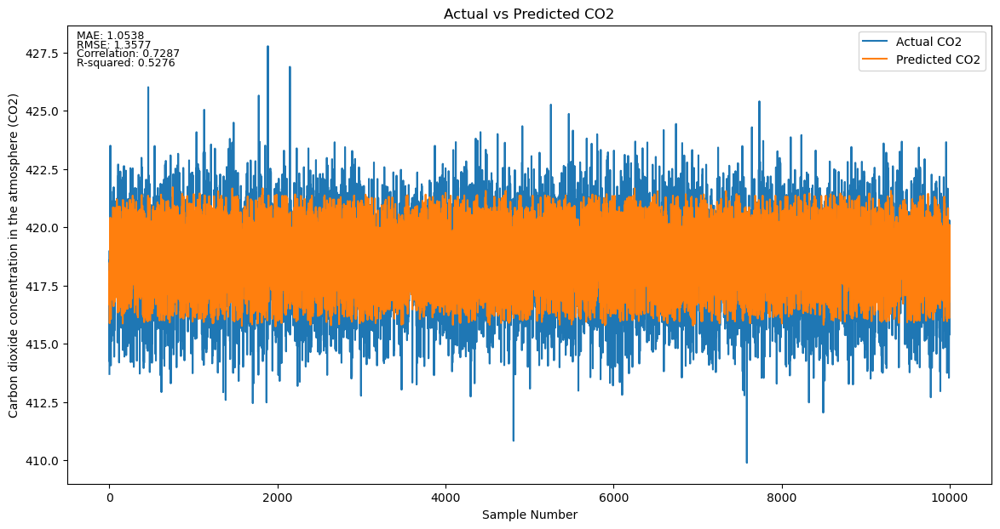

In [ ]:
# Second step to run LSTM with dates
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, Dense, Flatten
from sklearn.metrics import mean_squared_error
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.losses import BinaryCrossentropy
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from scipy.stats import pearsonr
# Assuming dataframes are combined into a single DataFrame 'df'
# df = pd.concat(list_of_dataframes)
df_combined = pd.concat(df_list, ignore_index=True)
df_combined['date'] = pd.to_datetime(df_combined['date'])
#df_combined['date'] = pd.to_datetime(df_combined['date'])
#print(df_combined.head())
# Reference point (start of the year)
df_combined['start_of_year'] = pd.to_datetime(df_combined['date'].dt.year.astype(str) + '-01-01')

# Calculate total hours from the start of the year
df_combined['hours_from_start_of_year'] = (df_combined['date'] - df_combined['start_of_year']).dt.total_seconds() / 3600

#print(df_combined[['date', 'hours_from_start_of_year']])

df_combined['time_only_hours'] =  pd.to_timedelta(df_combined['time'].astype(str)).dt.total_seconds()/ 3600 # Normalize features
df_combined['hours_lapsed'] = df_combined['hours_from_start_of_year'] + df_combined['time_only_hours']
#print(df_combined.head())
scaler = MinMaxScaler()
#df_combined[[ 'xco2']] = scaler.fit_transform(df_combined[[ 'xco2']])
# Prepare input and output
X = df_combined[['hours_lapsed', 'longitude', 'latitude']].values
y = df_combined['xco2'].values
# Reshape input for CNN+LSTM [samples, timesteps, features]
print(X[:5])
X_scaled = scaler.fit_transform(X)
y_scaled = scaler.fit_transform(y.reshape(-1, 1))
X_scaled = X_scaled.reshape((X_scaled.shape[0], 1, X_scaled.shape[1]))
#X = X.reshape((X.shape[0], 1, X.shape[1]))
#print(X.shape)
print("scaled")
print(X_scaled[:5] )
#print(me)
print(y_scaled)
# Split data into training and testing sets
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled,y_scaled, test_size=0.2, random_state=42)
#X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42)
#print(X_train)
#print(pd('star'))
# Build CNN+LSTM model
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(MaxPooling1D(pool_size=1))
model.add(LSTM(50, activation='relu'))
model.add(Dense(1))
#model.compile(optimizer='adam', loss='mse')
model.compile(optimizer=SGD(learning_rate=0.01),loss='mse')#, metrics=['accuracy'])#loss=BinaryCrossentropy(), metrics=['accuracy'])
plot_model(model, to_file='lstm_model.png', show_shapes=True, show_layer_names=True)
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=5, verbose=1, mode='min', baseline=0.1)
history = model.fit(X_train, y_train, epochs=30, batch_size=32, validation_data=(X_test, y_test), verbose=2,callbacks=[early_stopping])
# Train model
#model.fit(X_train, y_train, epochs=10, batch_size=64, validation_data=(X_test, y_test), verbose=2)

# Predict
loss = model.evaluate(X_test, y_test, verbose=2)
print(f'Test Loss: {loss}')
y_pred = model.predict(X_test)
# Inverse transform the scaled data
print("This is y test: ",y_test)
print("This is y prediction: ", y_pred)
y_test_inv = scaler.inverse_transform(y_test)
y_pred_inv = scaler.inverse_transform(y_pred)
y_test_inv = y_test_inv.flatten()
y_pred_inv = y_pred_inv.flatten()
mae = mean_absolute_error(y_test_inv, y_pred_inv)
rmse = mean_squared_error(y_test_inv, y_pred_inv, squared=False)
correlation, _ = pearsonr(y_test_inv, y_pred_inv)
r2 = r2_score(y_test_inv, y_pred_inv)

# Print metrics
print(f'Mean Absolute Error (MAE): {mae}')
print(f'Root Mean Square Error (RMSE): {rmse}')
print(f'Correlation Coefficient: {correlation}')
print(f'R-squared: {r2}')

# Plot the actual vs. predicted values
plt.figure(figsize=(14, 7))
plt.plot(y_test_inv[:10000], label='Actual CO2')
plt.plot(y_pred_inv[:10000], label='Predicted CO2')
plt.title('Actual vs Predicted CO2')
plt.xlabel('Sample Number')
plt.ylabel('Carbon dioxide concentration in the atmosphere (CO2)')
plt.legend()
# Display metrics on the plot
plt.text(0.01, 0.99, f'MAE: {mae:.4f}', transform=plt.gca().transAxes, fontsize=9, verticalalignment='top')
plt.text(0.01, 0.97, f'RMSE: {rmse:.4f}', transform=plt.gca().transAxes, fontsize=9, verticalalignment='top')
plt.text(0.01, 0.95, f'Correlation: {correlation:.4f}', transform=plt.gca().transAxes, fontsize=9, verticalalignment='top')
plt.text(0.01, 0.93, f'R-squared: {r2:.4f}', transform=plt.gca().transAxes, fontsize=9, verticalalignment='top')
plt.show()

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import r2_score
from tensorflow.keras.layers import ConvLSTM2D, BatchNormalization, Conv3D

# Load your dataset
# Assuming your dataset is in a CSV file with columns: 'time', 'longitude', 'latitude', 'sst'
#data = pd.read_csv('your_dataset.csv')

# Preprocess the data
# Fill missing values with the mean of the column
#data.fillna(data.mean(), inplace=True)
def regress_DL(X,y):
# Separate features and target
#X = data[['time', 'longitude', 'latitude']]
#y = data['sst']

# Split the data into training and testing sets
  print(len(X))
  df = pd.DataFrame(X, columns=['time', 'longitude', 'latitude'])

  # Convert the 'time' column from Unix timestamp to datetime format
  df['time'] = pd.to_datetime(df['time'])
  year_start = pd.to_datetime(df['time'].dt.year.astype(str) + '-01-01')

# Calculate the difference in days with fraction of hours since the beginning of the provided year
  df['days_since_year_start'] = (df['time'] - year_start).dt.total_seconds() / 86400

# Print the DataFrame
  print(df.columns)
# Convert datetime64[ns] to seconds since epoch
  #df['time_in_seconds'] = df['time'].astype(np.int64) / 10**9
# Split the data into training and testing sets
  df = df.drop(columns=['time'])
  print(df.columns)
  #pivot_df = df.pivot_table(index='days_since_year_start', columns=['latitude', 'longitude'], values='xco2')
  '''co2_data = pivot_df.values
  samples = 34  # Number of samples
  time_steps = 710  # Number of time steps
  latitude = 34  # Number of latitude points
  longitude = 710  # Number of longitude points
  channels = 1  # Single channel for SST

# Reshape the data
  #co2_data_4d = co2_data.reshape((samples,  latitude, longitude, channels))
  co2_data_4d[:co2_data.shape[0], :co2_data.shape[2], :co2_data.shape[2], :
# Check the shape of the reshaped data
  print("Shape after reshaping:", co2_data_4d.shape)'''
  X_train, X_test, y_train, y_test = train_test_split(df, y, test_size=0.25, random_state=30)

  # Standardize the features
  scaler = StandardScaler()
  X_train1 = scaler.fit_transform(X_train)
  X_test1 = scaler.transform(X_test)

  # Build the MLP model
  model = Sequential()
  model.add(Dense(128, input_dim=X_train1.shape[1], activation='relu'))
  model.add(Dense(64, activation='relu'))
  model.add(Dense(32, activation='relu'))
  model.add(Dense(16, activation='relu'))
  model.add(Dense(1))

  # Compile the model
  model.compile(optimizer='adam', loss='mean_squared_error')
  # Define the model

  # Train the model
  model.fit(X_train1, y_train, epochs=10, batch_size=16, validation_split=0.2)


  # Predict missing values
  predictions = model.predict(X_test1)
  print(predictions)
  # Evaluate the model
  loss = model.evaluate(X_test1, y_test)
  print(f'Model Loss: {loss}')
  plot_data=pd.DataFrame(X_test, columns=['days_since_year_start', 'longitude', 'latitude'])
  plot_data['predicted'] = predictions
  plot_data['original'] = y_test
  print(plot_data)
  # Create a 3D scatter plot
  fig = plt.figure()
  ax = fig.add_subplot(111, projection='3d')
  sc = ax.scatter(plot_data['days_since_year_start'], plot_data['longitude'], plot_data['latitude'], c=plot_data['predicted'], cmap='viridis')

  # Add color bar
  cbar = plt.colorbar(sc)
  cbar.set_label('Predicted CO2 ppm')

  # Set labels
  ax.set_xlabel('Time')
  ax.set_ylabel('Latitude')
  ax.set_zlabel('Longitude')

  # Show plot
  fig = plt.figure()
  ax = fig.add_subplot(111, projection='3d')
  sc_measured = ax.scatter(plot_data['days_since_year_start'], plot_data['longitude'], plot_data['latitude'], c=plot_data['original'], cmap='viridis', label='Measured CO2')

  # Add color bar for measured SST
  cbar_measured = plt.colorbar(sc_measured)
  cbar_measured.set_label('Measured CO2')

  # Set labels for measured SST plot
  ax.set_xlabel('Longitude')
  ax.set_ylabel('Latitude')
  ax.set_zlabel('Time (days since year start)')
  ax.set_title('Measured CO2')
  plt.show()
  r2 = r2_score(y_test, predictions)
  plt.figure(figsize=(10, 6))
  plt.scatter(y_test, predictions, alpha=0.5)
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
  plt.xlabel('Measured co2')
  plt.ylabel('Predicted co2')
  plt.title(f'Predicted vs Measured Co2\nR-squared: {r2:.2f}')
  plt.show()

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import r2_score
from tensorflow.keras.layers import ConvLSTM2D, BatchNormalization, Conv3D
from sklearn.preprocessing import MinMaxScaler

# Load your dataset
# Assuming your dataset is in a CSV file with columns: 'time', 'longitude', 'latitude', 'sst'
#data = pd.read_csv('your_dataset.csv')

# Preprocess the data
# Fill missing values with the mean of the column
#data.fillna(data.mean(), inplace=True)
def regress_DL2(df):
  scaler = MinMaxScaler()
  df[['time', 'longitude', 'latitude', 'xco2']] = scaler.fit_transform(df[['time', 'longitude', 'latitude', 'xco2']])
  def create_sequences(data, seq_length):
    xs, ys = [], []
    for i in range(len(data) - seq_length):
        x = data[i:i+seq_length]
        y = data[i+seq_length]
        xs.append(x)
        ys.append(y)
    return np.array(xs), np.array(ys)

  seq_length = 30
  X, y = create_sequences(df[['time', 'longitude', 'latitude', 'xco2']].values, seq_length)
  split = int(0.8 * len(X))
  X_train, X_test = X[:split], X[split:]
  y_train, y_test = y[:split], y[split:]
  print(y_train)
  print(y_test)
  model = Sequential()
  model.add(LSTM(50, return_sequences=True, input_shape=(seq_length, 4)))
  model.add(LSTM(50))
  model.add(Dense(1))
  model.compile(optimizer='adam', loss='mse')
  history = model.fit(X_train, y_train, epochs=10, batch_size=64, validation_split=0.2)
  loss = model.evaluate(X_test, y_test)
  predictions = model.predict(X_test)

# Assuming labels are in a separate column

  X_test_2d = X_test.reshape(X_test.shape[0], -1)  # Flatten the last two dimensions

  plot_data = pd.DataFrame(X_test_2d, columns=['days_since_year_start', 'longitude', 'latitude', 'other_feature'])  # Adjust column names if necessary

  # Proceed with the rest of your code
  plot_data['predicted'] = predictions
  plot_data['original'] = y_test
  print(plot_data)
  # Create a 3D scatter plot
  fig = plt.figure()
  ax = fig.add_subplot(111, projection='3d')
  sc = ax.scatter(plot_data['days_since_year_start'], plot_data['longitude'], plot_data['latitude'], c=plot_data['predicted'], cmap='viridis')

  # Add color bar
  cbar = plt.colorbar(sc)
  cbar.set_label('Predicted CO2 ppm')

  # Set labels
  ax.set_xlabel('Time')
  ax.set_ylabel('Latitude')
  ax.set_zlabel('Longitude')

  # Show plot
  fig = plt.figure()
  ax = fig.add_subplot(111, projection='3d')
  sc_measured = ax.scatter(plot_data['days_since_year_start'], plot_data['longitude'], plot_data['latitude'], c=plot_data['original'], cmap='viridis', label='Measured CO2')

  # Add color bar for measured SST
  cbar_measured = plt.colorbar(sc_measured)
  cbar_measured.set_label('Measured CO2')

  # Set labels for measured SST plot
  ax.set_xlabel('Longitude')
  ax.set_ylabel('Latitude')
  ax.set_zlabel('Time (days since year start)')
  ax.set_title('Measured CO2')
  plt.show()
  r2 = r2_score(y_test, predictions)
  plt.figure(figsize=(10, 6))
  plt.scatter(y_test, predictions, alpha=0.5)
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
  plt.xlabel('Measured co2')
  plt.ylabel('Predicted co2')
  plt.title(f'Predicted vs Measured Co2\nR-squared: {r2:.2f}')
  plt.show()

In [ ]:

import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from tensorflow.keras.utils import plot_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
df_combined = pd.concat(df_list, ignore_index=True)
df_combined.reset_index(drop=True, inplace=True)
df_combined['date'] = pd.to_datetime(df_combined['date']).astype('int64') / 10**9
df_combined['time'] =  pd.to_timedelta(df_combined['time'].astype(str)).dt.total_seconds()/ 3600 #pd.to_datetime(df_combined['time']).dt.hour
print(df_combined.head())
X = df_combined[['date','time', 'longitude', 'latitude']]
y = df_combined['xco2']
# Normalize features
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)
y_scaled = scaler.fit_transform(y.values.reshape(-1, 1))
X_scaled = X_scaled.reshape((X_scaled.shape[0], 1, X_scaled.shape[1]))
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=42)
# Print the model summary
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')
plot_model(model, to_file='lstm_model.png', show_shapes=True, show_layer_names=True)
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=5, verbose=1, mode='min', baseline=0.1)
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test), verbose=2,callbacks=[early_stopping])
#model.fit(X, y, epochs=20, batch_size=32)
loss = model.evaluate(X_test, y_test, verbose=2)
print(f'Test Loss: {loss}')
y_pred = model.predict(X_test)
r2 = r2_score(y_test_inv, y_pred_inv)
print(f'R-squared: {r2}')
# Inverse transform the scaled data
y_test_inv = scaler.inverse_transform(y_test)
y_pred_inv = scaler.inverse_transform(y_pred)

# Plot the actual vs. predicted values
plt.figure(figsize=(14, 7))
plt.plot(y_test_inv, label='Actual CO2')
plt.plot(y_pred_inv, label='Predicted CO2')
plt.title('Actual vs Predicted CO2')
plt.xlabel('Sample Number')
plt.ylabel('Carbon dioxide concentration in the atmosphere (CO2)')
plt.legend()
plt.show()

Mean Absolute Error (MAE): 1.013634204864502
Root Mean Square Error (RMSE): 1.3370047807693481
Correlation Coefficient: 0.696628296189161
R-squared: 0.48270890290551494


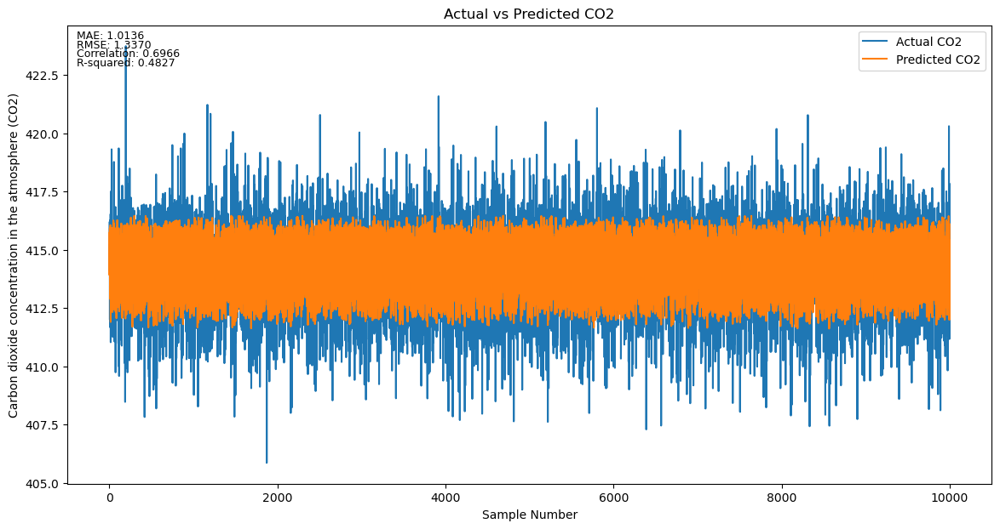

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from scipy.stats import pearsonr

# Ensure the arrays are 1-dimensional
y_test_inv = y_test_inv.flatten()
y_pred_inv = y_pred_inv.flatten()

# Calculate metrics
mae = mean_absolute_error(y_test_inv, y_pred_inv)
rmse = mean_squared_error(y_test_inv, y_pred_inv, squared=False)
correlation, _ = pearsonr(y_test_inv, y_pred_inv)
r2 = r2_score(y_test_inv, y_pred_inv)
# Print metrics
print(f'Mean Absolute Error (MAE): {mae}')
print(f'Root Mean Square Error (RMSE): {rmse}')
print(f'Correlation Coefficient: {correlation}')
print(f'R-squared: {r2}')

# Plot the actual vs. predicted values
plt.figure(figsize=(14, 7))
plt.plot(y_test_inv[:10000], label='Actual CO2')
plt.plot(y_pred_inv[:10000], label='Predicted CO2')
plt.title('Actual vs Predicted CO2')
plt.xlabel('Sample Number')
plt.ylabel('Carbon dioxide concentration in the atmosphere (CO2)')
plt.legend()

# Display metrics on the plot
plt.text(0.01, 0.99, f'MAE: {mae:.4f}', transform=plt.gca().transAxes, fontsize=9, verticalalignment='top')
plt.text(0.01, 0.97, f'RMSE: {rmse:.4f}', transform=plt.gca().transAxes, fontsize=9, verticalalignment='top')
plt.text(0.01, 0.95, f'Correlation: {correlation:.4f}', transform=plt.gca().transAxes, fontsize=9, verticalalignment='top')
plt.text(0.01, 0.93, f'R-squared: {r2:.4f}', transform=plt.gca().transAxes, fontsize=9, verticalalignment='top')

plt.show()
